# Computational Linear Algebra: PCA Homework

## Initialization:

**Academic Year:** 2024/2025

### Team Members (Alphabetical Order):
1. Gashi, Aurona (s322791);
2. Roviera, Elisabetta (s328422).

In [1]:
StudentID1 = 322791 
StudentID2 = 328422

## Starting Code-Cell 
### Attention: DO NOT CHANGE THE CODE INSIDE THE FOLLOWING CELL!

In [2]:
####################################################################
############## DO NOT CHANGE THE CODE IN THIS CELL #################
####################################################################

import numpy as np

var_entertainment_feat_types = ['Interests', 'Movies', 'Music']
var_personal_feat_types = ['Finance', 'Phobias']
fixed_feat_types = ['Personality', 'Health']

label_types = ['Demographic']

variables_by_type = {
    'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 
                     'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type',
                     'Home Type'],
    'Finance': ['Finances', 'Shopping centres', 'Branded clothing', 
                'Entertainment spending', 'Spending on looks', 
                'Spending on gadgets', 'Spending on healthy eating'],
    'Health': ['Smoking', 'Alcohol', 'Healthy eating'],
    'Interests': ['History', 'Psychology', 'Politics', 'Mathematics', 
                  'Physics', 'Internet', 'PC', 'Economy Management', 
                  'Biology', 'Chemistry', 'Reading', 'Geography', 
                  'Foreign languages', 'Medicine', 'Law', 'Cars', 
                  'Art exhibitions', 'Religion', 'Countryside, outdoors', 
                  'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                  'Active sport', 'Gardening', 'Celebrities', 'Shopping', 
                  'Science and technology', 'Theatre', 'Fun with friends', 
                  'Adrenaline sports', 'Pets'],
    'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 
               'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 
               'Documentary', 'Western', 'Action'],
    'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 
              'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 
              'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 
              'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 
              'Techno, Trance', 'Opera'],
    'Personality': ['Daily events', 'Prioritising workload', 
                    'Writing notes', 'Workaholism', 'Thinking ahead', 
                    'Final judgement', 'Reliability', 'Keeping promises', 
                    'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 
                    'Self-criticism', 'Judgment calls', 'Hypochondria', 
                    'Empathy', 'Eating to survive', 'Giving', 
                    'Compassion to animals', 'Borrowed stuff', 
                    'Loneliness', 'Cheating in school', 'Health', 
                    'Changing the past', 'God', 'Dreams', 'Charity', 
                    'Number of friends', 'Punctuality', 'Lying', 'Waiting', 
                    'New environment', 'Mood swings', 'Appearence and gestures', 
                    'Socializing', 'Achievements', 'Responding to a serious letter', 
                    'Children', 'Assertiveness', 'Getting angry', 
                    'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 
                    'Energy levels', 'Small - big dogs', 'Personality', 
                    'Finding lost valuables', 'Getting up', 'Interests or hobbies', 
                    "Parents' advice", 'Questionnaires or polls', 'Internet usage'],
    'Phobias': ['Flying', 'Storm', 'Darkness', 'Heights', 'Spiders', 'Snakes', 
                'Rats', 'Ageing', 'Dangerous dogs', 'Fear of public speaking']
}

labels = variables_by_type['Demographics'] # all the columns that represents the label

try:
    random_seed = min([StudentID1, StudentID2])
except NameError:
    random_seed = StudentID1

def which_featgroups():
    np.random.seed(random_seed)
    these_entertainments = np.random.choice(var_entertainment_feat_types, 2, replace=False).tolist()
    these_personal = np.random.choice(var_personal_feat_types, 1, replace=False).tolist()
    these_types = fixed_feat_types + these_personal + these_entertainments
    print('*** THESE ARE THE SELECTED TYPE OF VARIABLES:')
    for k in these_types:
        print(f'{k}')
    print('*************************************')
    return these_types

def which_features(these_types):
    np.random.seed(random_seed)
    these_features = []
    for type in these_types:
        if type != 'Personality':
            these_features += variables_by_type[type]
        else:
            these_features += np.random.choice(variables_by_type[type], 
                                               int(2 * (len(variables_by_type[type]) / 3)), 
                                               replace=False).tolist()
    print('*** THESE ARE THE SELECTED FEATURES:')
    for ft in these_features:
        print(f'{ft}')
    print('*************************************')
    return these_features

# Automatically ganerate the type of the data 
these_types = which_featgroups()
these_features = which_features(these_types)

np.random.seed(random_seed) # to ensure reproducibility

*** THESE ARE THE SELECTED TYPE OF VARIABLES:
Personality
Health
Phobias
Music
Movies
*************************************
*** THESE ARE THE SELECTED FEATURES:
Finding lost valuables
Keeping promises
Achievements
Socializing
Lying
Knowing the right people
Dreams
Punctuality
Getting angry
Responding to a serious letter
Judgment calls
Eating to survive
Compassion to animals
Mood swings
Writing notes
Appearence and gestures
Loneliness
Giving
Getting up
Personality
Assertiveness
Friends versus money
Unpopularity
Energy levels
Parents' advice
Fake
Borrowed stuff
Loss of interest
Funniness
Internet usage
Changing the past
Final judgement
Daily events
Hypochondria
Thinking ahead
Life struggles
Interests or hobbies
Waiting
Smoking
Alcohol
Healthy eating
Flying
Storm
Darkness
Heights
Spiders
Snakes
Rats
Ageing
Dangerous dogs
Fear of public speaking
Music
Slow songs or fast songs
Dance
Folk
Country
Classical music
Musical
Pop
Rock
Metal or Hardrock
Punk
Hiphop, Rap
Reggae, Ska
Swing, Jazz
Rock 

## Importing Modules

In the following cell, import all the modules you think are necessary for doing the homework, **among the ones listed and used during the laboratories of the course**.
No extra modules are allowed for reproducibility.

In [71]:
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.cm as cm
from matplotlib import colormaps
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, confusion_matrix, homogeneity_score, completeness_score, v_measure_score
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics.cluster import adjusted_rand_score, normalized_mutual_info_score

## Exercise 1. Preparing the Dataset

In the cells below, do the following operations:
1. load the dataset "_responses_hw.csv_";
2. create a working dataframe extracting from _responses_hw.csv_ the columns corresponding to the variables in _these_features_, and randomly selecting 2/3 of the rows. Let us call this dataframe _X_df_;
3. analyze the obtained dataframe and performing cleansing/encoding operations.

#### 1.1) Store in the variable X_df_tot the dataframe obtained from the .csv file

In [4]:
X_df_tot = pd.read_csv("responses_hw.csv")
X_df_tot.shape

(1010, 150)

In [5]:
X_df_tot.index = X_df_tot.index + 1 # So that this df has the same index of the csv file
X_df_tot

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
1,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right,college/bachelor degree,no,village,block of flats
2,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right,college/bachelor degree,no,city,block of flats
3,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right,secondary school,no,city,block of flats
4,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right,college/bachelor degree,yes,city,house/bungalow
5,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1006,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right,secondary school,no,city,house/bungalow
1007,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left,masters degree,no,village,house/bungalow
1008,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right,secondary school,yes,city,block of flats
1009,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right,college/bachelor degree,no,city,block of flats


#### 1.2) Create our dataframe X_df_combined
Now, we delete the rows and columns of the dataset using the random_seed. We will create the dataset called 'X_df_combined', that also contains the columns in 'labels'. Later on, we will define X_df by dropping the columns in 'labels'.

In [6]:
# Drop rows
num_tot_rows = int((2 / 3) * X_df_tot.shape[0]) # Calculate the number of rows to include in the final df: 2/3 of the original dataframe
X_df_rows = X_df_tot.sample(n = num_tot_rows, random_state = random_seed) # Create X_df_rows by randomly sampling the rows

# Make the dataset that will NOT be used to find PCs and in K-means as it contains the labels
combined_features = these_features + labels
# Extract the corresponding columns from X_df
X_df_combined = X_df_rows[combined_features]

X_df_combined.shape

(673, 92)

In [7]:
X_df_combined

,Finding lost valuables,Keeping promises,Achievements,Socializing,Lying,Knowing the right people,Dreams,Punctuality,Getting angry,Responding to a serious letter,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
694,3.0,5.0,2.0,2.0,sometimes,3.0,3,on time,3.0,1.0,...,18.0,171.0,69.0,1.0,female,right,secondary school,yes,village,block of flats
942,3.0,2.0,3.0,5.0,everytime it suits me,5.0,3,late,4.0,1.0,...,18.0,172.0,55.0,3.0,female,right,primary school,no,village,house/bungalow
716,3.0,4.0,3.0,3.0,sometimes,3.0,3,early,3.0,4.0,...,29.0,183.0,111.0,1.0,male,left,secondary school,no,village,house/bungalow
252,4.0,4.0,2.0,3.0,sometimes,3.0,3,on time,3.0,2.0,...,19.0,164.0,60.0,2.0,female,right,secondary school,no,village,house/bungalow
229,3.0,4.0,2.0,4.0,sometimes,2.0,3,early,3.0,3.0,...,20.0,157.0,48.0,2.0,female,right,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979,5.0,4.0,4.0,3.0,only to avoid hurting someone,4.0,4,on time,1.0,4.0,...,21.0,165.0,60.0,2.0,female,right,college/bachelor degree,no,city,house/bungalow
183,2.0,4.0,3.0,2.0,sometimes,3.0,4,early,2.0,1.0,...,19.0,158.0,47.0,0.0,female,right,secondary school,yes,city,house/bungalow
669,3.0,4.0,2.0,3.0,sometimes,4.0,3,early,3.0,3.0,...,27.0,186.0,82.0,1.0,male,left,doctorate degree,yes,city,house/bungalow
87,4.0,4.0,3.0,4.0,sometimes,2.0,4,late,1.0,4.0,...,24.0,179.0,65.0,3.0,male,right,masters degree,no,city,block of flats


Let us look, for all categorical features, at the various response possibilities in order to encode them later. 

In [8]:
X_df_combined['Education'].unique()

array(['secondary school', 'primary school', 'college/bachelor degree',
       'currently a primary school pupil', 'masters degree', nan,
       'doctorate degree'], dtype=object)

In [9]:
X_df_combined['Lying'].unique()

array(['sometimes', 'everytime it suits me',
       'only to avoid hurting someone', 'never', nan], dtype=object)

In [10]:
X_df_combined['Punctuality'].unique()

array(['on time', 'late', 'early', nan], dtype=object)

In [11]:
X_df_combined['Internet usage'].unique()

array(['few hours a day', 'less than an hour a day', 'most of the day',
       'no time at all'], dtype=object)

In [12]:
X_df_combined['Smoking'].unique()

array(['tried smoking', 'current smoker', 'never smoked', 'former smoker',
       nan], dtype=object)

In [13]:
X_df_combined['Alcohol'].unique()

array(['never', nan, 'social drinker', 'drink a lot'], dtype=object)

In [14]:
X_df_combined['Gender'].unique()

array(['female', 'male', nan], dtype=object)

In [15]:
X_df_combined['Hand'].unique()

array(['right', 'left', nan], dtype=object)

In [16]:
X_df_combined['Only child'].unique()

array(['yes', 'no', nan], dtype=object)

In [17]:
X_df_combined['Home Town Type'].unique()

array(['village', 'city', nan], dtype=object)

In [18]:
X_df_combined['Home Type'].unique()

array(['block of flats', 'house/bungalow', nan], dtype=object)

#### 1.3) Print of the dataset
Initial exploration of the dataset.

In [19]:
# Reorder the df by index
X_df_combined = X_df_combined.sort_index() 

In [20]:
X_df_combined.head()

,Finding lost valuables,Keeping promises,Achievements,Socializing,Lying,Knowing the right people,Dreams,Punctuality,Getting angry,Responding to a serious letter,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
2,4.0,4.0,2.0,4.0,sometimes,4.0,3,early,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right,college/bachelor degree,no,city,block of flats
4,1.0,4.0,3.0,1.0,only to avoid hurting someone,4.0,3,early,5.0,3.0,...,22.0,172.0,59.0,1.0,female,right,college/bachelor degree,yes,city,house/bungalow
5,2.0,4.0,3.0,3.0,everytime it suits me,3.0,3,on time,2.0,3.0,...,20.0,170.0,59.0,1.0,female,right,secondary school,no,village,house/bungalow
6,3.0,4.0,2.0,4.0,only to avoid hurting someone,4.0,3,early,3.0,2.0,...,20.0,186.0,77.0,1.0,male,right,secondary school,no,city,block of flats
7,2.0,5.0,4.0,5.0,never,4.0,3,early,3.0,3.0,...,20.0,177.0,50.0,1.0,female,right,secondary school,no,village,house/bungalow


In [21]:
X_df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 673 entries, 2 to 1010
Data columns (total 92 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Finding lost valuables          669 non-null    float64
 1   Keeping promises                672 non-null    float64
 2   Achievements                    673 non-null    float64
 3   Socializing                     670 non-null    float64
 4   Lying                           671 non-null    object 
 5   Knowing the right people        672 non-null    float64
 6   Dreams                          673 non-null    int64  
 7   Punctuality                     671 non-null    object 
 8   Getting angry                   669 non-null    float64
 9   Responding to a serious letter  667 non-null    float64
 10  Judgment calls                  671 non-null    float64
 11  Eating to survive               673 non-null    int64  
 12  Compassion to animals           670 non-

In [22]:
X_df_combined_describe = X_df_combined.describe(include='all').map(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)
X_df_combined_describe

,Finding lost valuables,Keeping promises,Achievements,Socializing,Lying,Knowing the right people,Dreams,Punctuality,Getting angry,Responding to a serious letter,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
count,669.00,672.00,673.00,670.00,671,672.00,673.00,671,669.00,667.00,...,667.00,658.00,657.00,668.00,668,670,672,671,669,669
unique,nan,nan,nan,nan,4.00,nan,nan,3.00,nan,nan,...,nan,nan,nan,nan,2.00,2.00,6.00,2.00,2.00,2.00
top,nan,nan,nan,nan,sometimes,nan,nan,on time,nan,nan,...,nan,nan,nan,nan,female,right,secondary school,no,city,block of flats
freq,nan,nan,nan,nan,371,nan,nan,249,nan,nan,...,nan,nan,nan,nan,400,599,419,498,460,380
mean,2.90,3.98,2.93,3.14,nan,3.47,3.29,nan,3.01,3.11,...,20.30,173.40,66.06,1.31,nan,nan,nan,nan,nan,nan
std,1.25,0.90,0.92,1.12,nan,1.10,0.67,nan,1.19,1.17,...,2.79,9.51,13.74,1.04,nan,nan,nan,nan,nan,nan
min,1.00,1.00,1.00,1.00,nan,1.00,1.00,nan,1.00,1.00,...,15.00,148.00,43.00,0.00,nan,nan,nan,nan,nan,nan
25%,2.00,3.00,2.00,2.00,nan,3.00,3.00,nan,2.00,2.00,...,19.00,166.00,55.00,1.00,nan,nan,nan,nan,nan,nan
50%,3.00,4.00,3.00,3.00,nan,4.00,3.00,nan,3.00,3.00,...,20.00,173.00,64.00,1.00,nan,nan,nan,nan,nan,nan
75%,4.00,5.00,3.00,4.00,nan,4.00,4.00,nan,4.00,4.00,...,21.00,180.00,75.00,2.00,nan,nan,nan,nan,nan,nan


#### 1.4) Encoding of the Dataset 
Since some of the columns contain values of type 'object', we perform a customized Label Encoding on them in order to then apply our methods on the datasets.
Coding is performed following a map: to each previously observed categorical value, a progressive integer number is associated, from 1 up to the total number of distinct values for that characteristic.

In [23]:
categorical_cols = X_df_combined.select_dtypes(include=['object']).columns # Categorical columns

# ENCODING
encoded_df_combined = X_df_combined.copy()

for col in categorical_cols: # Definition of the map that we use to encode the values
    mapping = {
        'never': 1, 
        'only to avoid hurting someone': 2, 
        'sometimes': 3, 
        'everytime it suits me': 4, 
        'early': 1, 
        'on time': 2, 
        'late': 3, 
        'no time at all': 1, 
        'few hours a day': 2, 
        'less than an hour a day': 3, 
        'most of the day': 4, 
        'never smoked': 1, 
        'former smoker': 2, 
        'tried smoking': 3, 
        'current smoker': 4, 
        'social drinker': 2, 
        'drink a lot': 3,  
        'female' : 1, 
        'male' : 2, 
        'left' : 1, 
        'right' : 2, 
        'currently a primary school pupil' : 1,
        'primary school' : 2, 
        'secondary school' : 3, 
        'college/bachelor degree' : 4, 
        'masters degree' : 5, 
        'doctorate degree' : 6, 
        'no' : 1, 
        'yes' : 2, 
        'city' : 1, 
        'village' : 2, 
        'house/bungalow' : 1, 
        'block of flats' : 2    
    }

    # Map the values in the DataFrame using the mapping
    encoded_df_combined[col] = encoded_df_combined[col].map(mapping)

# Print the results
for col in categorical_cols:
  print(f"Categorical columns: {col} - Values:")
  for key, value in mapping.items():
    if key in X_df_combined[col].unique():
      print(f"  {key}: {value}")

Categorical columns: Lying - Values:
  never: 1
  only to avoid hurting someone: 2
  sometimes: 3
  everytime it suits me: 4
Categorical columns: Punctuality - Values:
  early: 1
  on time: 2
  late: 3
Categorical columns: Internet usage - Values:
  no time at all: 1
  few hours a day: 2
  less than an hour a day: 3
  most of the day: 4
Categorical columns: Smoking - Values:
  never smoked: 1
  former smoker: 2
  tried smoking: 3
  current smoker: 4
Categorical columns: Alcohol - Values:
  never: 1
  social drinker: 2
  drink a lot: 3
Categorical columns: Gender - Values:
  female: 1
  male: 2
Categorical columns: Hand - Values:
  left: 1
  right: 2
Categorical columns: Education - Values:
  currently a primary school pupil: 1
  primary school: 2
  secondary school: 3
  college/bachelor degree: 4
  masters degree: 5
  doctorate degree: 6
Categorical columns: Only child - Values:
  no: 1
  yes: 2
Categorical columns: Home Town Type - Values:
  city: 1
  village: 2
Categorical columns: H

#### 1.5) Balance analysis of the dataset
We now analyse the distribution of classes within the dataset to assess the balance. In other words, we check, for each feature, whether the different possible categories or values are represented proportionally. Initially, this analysis was conducted by means of a summary table. Next, a stacked bar graph was generated to visualise the distribution of each feature, where each coloured segment within a bar represents a specific category or value.

In [24]:
pivot_table = encoded_df_combined[these_features].melt().groupby(['variable', 'value']).size().to_frame('count').reset_index()

# Calculate the percentage
pivot_table['percent'] = pivot_table.groupby('variable')['count'].transform(lambda x: x / x.sum())

# Pivot the table and reindex by value
pivot_table = pivot_table.pivot(index='value', columns='variable', values='percent')

pivot_table

variable,Achievements,Action,Ageing,Alcohol,Alternative,Animated,Appearence and gestures,Assertiveness,Borrowed stuff,Changing the past,...,Storm,"Swing, Jazz","Techno, Trance",Thinking ahead,Thriller,Unpopularity,Waiting,War,Western,Writing notes
value,,,,,,,,,,,,,,,,,,,,,
1.0,0.075780,0.063988,0.311012,0.137109,0.209268,0.050671,0.019345,0.044709,0.025298,0.169391,...,0.459138,0.206587,0.374251,0.050746,0.074405,0.074627,0.126677,0.137109,0.375559,0.177612
2.0,0.200594,0.174107,0.183036,0.645306,0.218236,0.128167,0.078869,0.122206,0.059524,0.209510,...,0.258544,0.226048,0.196108,0.158209,0.190476,0.083582,0.292101,0.192250,0.299553,0.186567
3.0,0.478455,0.205357,0.238095,0.217586,0.248132,0.180328,0.345238,0.318927,0.177083,0.291233,...,0.158990,0.261976,0.196108,0.311940,0.236607,0.365672,0.391952,0.269747,0.196721,0.223881
4.0,0.210996,0.287202,0.129464,NaN,0.168909,0.253353,0.372024,0.292101,0.309524,0.185736,...,0.071322,0.214072,0.145210,0.256716,0.302083,0.253731,0.147541,0.166915,0.081967,0.204478
5.0,0.034175,0.269345,0.138393,NaN,0.155456,0.387481,0.184524,0.222057,0.428571,0.144131,...,0.052006,0.091317,0.088323,0.222388,0.196429,0.222388,0.041729,0.233979,0.046200,0.207463


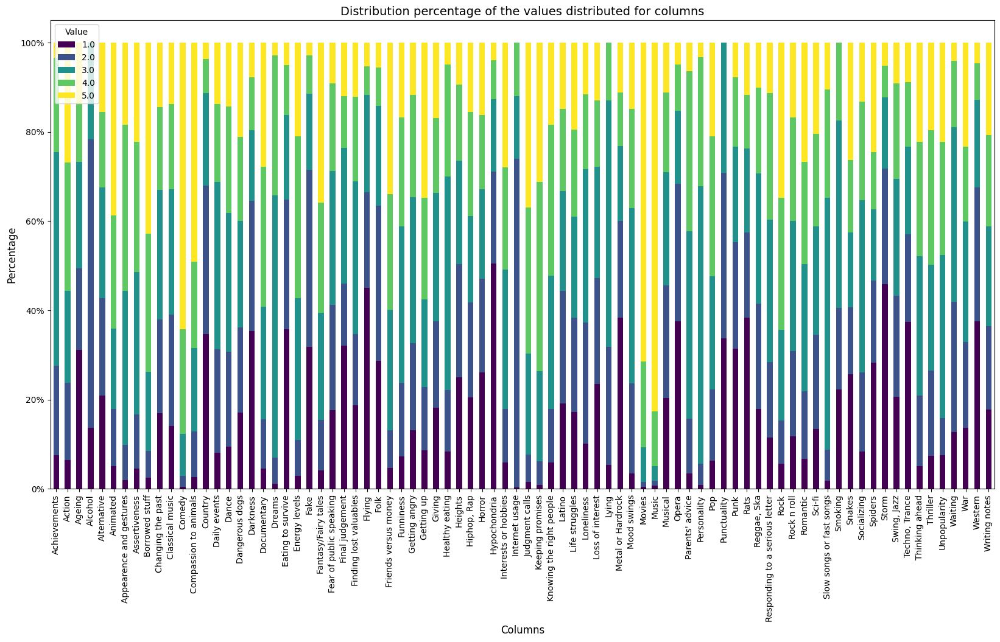

In [25]:
pivot_table.T.plot(kind='bar', stacked=True, colormap='viridis', figsize=(20, 10))

plt.xlabel('Columns', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Distribution percentage of the values distributed for columns', fontsize=14)
plt.xticks(rotation=90)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1], ['0%', '20%', '40%', '60%', '80%', '100%']) 
plt.legend(title='Value')

plt.show()

We can see that the dataset is not balanced. Therefore later on, when we apply our classification methods to fill the missing values, we will set the parameter 'stratify' during the training phase to be sure that the proportions of the elements in the training and in the test set are the same.

#### 1.6) Clean the Dataset from missing values
We now proceed with the analysis of the missing values within the dataset. The objective is to quantify and locate these values in order to evaluate the most appropriate management strategy: opting for the removal of the affected rows/columns or, alternatively, implementing filling techniques. In the latter case, the most appropriate filling methodologies will be defined.

##### 1.6.1) Missing values
Search for null values within the dataframe.
It can be seen that the missing values are distributed in most of the columns, albeit in limited quantities for each.

In [26]:
missing_values = encoded_df_combined.isnull().sum(axis=0) # Calculates the count of missing values per column
missing_values = missing_values[missing_values > 0] 
print(missing_values.to_string())

Finding lost valuables             4
Keeping promises                   1
Socializing                        3
Lying                              2
Knowing the right people           1
Punctuality                        2
Getting angry                      4
Responding to a serious letter     6
Judgment calls                     2
Compassion to animals              3
Mood swings                        3
Writing notes                      3
Appearence and gestures            1
Loneliness                         1
Giving                             2
Getting up                         3
Personality                        3
Assertiveness                      2
Friends versus money               4
Unpopularity                       3
Energy levels                      4
Parents' advice                    2
Fake                               1
Borrowed stuff                     1
Loss of interest                   4
Funniness                          4
Final judgement                    5
D

##### 1.6.2) Columns that contain missing values
We proceed with the calculation of the number of rows that would be removed from the dataset as a result of the elimination of incomplete observations (containing NaN values).

In [27]:
X_df_combined_cleaned = encoded_df_combined.dropna() # Deletion of the rows that contain NaN values
sum(X_df_combined_cleaned.isnull().any())  

0

In [28]:
X_df_combined_cleaned.shape

(509, 92)

In [29]:
missing_values_col = [] # List of the names of the columns that contain missing values
for value in missing_values.index:
    missing_values_col.append(value)

**Since the number of missing values is not negligible, we thought of two different approaches on how to handle the missing values:**

1. Drop the rows containing missing values;
2. Replace the missing values by trying different approaches. These include:
   - Filling with column mode;
   - Filling with column average;
   - Filling with the minimum of the assumed values per column;
   - Filling by performing a variety of classification methods on each column with missing values.

   In order to be sure which of these approaches is the most effective at predicting the missing data, the `X_df_combined_cleaned` dataset will be divided into a training set and a test set. Subsequently, the error will be calculated using accuracy. Finally, the 'best' methodology will be applied to the entire dataset in order to fill in the missing values.

In the very next section, we will apply our methods to obtain the filled dataset.

##### 1.6.3) Hyperparameter tuning
First, we divide the cleaned dataset in training and test set and we compute *for each column* in 'missing_values_col' the minimum, the mode, the mean. Then, the accuracy is calculated by conforming the value assigned to each element to the actual value present in `y_test`.

In [30]:
# MIN - MODE - MEAN
accuracy_min = []
accuracy_mode = []
accuracy_mean = []

for col in missing_values_col:
    X_train, X_test, y_train, y_test = train_test_split(X_df_combined_cleaned.drop(col, axis=1), X_df_combined_cleaned[col], test_size=0.2, random_state=42)
    
    # Compute the "predicted" values for y_test
    min_value = [min(y_train)] * len(y_test)
    
    counts = np.bincount(y_train.astype(int)) # Counts the number of occurrences of each non-negative value in an array of inter
    mode_value = [np.argmax(counts)] * len(y_test)
    
    # Calculate mean using numpy
    mean_value = [int(np.mean(y_train))] * len(y_test)

    # Append accuracy scores
    accuracy_min.append(accuracy_score(y_test, min_value))
    accuracy_mode.append(accuracy_score(y_test, mode_value))
    accuracy_mean.append(accuracy_score(y_test, mean_value))

Now, we will perform the classification methods and find the best ones.
We will do this not by considering every column on its own, but we consider the categories of columns: the columns are divided into groups based on what the question each column represents, so the columns within a certain category have something in common.
This idea will be better explained later.

In [31]:
# Compute a dictionary containing as key se the categories and as value a list containing the filtered columns belonging to it
filtered_variables_by_type = {
    key: [col for col in columns if col in (these_features + labels)]
    for key, columns in variables_by_type.items()   
}

filtered_variables_by_type = {
    key: cols for key, cols in filtered_variables_by_type.items() if cols
} # Dict that contains Group : [Name of all the features that belong to that group]
print(filtered_variables_by_type)

{'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type', 'Home Type'], 'Health': ['Smoking', 'Alcohol', 'Healthy eating'], 'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 'Documentary', 'Western', 'Action'], 'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 'Techno, Trance', 'Opera'], 'Personality': ['Daily events', 'Writing notes', 'Thinking ahead', 'Final judgement', 'Keeping promises', 'Loss of interest', 'Friends versus money', 'Funniness', 'Fake', 'Judgment calls', 'Hypochondria', 'Eating to survive', 'Giving', 'Compassion to animals', 'Borrowed stuff', 'Loneliness', 'Changing the past', 'Dreams', 'Punctuality', 'Lying', 'Waiting', 'Mood swings', 'Appearence an

In [32]:
def mean_computation(dic):
    new_dict = {}
    for key, value in dic.items():
        new_dict[key] = np.mean(value) if len(value) > 0 else 0
    return new_dict

As we said before, we divide the classification by categories: since the columns in each category have more similarities with the others inside of it, while could have no relation with the columns outside of that category, in order to peform a better classification, we consider each category on its own and use only the part of the 'X_df_combined_cleaned' dataset containing the columns of the analyzed category in order to perform the classification methods on it. This way, we try to not bring useless information from other columns that do not belong to that group.

We will perform a *grid-search* method for each classifier, in order to find the best parameters in terms of accurcay inside of each category.
The analyzed classifiers are:
1. KNN
2. Radius Classifier
3. Random Forsest
4. SVC
5. Naive Bayes

In [33]:
# Lists that will contain the maximum - mean (inside of every group) accuracies of classifier
knn_ = []
rn_ = []
rf_ = []
svc_ = []
multi_ = []
# For every category 
for name_group in filtered_variables_by_type.keys():
    columns = filtered_variables_by_type[name_group]
    # Re-difine X_df_combined_cleaned to contain only the columns of the current category
    X_df_combined_cleaned = encoded_df_combined[columns].copy().dropna()

    accuracy_knn = {}
    accuracy_rn = {}
    accuracy_rf = {}
    accuracy_svc = {}
    accuracy_multi = {}
    for col in columns:
        if col in missing_values_col:
            X_df_group = X_df_combined_cleaned.copy() # Copy of the df to not modify the original one
            X_df_group = X_df_group.drop(X_df_group.columns[~X_df_group.columns.isin(columns)], axis=1)
            X_df_group = X_df_group[X_df_group[col].map(X_df_group[col].value_counts()) > 1] # Drop the classes with only one value
            X_train, X_test, y_train, y_test = train_test_split(X_df_group.drop(col, axis=1), X_df_group[col], test_size=0.2, random_state=42, stratify=X_df_group[col])
            
            #Perform a grid-search for the current column, inside the current category, for every classifier
            # OPTION 1 - KNN
            param_grid_knn = {
                'n_neighbors': [5, 10, 20, 30, 40, 50, 55, 60, 65, 70],
                'weights': ['uniform', 'distance'],
                'metric': ['manhattan', 'euclidean']
            }
         
            for config in ParameterGrid(param_grid_knn):
                knn = KNeighborsClassifier(**config)
                knn.fit(X_train, y_train)
                y_pred_knn = knn.predict(X_test)
                accuracy_knn.setdefault(str(config), []).append(accuracy_score(y_test, y_pred_knn)) # Append the config and the accuracy
            
            
            # OPTION 2 - RADIUS CLASSIFIER
            param_grid_radius = {
                'radius': [50, 60, 70],
                'weights': ['uniform', 'distance'],
                'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                'leaf_size': [10, 20, 30],
                'metric': ['manhattan', 'euclidean']
            }
        
            for config in ParameterGrid(param_grid_radius):
                rn = RadiusNeighborsClassifier(**config)
                rn.fit(X_train, y_train)
                y_pred_rn = rn.predict(X_test)
                accuracy_rn.setdefault(str(config), []).append(accuracy_score(y_test, y_pred_rn))
    
            # OPTION 3 - RANDOM FOREST CLASSIFIER
            param_grid_forest = {
                'n_estimators': [100, 200, 500, 700],
                'max_depth': [5, 10, 15, 20, 30, None],
                'min_samples_split': [2, 5, 10, 15],
            }
            for config in ParameterGrid(param_grid_forest):
                rf = RandomForestClassifier(**config)
                rf.fit(X_train, y_train)
                y_pred_rf = rf.predict(X_test)
                accuracy_rf.setdefault(str(config), []).append(accuracy_score(y_test, y_pred_rf))
    
            # OPTION 4 - SVC
            param_grid_svc = {
                'C': [0.1, 0.5, 1, 1.5, 10],
                'kernel': ['linear', 'rbf'],
                'gamma': [0.01, 0.1, 1]}
    
            for config in ParameterGrid(param_grid_svc):
                svc = SVC(**config)
                svc.fit(X_train, y_train)
                y_pred_svc = svc.predict(X_test)
                accuracy_svc.setdefault(str(config), []).append(accuracy_score(y_test, y_pred_svc))

            # OPTION 5 - NAIBE BAYES
            param_grid_multi = {
                'alpha': [0.1, 0.5, 1.0, 1.5, 2, 10.0],
                'fit_prior': [True, False],
                'force_alpha': [True, False]
            }
        
            for config in ParameterGrid(param_grid_multi):
                multi = MultinomialNB(**config)
                multi.fit(X_train, y_train)
                y_pred_multi = multi.predict(X_test)
                accuracy_multi.setdefault(str(config), []).append(accuracy_score(y_test, y_pred_multi))
                
    # Compute the mean of the accuracies inside the category for each classifier, for each configuration of parameters  
    media_knn = mean_computation(accuracy_knn)
    media_rn = mean_computation(accuracy_rn)
    media_rf = mean_computation(accuracy_rf)
    media_svc = mean_computation(accuracy_svc)
    media_multi = mean_computation(accuracy_multi)
    # For each classifier, find the configuration that gives the best mean value
    key_max_knn = max(media_knn, key=media_knn.get)
    key_max_rn = max(media_rn, key=media_rn.get)
    key_max_rf = max(media_rf, key=media_rf.get)
    key_max_svc = max(media_svc, key=media_svc.get)
    key_max_multi = max(media_multi, key=media_multi.get)
    # Append the best accuracies for each classifier
    knn_.append(media_knn[key_max_knn])
    rn_.append(media_rn[key_max_rn])
    rf_.append(media_rf[key_max_rf])
    svc_.append(media_svc[key_max_svc])
    multi_.append(media_multi[key_max_multi])
    
    print(f"Name_goup: {name_group}")
    print(f"KNN - The key with the highest mean values is: {key_max_knn} - {media_knn[key_max_knn]}")
    print(f"RN - The key with the highest mean values is: {key_max_rn} - {media_rn[key_max_rn]}")
    print(f"RF - The key with the highest mean values is: {key_max_rf} - {media_rf[key_max_rf]}")
    print(f"SVC - The key with the highest mean values is: {key_max_svc} - {media_svc[key_max_svc]}")
    print(f"NAIVE BAYES - The key with the highest mean values is: {key_max_multi} - {media_multi[key_max_multi]}")
    print("\n##############################################################################################\n")

Name_goup: Demographics
KNN - The key with the highest mean values is: {'metric': 'manhattan', 'n_neighbors': 65, 'weights': 'distance'} - 0.5493608661820497
RN - The key with the highest mean values is: {'algorithm': 'auto', 'leaf_size': 10, 'metric': 'euclidean', 'radius': 50, 'weights': 'distance'} - 0.541531199729066
RF - The key with the highest mean values is: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200} - 0.6077107297071738
SVC - The key with the highest mean values is: {'C': 0.5, 'gamma': 0.01, 'kernel': 'linear'} - 0.6155969415113434
NAIVE BAYES - The key with the highest mean values is: {'alpha': 10.0, 'fit_prior': True, 'force_alpha': True} - 0.556314734851692

##############################################################################################

Name_goup: Health
KNN - The key with the highest mean values is: {'metric': 'manhattan', 'n_neighbors': 70, 'weights': 'uniform'} - 0.527363184079602
RN - The key with the highest mean values is: {'algori

##### 1.6.4) Results of the accuracy for the different methods

In [34]:
# Results of the mean accuracies of the methods
min_result = np.mean(accuracy_min)
mode_result = np.mean(accuracy_mode)
mean_result = np.mean(accuracy_mean)
knn_result = np.mean(knn_)
rn_result = np.mean(rn_)
rf_result = np.mean(rf_)
svc_result = np.mean(svc_)
multi_result = np.mean(multi_)

print(f"min_result: {min_result}")
print(f"mode_result: {mode_result}")
print(f"mean_result: {mean_result}")
print(f"knn_result: {knn_result}")
print(f"rn_result: {rn_result}")
print(f"rf_result: {rf_result}")
print(f"svc_result: {svc_result}")
print(f"multi_result: {multi_result}")

min_result: 0.1720468675274988
mode_result: 0.37769010043041606
mean_result: 0.2966284074605452
knn_result: 0.45606718330519663
rn_result: 0.4276085457262018
rf_result: 0.4773005686789101
svc_result: 0.47279079432055965
multi_result: 0.43399726382859233


This last part shows that the classification methods outperform the first three methods, as we expected. So, in order to fill the missing values, we will use only the classifiers.

##### 1.6.5) Results of the accuracy for the different methods
After the analysis is performed, we combine the methods by selecting the best classifiers and hyperparameters that we obtained before when performing the paramether grid, so that we see the overall final accuracy.

We developed a method that, for each data set, selects the classifier that had previously achieved the highest accuracy. The aim was to estimate the overall accuracy of this approach. Unfortunately, the accuracy obtained was around 0.5, which is not very high. We believe that this low accuracy may also be due to the low correlation between the variables we are trying to predict. as the dataset concerns personal tastes. This lack of correlation makes it difficult for the classifiers to find useful patterns to predict missing values. 

We will analyse the low accuracy in more detail below.

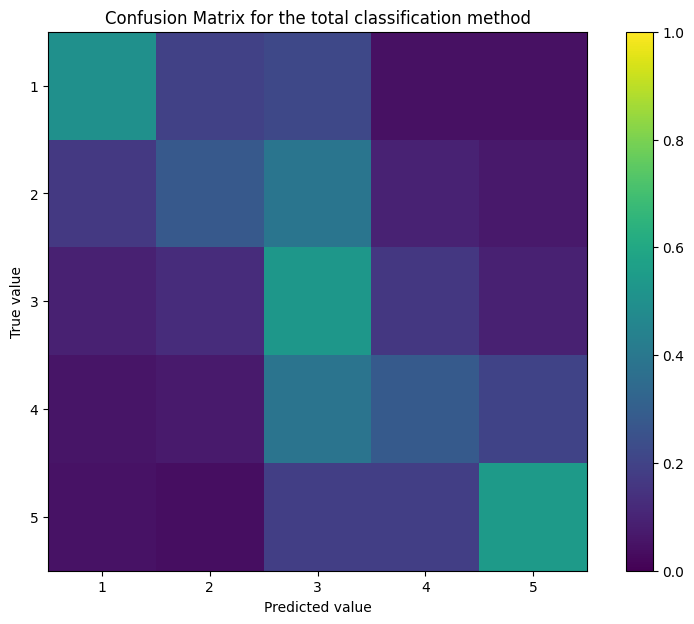

Final value of accuracy: 0.4537777158501103


In [35]:
accuracy = []
all_y_true = []
all_y_pred = []

for name_group in filtered_variables_by_type.keys():
    columns = filtered_variables_by_type[name_group]
    X_df_combined_cleaned = encoded_df_combined[columns].copy().dropna()
    for col in columns:
        if col in missing_values_col:
            X_df_group = X_df_combined_cleaned.copy() # Copy of the df to not modify the original one
            X_df_group = X_df_group.drop(X_df_group.columns[~X_df_group.columns.isin(columns)], axis=1)
            X_df_group = X_df_group[X_df_group[col].map(X_df_group[col].value_counts()) > 1] # Drop the classes with only one value
            X_train, X_test, y_train, y_test = train_test_split(X_df_group.drop(col, axis=1), X_df_group[col], test_size=0.2, random_state=42, stratify=X_df_group[col])

            if name_group == 'Demographics':
                svc = SVC(C=0.5, gamma=0.01, kernel='linear')
                svc.fit(X_train, y_train)
                y_pred = svc.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))
                
            elif name_group == 'Health':
                svc = SVC(C=1.5, gamma=0.1, kernel='rbf')
                svc.fit(X_train, y_train)
                y_pred = svc.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))
                
            elif name_group == 'Movies':
                rf = RandomForestClassifier(max_depth=30, min_samples_split=15, n_estimators=700)
                rf.fit(X_train, y_train)
                y_pred = rf.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))
    
            elif name_group == 'Music':
                rf = RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=700)
                rf.fit(X_train, y_train)
                y_pred = rf.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))
    
            elif name_group == 'Personality':
                rf = RandomForestClassifier(max_depth=None, min_samples_split=10, n_estimators=200)
                rf.fit(X_train, y_train)
                y_pred = rf.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))
    
            elif name_group == 'Phobias':
                rf = RandomForestClassifier(max_depth=15, min_samples_split=15, n_estimators=200)
                rf.fit(X_train, y_train)
                y_pred = rf.predict(X_test)
                accuracy.append(accuracy_score(y_test, y_pred))

            if name_group != 'Demographics':
                all_y_true.extend(y_test)
                all_y_pred.extend(y_pred)


# Visualize the confusion matrix
cm = confusion_matrix(all_y_true, all_y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 7))
plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.viridis, vmin=0, vmax=1)
plt.title('Confusion Matrix for the total classification method')
plt.colorbar()  

tick_marks = np.arange(5)
plt.xticks(tick_marks, [1, 2, 3, 4, 5])
plt.yticks(tick_marks[::-1], [5, 4, 3, 2, 1]) 

plt.xlabel('Predicted value')
plt.ylabel('True value')
plt.show()
                        

value_accuracy = sum(accuracy)/len(accuracy)
print(f"Final value of accuracy: {value_accuracy}")

##### 1.6.6) Application of the method and filling of the missing values
Then, we actually replace the NaN values of the encoded dataset with the 'best' methods that we found.

In [36]:
def replace_nans(X_df):
    np.random.seed(random_seed)
    new_df = X_df.copy() # New df in which NaNs will be replaced 
    nan_rows = X_df[X_df.isnull().any(axis=1)] # Dataframe with rows containing at least one NaN
    
    for i in range(len(nan_rows)): # Line-by-line iteration of those containing NaN
        dict_nans = {key: [] for key in filtered_variables_by_type.keys()}  # NaN in the various columns associated with the group name to which they belong
        row = nan_rows.iloc[i]
        
        for col_name in row.index:  # Iteration for each column of the current row
            if pd.isna(row[col_name]):  # Check if the value is NaN
                for key, value_list in filtered_variables_by_type.items():
                    if col_name in value_list:
                        associated_key = key
                        dict_nans[associated_key].append(col_name) 
                        break  
        
        dict_nans = {key: value for key, value in dict_nans.items() if value} # Filters the dictionary, leaving only the keys of groups with missing columns

        for key in dict_nans: # For each category
            missing_columns = dict_nans[key]  # Columns with NaN in the current row macrogroup
            key_columns = filtered_variables_by_type[key]  #  All columns of the macro group
            # Copy of df with the columns of the group and with only those rows that do not contain NaN in that specific group
            X_df_dropna = (X_df[key_columns].copy()).dropna()  
            row_index = row.name  # Get the actual index of the current row
            for col in missing_columns: # For each column, it predicts the missing data in that column
                
                y_train = X_df_dropna[col] # The column that I want to predict
                relevant_columns = [cols for cols in key_columns if cols not in missing_columns] # All the columns in the group without the ones in with misisng values in y_test    
                
                # Df with all columns of the macro group minus the one we are predicting, all rows other than Nan and not the one I am predicting
                X_train = X_df_dropna[relevant_columns] 
                
                # Df with the row I want to predict and all columns (minus the one I am analysing)
                X_test = X_df[relevant_columns].loc[row_index].to_frame().T

                # Based on the group, we predict using the best classifier we found through hyperparameter tuning
                if key == 'Demographics':
                    demographics = SVC(C=0.5, gamma=0.01, kernel='linear')
                    demographics.fit(X_train, y_train)
                    y_pred = demographics.predict(X_test)

                elif key == 'Health':
                    health = SVC(C=1.5, gamma=0.1, kernel='rbf')
                    health.fit(X_train, y_train)
                    y_pred = health.predict(X_test)
        
                elif key == 'Movies':
                    movies = RandomForestClassifier(max_depth=30, min_samples_split=15, n_estimators=700)
                    movies.fit(X_train, y_train)
                    y_pred = movies.predict(X_test)
        
                elif key == 'Music':
                    music =  RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=700)
                    music.fit(X_train, y_train)
                    y_pred = music.predict(X_test)
        
                elif key == 'Personality':
                    personality = RandomForestClassifier(max_depth=None, min_samples_split=10, n_estimators=200)
                    personality.fit(X_train, y_train)
                    y_pred = personality.predict(X_test)
        
                elif key == 'Phobias':
                    phobias = RandomForestClassifier(max_depth=15, min_samples_split=15, n_estimators=200)
                    phobias.fit(X_train, y_train)
                    y_pred = phobias.predict(X_test)
                    
                
                new_df.loc[row_index, col] = y_pred # Replaces the value NaN in the df with the one just predicted

    return new_df

In [37]:
encoded_fill_df_combined = replace_nans(encoded_df_combined)

In [38]:
sum(encoded_fill_df_combined.isnull().any()) # Check that all the values have been filled

0

##### 1.6.7) Low overrall accuracy
Why do we have a low accuracy when we apply the classification methods? A bad accuracy in spite of a good grid-search could depend on multiple factors, a lot of them not directly related to the optimization of the parameters. Here are some possible causes:

**Data Issues**

* **Low-quality data:**
  * **Noise:** presence of outliers or errors in the data that can negatively impact the model;
  * **Missing data:** the dataset that is small and imbalanced so this may limit the model's ability to generalize;
  * **Irrelevant features:** the presence of features unrelated to the target variable can introduce noise and degrade performance;
  * **Class imbalance**: One class is much more represented than others in some features.

Probably, the main reasons are the small size of the dataset, compared to a relatively high number of features, that impacts negatively the learning phase of the classifiers. Nevertheless, we do not have access to the missing data, so we don not actually know how the classifiers perform on them.

#### 1.7) Fill NaNs or remove them?
Subsequent analyses will employ **two dataset variants**: one with rows containing missing values (NaNs) removed, and another with these values filled via classification methods. This comparative approach aims to assess the relative efficacy of imputation versus complete-case analysis.

Empirical validation of dataset suitability will be conducted through **k-means clustering** and silhouette score evaluation. The dataset exhibiting the higher silhouette score will be deemed preferable for subsequent analyses.

The reason for imputation stems from the potential information loss associated with discarding rows containing any NaN values. This cleaning process eliminates approximately 25% of the data. While the imputation methods achieve only moderate accuracy (≈0.5), the limited number of NaNs per row (maximum 7, often fewer) within a high-dimensional space (92 columns) suggests that the impact of misclassifications will be marginal.

Therefore, this investigation seeks to determine whether the imputed dataset yields improved clustering performance compared to the dataset with removed rows. The core question is whether retaining information from partially complete rows, despite imperfect imputation, offers a significant advantage in subsequent clustering analysis.

In [39]:
# Count the number of missing values for each row of the original dataset
nans_per_row = encoded_df_combined.isnull().sum(axis=1)

# Find the maximum number of missing values in a row
max_missing = nans_per_row.max()
max_missing

np.int64(7)

## Exercise 2. Analyzing the Variance and the PCs

In the cells below, do the following operations:
1. create two new dataframes from _X_df_ applying a StandardScaler and a MinMaxscaler. Call these new dataframes as _Xstd_df_ and _Xmm_df_, respectively;
2. compute the variance of all the features in _X_df_, _Xstd_df_, and _Xmm_df_ and **comment the results**;
3. compute all the $n$ Principal Components (PCs) for each dataset _X_df_, _Xstd_df_, and _Xmm_df_. Then, visualize the curves of the cumulative explained variances and **comment the results**.

#### Functions 
This section documents the functions implemented for this analysis. The iterative application (four times) of the same analysis made it necessary to define dedicated functions in order to optimise the reusability, readability and maintainability of the code.

In [40]:
# Plots cumulative explained variance
def plot_cumulative_explained_variance(pca_X_df, name_df):
    plt.figure(figsize=(14, 6))  
    plt.plot(np.cumsum(pca_X_df.explained_variance_ratio_))
    plt.title(f'DATASET {name_df}', fontsize=14)
    plt.ylim([0, 1.1])
    plt.xticks(ticks=np.arange(0, pca_X_df.n_features_in_, step=2),  
               labels=[f'PC{i + 1}' for i in range(0, pca_X_df.n_features_in_, 2)], 
               rotation=45, fontsize=12)

    plt.xlabel('Principal components', fontsize=12)
    plt.ylabel('Cumulative explained variance', fontsize=12)
    plt.grid(True)
    plt.subplots_adjust(bottom=0.2)  # Aggiusta i margini
    plt.show()

#### 2.1) Filled dataset 

##### 2.1.1) Creation of the new datasets Xstd_df and Xmm_df
The dataset is transformed using the standard and min-max scalers.

In [41]:
encoded_fill_nolabels = encoded_fill_df_combined.copy()[these_features] # Dropping the labels because pca is unsupervised learning
X_df = encoded_fill_nolabels.copy() # Now, X_df is the dataset with the filled data
col_names = X_df.columns

# SCALER 
std_scaler = StandardScaler() # Inizialize the standard scaler
mm_scaler = MinMaxScaler(feature_range=(0, 1)) # Inizialize the MinMax scaler

# Fit and transform the data with the two scalers
Xstd_df = std_scaler.fit_transform(X_df)
Xmm_df = mm_scaler.fit_transform(X_df)

##### 2.1.2) Calculation of variances (and means) of the Dataframes

In [42]:
# Calculate variances for each DataFrame, column-wise
var_X_df = np.var(X_df, axis=0)
var_Xstd_df = np.var(Xstd_df, axis=0)
var_Xmm_df = np.var(Xmm_df, axis=0)

# Combine all variances into a single DataFrame with columns for each DataFrame
combined_variances = pd.DataFrame({
    'X_df': var_X_df,
    'Xstd_df': var_Xstd_df,
    'Xmm_df': var_Xmm_df
})

# Rename index for clarity
combined_variances.index.name = 'Feature'

# Display the results
print("\nCombined Variances by Column:")
print(combined_variances.to_string())

top_indices = np.argsort(var_X_df)[-5:][::-1]
top_features = var_X_df.index[top_indices].tolist()
columns = X_df.columns
print(f"\nMaximum sample variance for X_df: {max(var_X_df)}\nMinimum sample variance for X_df: {min(var_X_df)}")
print(f"The features with maximum variances on the raw dataframe are: {top_features}")
print(f"Maximum sample variance for Xstd_df: {max(var_Xstd_df)}\nMinimum sample variance for Xstd_df: {min(var_Xstd_df)}")
print(f"Maximum sample variance for Xmm_df: {max(var_Xmm_df)}\nMinimum sample variance for Xmm_df: {min(var_Xmm_df)}")


# Printing also the mean values
mean_X_df = X_df.mean(axis=0)
mean_Xstd_df = Xstd_df.mean(axis=0)
mean_Xmm_df = Xmm_df.mean(axis=0)

combined_means = pd.DataFrame({
    'X_df': mean_X_df,
    'Xstd_df': mean_Xstd_df,
    'Xmm_df': mean_Xmm_df
})

combined_means.index.name = 'Feature'

print("\nCombined Means by Column:")
print(combined_means.to_string())


Combined Variances by Column:
                                    X_df  Xstd_df    Xmm_df
Feature                                                    
Finding lost valuables          1.563040      1.0  0.097690
Keeping promises                0.803490      1.0  0.050218
Achievements                    0.846111      1.0  0.052882
Socializing                     1.238618      1.0  0.077414
Lying                           0.548298      1.0  0.060922
Knowing the right people        1.211925      1.0  0.075745
Dreams                          0.448852      1.0  0.028053
Punctuality                     0.625056      1.0  0.156264
Getting angry                   1.420426      1.0  0.088777
Responding to a serious letter  1.345346      1.0  0.084084
Judgment calls                  0.974307      1.0  0.060894
Eating to survive               1.406079      1.0  0.087880
Compassion to animals           1.323285      1.0  0.082705
Mood swings                     1.091473      1.0  0.068217
Writing n

##### Observations:
* **The results make sense because:** 
  - **X_df**'s columns range between 1-5 except for a few of them (1-3, 1-4, 1-6), so the variance cannot be that high, that's why a lot of columns have variances lower than 1 and none reach the value 2, while the mean values also appear to be quite similar and small.
  - **Xstd_df**'s columns are standardized, so obviously the variance has to be 1 and the mean has to be 0 for each column by definition. It is not exactly that for all columns only due to approximation error and machine precision.
  - **X_df_mm**'s columns have values that range between 0-1, so the variances and the means has to be lower than those of the original dataset.

##### 2.1.3) PCs of X_df

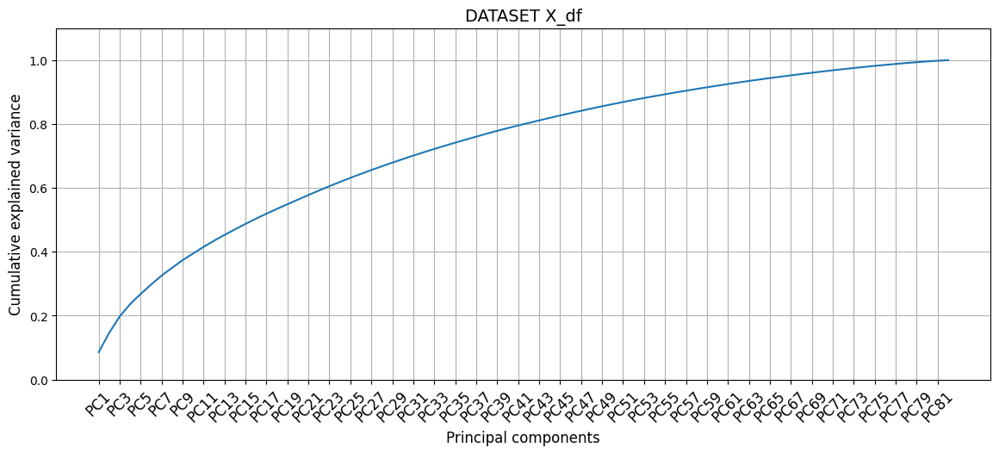

In [43]:
pca_X_df = PCA(random_state = random_seed)
pca_X_df.fit(X_df.values)
plot_cumulative_explained_variance(pca_X_df, 'X_df')

##### 2.1.4) PCs of Xstd_df

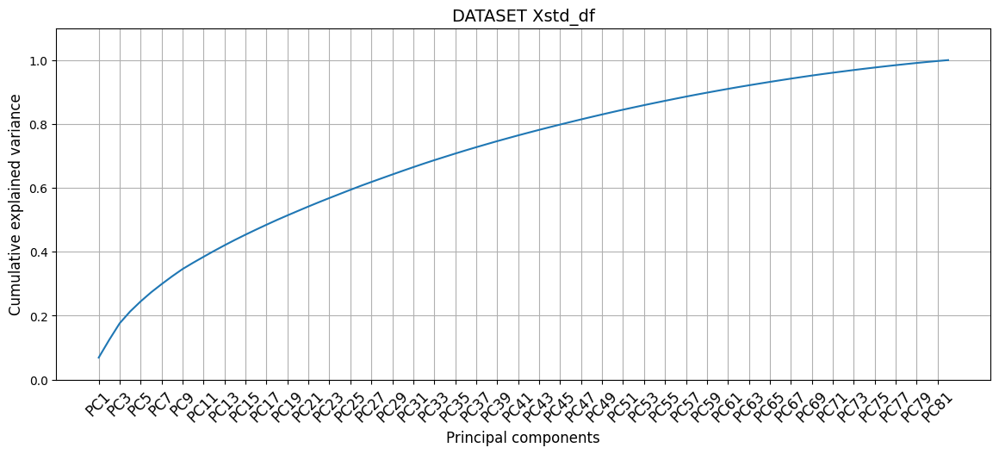

In [44]:
pca_Xstd_df = PCA(random_state = random_seed)
pca_Xstd_df.fit(Xstd_df)
plot_cumulative_explained_variance(pca_Xstd_df, 'Xstd_df')

##### 2.1.5) PCs of Xmm_df

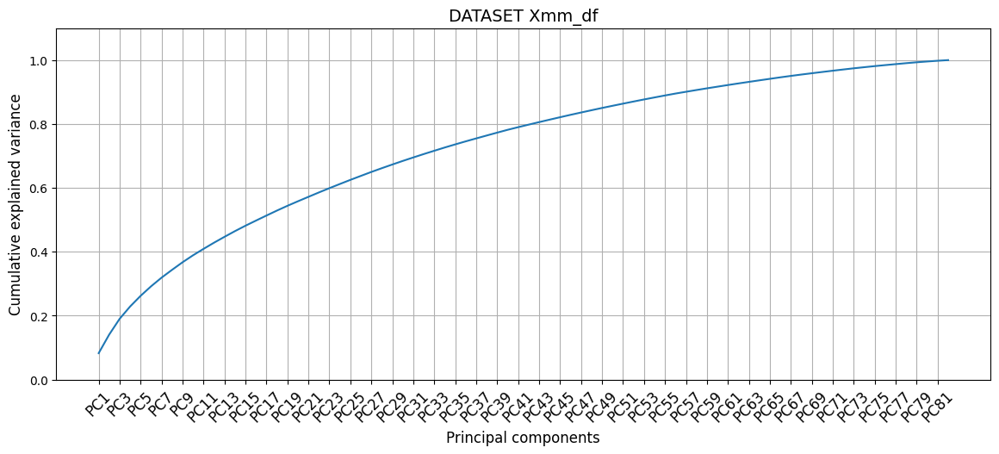

In [45]:
pca_Xmm_df = PCA(random_state = random_seed)
pca_Xmm_df.fit(Xmm_df)
plot_cumulative_explained_variance(pca_Xmm_df, 'Xmm_df')

##### Observations:
The three graphs show the cumulative variance explained by the principal components obtained with PCA on three versions of the dataset: original (`X_df`), standardised (`Xstd_df`) and normalised Min-Max (`Xmm_df`). The most striking aspect is the near identity of the three curves.

This indicates that standardisation and Min-Max normalisation had minimal impact on the variance structure of the data. This is probably due to the fact that the original data have discrete values in intervals and not very different variances between the features.

Standardisation (**StandardScaler**) centres the data and scales them according to standard deviation; if the variances are similar, the effect is limited. Similarly, **Min-Max** normalisation (scale [0, 1]) does not introduce much change if the original ranges are already similar and in the absence of significant outliers.

Therefore, in this specific case, PCA can also be effectively applied to the original data without standardisation. 

#### 2.2) Dropped Dataset

##### 2.2.1) Creation of the new datasets Xstd_df and Xmm_df
The dataset is transformed using the standard and min-max scalers.

In [46]:
X_df_combined_cleaned = encoded_df_combined.dropna().copy()
X_df_drop  = (X_df_combined_cleaned.copy())[these_features] # Now, X_df is is the df without nans 

# SCALER
std_scaler_drop = StandardScaler() # Inizializethe standard scaler
mm_scaler_drop  = MinMaxScaler(feature_range=(0, 1)) # Inizialize the MinMax scaler

#Fit and transform the data with the two scalers
Xstd_df_drop = std_scaler_drop.fit_transform(X_df_drop)
Xmm_df_drop = mm_scaler_drop.fit_transform(X_df_drop)

##### 2.2.2) Calculation of variances (and means) of the Dataframes

In [47]:
# Calculate variances for each DataFrame, column-wise
var_X_df_drop = np.var(X_df_drop, axis=0)
var_Xstd_df_drop = np.var(Xstd_df_drop, axis=0)
var_Xmm_df_drop = np.var(Xmm_df_drop, axis=0)

# Combine all variances into a single DataFrame with columns for each DataFrame
combined_variances = pd.DataFrame({
    'X_df_drop': var_X_df_drop,
    'Xstd_df_drop': var_Xstd_df_drop,
    'Xmm_df_drop': var_Xmm_df_drop
})

# Rename index for clarity
combined_variances.index.name = 'Feature'

# Display the result
print("\nCombined Variances by Column:")
print(combined_variances.to_string())

top_indices = np.argsort(var_X_df_drop)[-5:][::-1]
top_features = var_X_df.index[top_indices].tolist()
columns = X_df_drop.columns
print(f"\nMaximum sample variance for X_df: {max(var_X_df_drop)}\nMinimum sample variance for X_df: {min(var_X_df_drop)}")
print(f"The features with maximum variances on the raw dataframe are: {top_features}")
print(f"Maximum sample variance for Xstd_df: {max(var_Xstd_df_drop)}\nMinimum sample variance for Xstd_df: {min(var_Xstd_df_drop)}")
print(f"Maximum sample variance for Xmm_df: {max(var_Xmm_df_drop)}\nMinimum sample variance for Xmm_df: {min(var_Xmm_df_drop)}")

# Printing also the mean values
mean_X_df_drop = X_df_drop.mean(axis=0)
mean_Xstd_df_drop = Xstd_df_drop.mean(axis=0)
mean_Xmm_df_drop = Xmm_df_drop.mean(axis=0)


combined_means = pd.DataFrame({
    'X_df_drop': mean_X_df_drop,
    'Xstd_df_drop': mean_Xstd_df_drop,
    'Xmm_df_drop': mean_Xmm_df_drop
})

combined_means.index.name = 'Feature'

print("\nCombined Means by Column:")
print(combined_means.to_string())


Combined Variances by Column:
                                X_df_drop  Xstd_df_drop  Xmm_df_drop
Feature                                                             
Finding lost valuables           1.578441           1.0     0.098653
Keeping promises                 0.786704           1.0     0.049169
Achievements                     0.810928           1.0     0.050683
Socializing                      1.221788           1.0     0.076362
Lying                            0.534983           1.0     0.059443
Knowing the right people         1.219063           1.0     0.076191
Dreams                           0.446771           1.0     0.027923
Punctuality                      0.623504           1.0     0.155876
Getting angry                    1.333892           1.0     0.083368
Responding to a serious letter   1.351361           1.0     0.084460
Judgment calls                   0.948823           1.0     0.059301
Eating to survive                1.355769           1.0     0.084736
Com

##### Observations:
The same comments as before can be made. In addition here, we do not get exactly the same features with the maximum variances as before and what we can see is that the minimum and maximum computed variances for X_df and X_df_mm are slightly lower than the ones in the filled dataset.

##### 2.2.3) PCs of X_df_drop

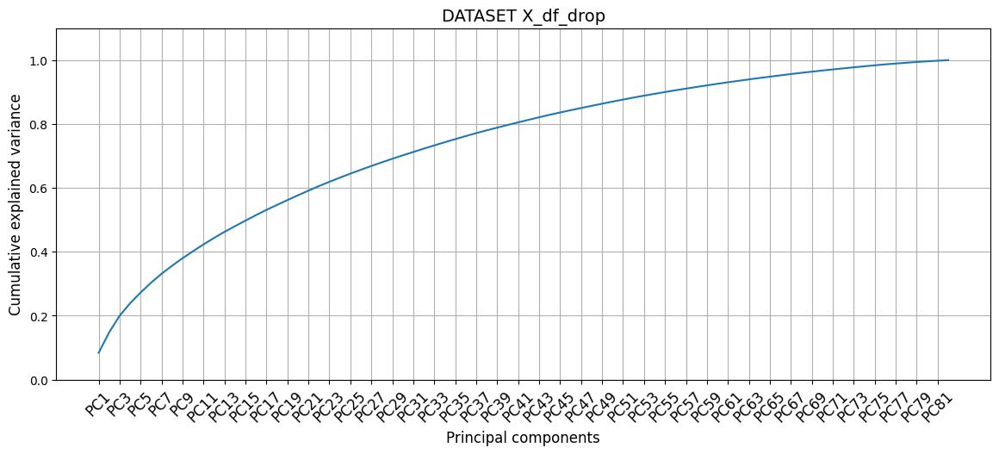

In [48]:
pca_X_df_drop = PCA(random_state = random_seed)
pca_X_df_drop.fit(X_df_drop.values)
plot_cumulative_explained_variance(pca_X_df_drop, 'X_df_drop')

##### 2.2.4) PCs of Xstd_df_drop

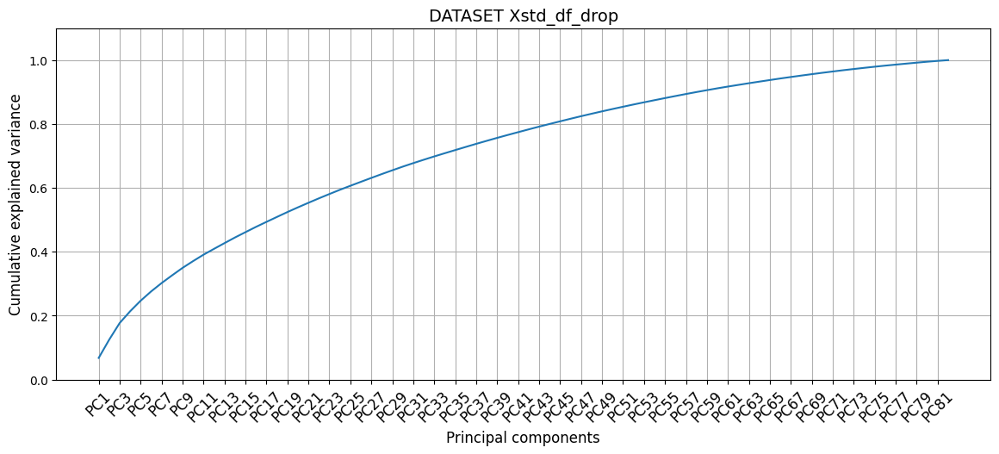

In [49]:
pca_Xstd_df_drop = PCA(random_state = random_seed)
pca_Xstd_df_drop.fit(Xstd_df_drop)
plot_cumulative_explained_variance(pca_Xstd_df_drop, 'Xstd_df_drop')

##### 2.2.5) PCs of Xmm_df

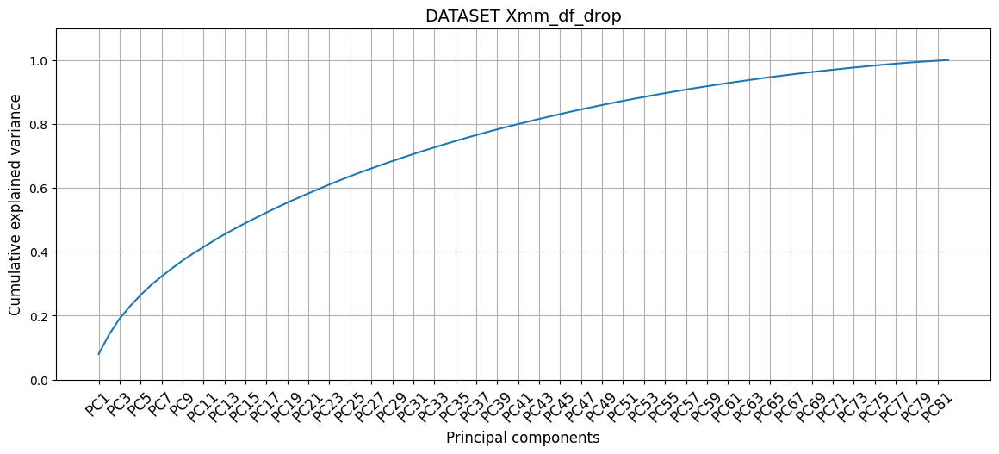

In [50]:
pca_Xmm_df_drop = PCA(random_state = random_seed)
pca_Xmm_df_drop.fit(Xmm_df_drop)
plot_cumulative_explained_variance(pca_Xmm_df_drop, 'Xmm_df_drop')

##### Observations:
There are no great differences between the curves and similiar observations as in the case of the filled dataset can be made.

## Exercise 3. Dimensionality Reduction and PC Interpretation

In the cells below, do the following operations:
1. For each one of the two dataframes _Xstd_df_, and _Xmm_df_, compute a new PCA for performing a dimensionality reduction with respect to $m$ dimensions. The value of $m$ must be $$m = \min\{m', 5\}\,,$$ where $m'$ is the value required for obtaining $33\%$ of the total variance.
2. For both the cases, visualize all the PCs and give a name/interpretation to them. **Comment and motivate your interpretations**. If possible, **compare the differences among the results obtained** for _Xstd_df_ and _Xmm_df_.
3. Perform the score graph for both the cases (_std_ and _mm_). If $m>3$, plot the score graph with respect to the first 3 PCs. All the **plots must show the names of the PCs on the axes** for better understanding the results.
4. **Optional:** plot more score graphs, coloring the dots with respect to any label in the list _labels_ that you believe can be interesting. **Comment and analyze this optional plots**.

#### Functions 
This section documents the functions implemented for this analysis. The iterative application (four times) of the same analysis made it necessary to define dedicated functions in order to optimise the reusability, readability and maintainability of the code.

In [51]:
# Barplot for the explained variance of the first m PCs
def plot_explained_variance_barplot(pca_X_df, m):
    expl_var = pca_X_df.explained_variance_ratio_
    # Only the first m values
    explained_variance_to_plot = expl_var[:m]

    plt.figure(figsize=(10, 6))
    x = np.arange(m) 
    bars = plt.bar(x, explained_variance_to_plot, color='b', alpha=0.7)

    for bar, var in zip(bars, explained_variance_to_plot):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
                 f'{var:.2%}', ha='center', va='bottom', fontsize=10)

    plt.xticks(x, [f'PC{i+1}' for i in range(m)], fontsize=12) 
    plt.xlabel('Principal Components', fontsize=12)  
    plt.ylabel('Explained Variance', fontsize=12)  
    plt.title(f'Explained Variance by each Principal Component (up to {m} Components)', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7) 
    plt.tight_layout()
    plt.show()

In [52]:
# col_names = X_df.columns
def plot_pca_features(X_df, pca_X_df, filtered_variables_by_type, num_features_to_plot=20, col_names = col_names):
    
    # heuristics number
    eps = 1 / pow(pca_X_df.n_features_in_, 1 / 2.5)
    # Pcs
    components = pca_X_df.components_ 

    # Color map
    custom_colormap = mpl.colormaps['tab10']  
    group_colors = custom_colormap(np.linspace(0, 1, len(filtered_variables_by_type)))

    group_keys = list(filtered_variables_by_type.keys())

    # Cycle on the first 5 PCs
    for pc_idx in range(5):
        indices = np.argsort(np.abs(components[pc_idx]))[::-1][:num_features_to_plot]
        components_to_plot = components[pc_idx, indices]  
        feature_names_to_plot = [col_names[i] for i in indices] 
        feature_groups = [
            next((group for group, features in filtered_variables_by_type.items() if feature in features), None)
            for feature in feature_names_to_plot
        ]
        
        # Create the graph
        plt.figure(figsize=(12, 8))
        bars = plt.bar(
            np.arange(num_features_to_plot), 
            components_to_plot,
            alpha=0.7
        )

        handles = []
        labels = []

        # Color each bar based on its group
        for i, bar in enumerate(bars):
            group = feature_groups[i]
            group_color = group_colors[group_keys.index(group)] if group else 'gray'
            bar.set_color(group_color)
            if group and group not in labels:
                labels.append(group)
                handles.append(bar)

        plt.legend(handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(1.15, 1.05))
        # Red line
        plt.plot([-0.5, num_features_to_plot - 0.5], [eps, eps], 'red')
        plt.plot([-0.5, num_features_to_plot - 0.5], [-eps, -eps], 'red')

        plt.xticks(
            ticks=np.arange(num_features_to_plot), 
            labels=feature_names_to_plot,  
            rotation=80
        )
        plt.xlabel('Features')
        plt.ylabel(f'PC{pc_idx + 1} Coefficients')
        plt.title(f'PC{pc_idx + 1} explained by the most {num_features_to_plot} important features')
        plt.grid()
        plt.tight_layout()
        plt.show()


    for ii in range(5):
        ind_great_pos_PCii = np.argwhere(pca_X_df.components_[ii, :] >= eps).flatten()

        ind_great_neg_PCii = np.argwhere(pca_X_df.components_[ii, :] <= -eps).flatten()
        
        # Extract the names of the columns with higher and lower than eps value
        great_pos_PCii = [col_names[i] for i in ind_great_pos_PCii]
        great_neg_PCii = [col_names[i] for i in ind_great_neg_PCii]
        
        # Print the results
        print(f'\n****************** PC{ii+1} **********************')
        print(f'HIGH-VALUED POSITIVE COMPONENTS: {great_pos_PCii}')
        print(f'HIGH-VALUED NEGATIVE COMPONENTS: {great_neg_PCii}')
        print('*********************************************\n')

In [53]:
# Scatter plot in 3D
def plot_3d_pca(Y_X_df_m, pcs_names_X_df, name_df):
  fig = plt.figure(figsize=(11, 11))  
  ax = fig.add_subplot(111, projection='3d')

  # Scatter plot of the first 3 pcs
  ax.scatter(Y_X_df_m[:, 0], Y_X_df_m[:, 1], Y_X_df_m[:, 2], c='b', label="Scores", alpha=0.6)

  ax.set_xlabel(pcs_names_X_df[0])
  ax.set_ylabel(pcs_names_X_df[1])
  ax.set_zlabel(pcs_names_X_df[2]) 

  ax.set_title(f'Score Plot for {name_df} (PC1 vs PC2 vs PC3)')

  plt.grid()
  plt.tight_layout()  
  plt.show()

In [54]:
# 3d scatter by also coloring the points based on a label when we group the values
def plot_3d_with_groups(X_df, Y_df, column_name, pcs_names, name_df, group_size=5, random_seed=random_seed):
   # List of colors
    set1 = cm.Set1.colors
    # Extract the unique values
    column_values = sorted(X_df[column_name].unique())

    # Group the values
    group_counter = 1
    groups = {}
    for i, value in enumerate(column_values):
        group_num = i // group_size + 1
        if group_num > group_counter:
            group_counter = group_num
        groups[value] = f"Group_{group_num}"

    if group_counter > 1 and len([value for value in column_values if groups[value] == f"Group_{group_counter}"]) < group_size:
        last_group_values = [value for value in column_values if groups[value] == f"Group_{group_counter}"]
        for value in last_group_values:
            groups[value] = f"Group_{group_counter - 1}"

    # Assign a color to each group
    unique_groups = sorted(set(groups.values()))
    group_colors = {group: set1[i % len(set1)] for i, group in enumerate(unique_groups)}

    column_colors = {value: group_colors[groups[value]] for value in column_values}
    # Add the column color
    X_df['color'] = X_df[column_name].map(column_colors)

    group_labels = []
    for group in unique_groups:
        group_values = [value for value, g in groups.items() if g == group]
        min_value = min(group_values)
        max_value = max(group_values)
        group_labels.append(f"{min_value}-{max_value}")

    # Legend
    group_legend = [Line2D([0], [0], color=group_colors[group]) for group in unique_groups]

    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot
    ax.scatter(Y_df[:, 0], Y_df[:, 1], Y_df[:, 2], c=X_df['color'].values, alpha=0.6)
    ax.set_xlabel(pcs_names[0])
    ax.set_ylabel(pcs_names[1])
    ax.set_zlabel(pcs_names[2])
    ax.set_title(f'3D Score Plot for {column_name} in {name_df}')
    plt.legend(group_legend, group_labels, title=f'{column_name} Groups')

    plt.grid(True)
    plt.show()

In [55]:
# 3d scatter by also coloring the points based on a label
def plot_3d_with_labels(X_df, Y_df, column_name, pcs_names,labels_dict, name_df, random_seed=random_seed):
    set1 = cm.Set1.colors
    column_values = sorted(X_df[column_name].unique())
    column_colors = {value: set1[i % len(set1)] for i, value in enumerate(column_values)}
    X_df['color'] = X_df[column_name].map(column_colors)
    # Assing the right colors
    legend_labels = list(labels_dict.values())
    legend_colors = [column_colors[value] for value in labels_dict.keys()]

    fig = plt.figure(figsize=(13, 13))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot
    ax.scatter(Y_df[:, 0], Y_df[:, 1], Y_df[:, 2], c=X_df['color'].values, alpha=0.6)

    ax.set_xlabel(pcs_names[0])
    ax.set_ylabel(pcs_names[1])
    ax.set_zlabel(pcs_names[2])

    # Title
    ax.set_title(f'3D Score Plot for {column_name} in {name_df}')

    ax.legend(
        handles=[Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) 
                 for color in legend_colors],
        labels=legend_labels,
        title=f'{column_name}'
    )

    plt.grid(True)
    plt.show()

#### 3.1) Filled Dataset 

##### 3.1.1) Calculation of the number m of PCs that will be used for Xstd_df and plots
Calculation and display of variance explained for the selection of the number of principal components.

In [56]:
expl_var_std = np.cumsum(pca_Xstd_df.explained_variance_ratio_) # Explained cumulative variance for Xstd_df
min_num_comp_std = np.argmax(expl_var_std >= 0.33) + 1 # Minimum number of pcs for 33% explained variance for Xstd_df
m_std = min(min_num_comp_std, 5)
print(f'The minimum number of PCs to explain 33% of variance for the dataset Xstd_df is {min_num_comp_std}.\nThe number of PCs that will be used is {m_std}, that explain {expl_var_std[m_std - 1]*100:.2f}% of the variance.')

The minimum number of PCs to explain 33% of variance for the dataset Xstd_df is 9.
The number of PCs that will be used is 5, that explain 24.48% of the variance.


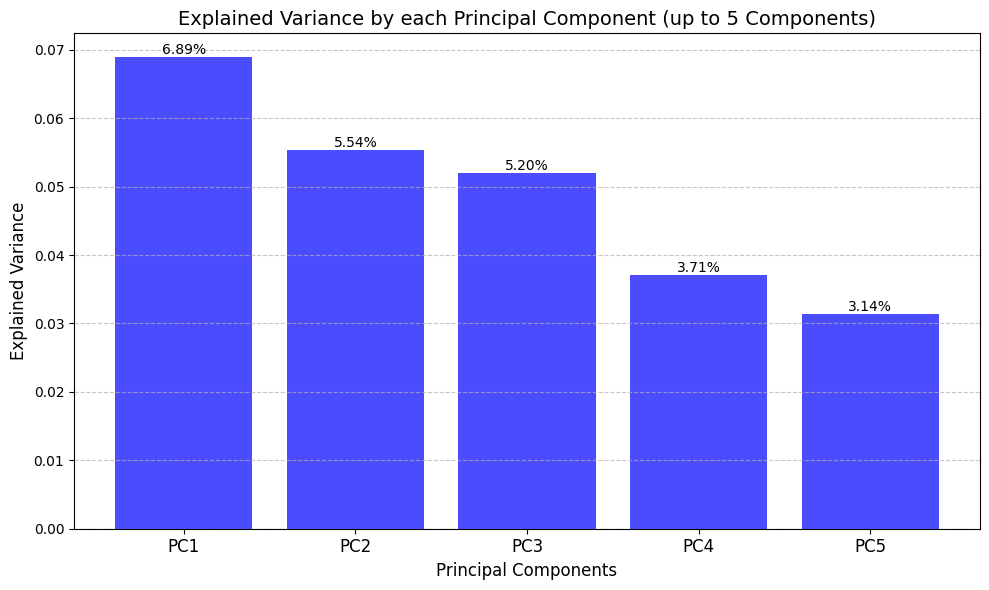

In [57]:
plot_explained_variance_barplot(pca_Xstd_df, m_std)

In [58]:
# Perform PCA with m_std components and transform the data
pca_Xstd_df_m = PCA(n_components=m_std, random_state = random_seed)
Y_Xstd_df_m = pca_Xstd_df_m.fit_transform(Xstd_df)

##### 3.1.2) Calculation of the number m of PCs that will be used for Xmm_df and plots
Calculation and display of variance explained for the selection of the number of principal components.

In [59]:
expl_var_mm = np.cumsum(pca_Xmm_df.explained_variance_ratio_) # Explained cumulative variance for X_df
min_num_comp_mm = np.argmax(expl_var_mm >= 0.33) + 1 # minimum number of pcs for 33% explained variance for Xmm_df
m_mm = min(min_num_comp_mm, 5)
print(f'The minimum number of PCs to explain 33% of variance for the dataset Xmm_df is {min_num_comp_mm}.\nThe number of PCs that will be used is {m_mm}, that explain {expl_var_mm[m_mm - 1]*100:.2f}% of the variance.')

The minimum number of PCs to explain 33% of variance for the dataset Xmm_df is 8.
The number of PCs that will be used is 5, that explain 26.24% of the variance.


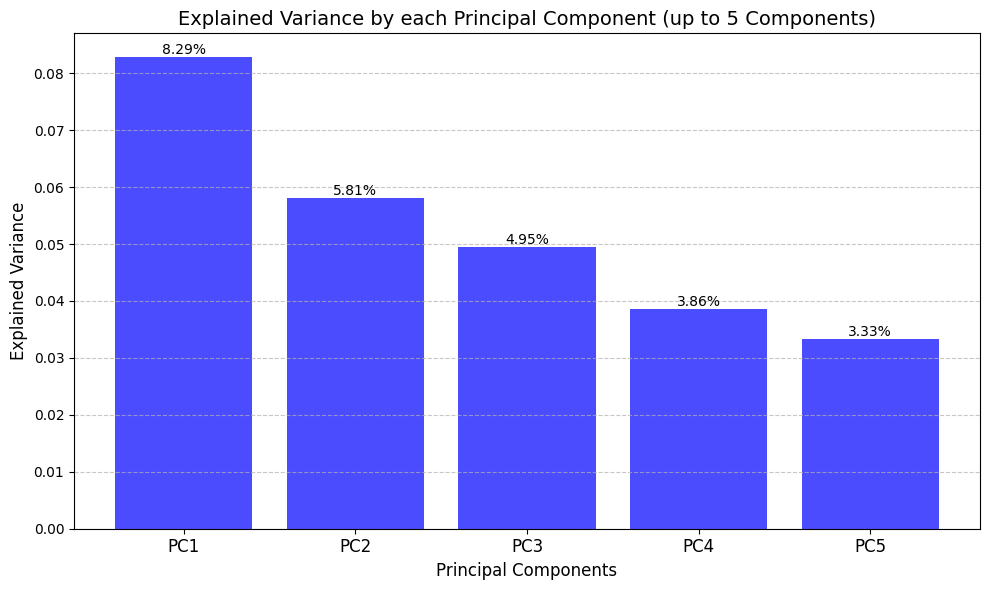

In [60]:
plot_explained_variance_barplot(pca_Xmm_df, m_mm)

In [61]:
# Perform PCA with m_mm components and transform the data
pca_Xmm_df_m = PCA(n_components=m_mm, random_state = random_seed)
Y_Xmm_df_m = pca_Xmm_df_m.fit_transform(Xmm_df)

##### 3.1.3) Interpretation of PCs of Xstd_df
In the next sections, we will give the names to the PCs based on the contributions the 'most important' features (the ones higher or lower than a tolerance we empirically defined) have on the PCs.

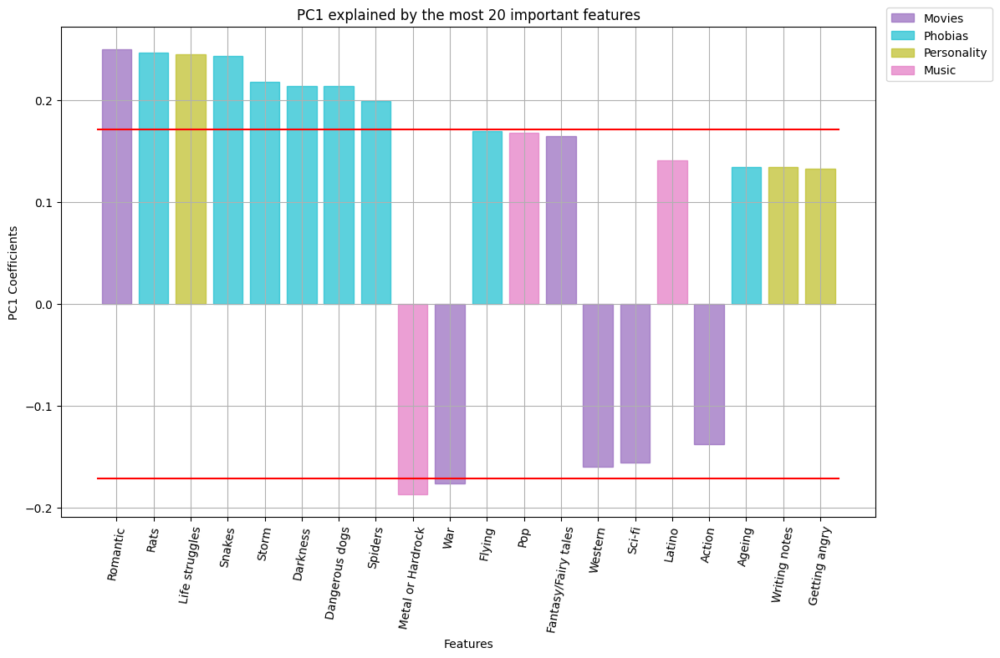

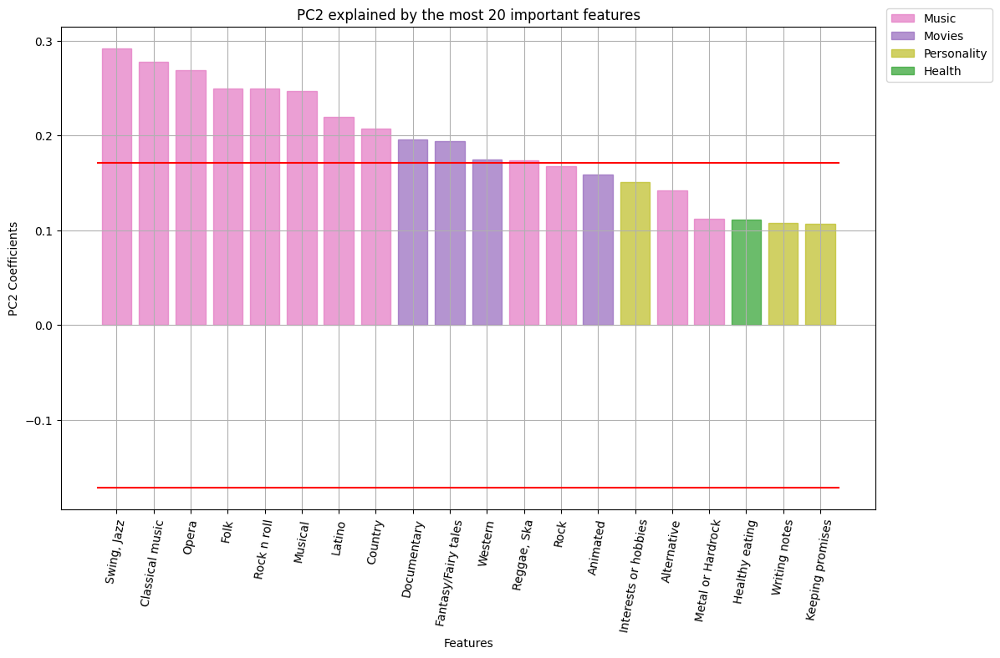

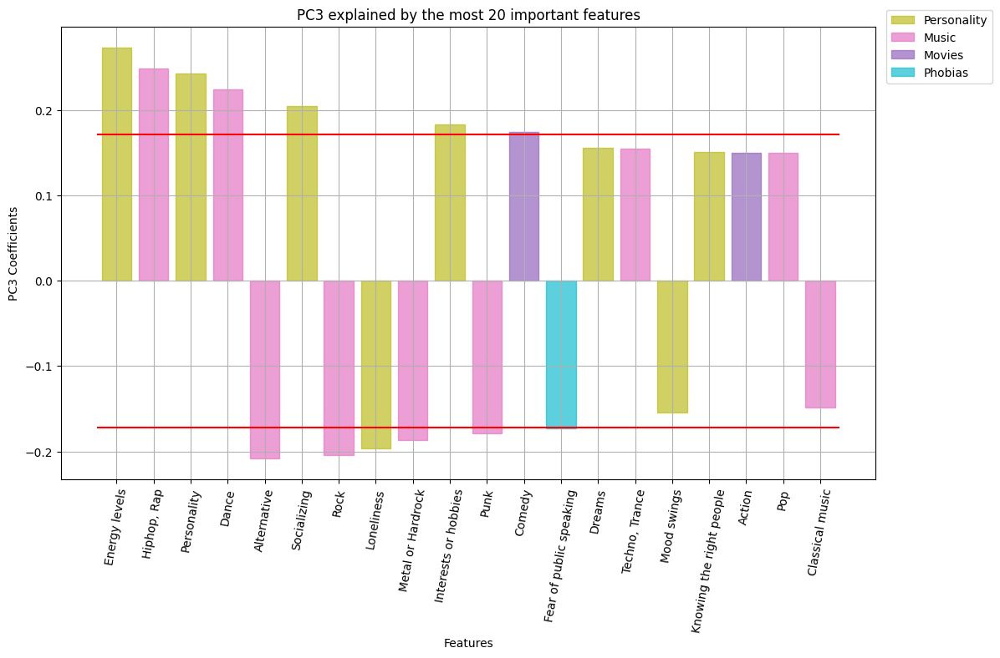

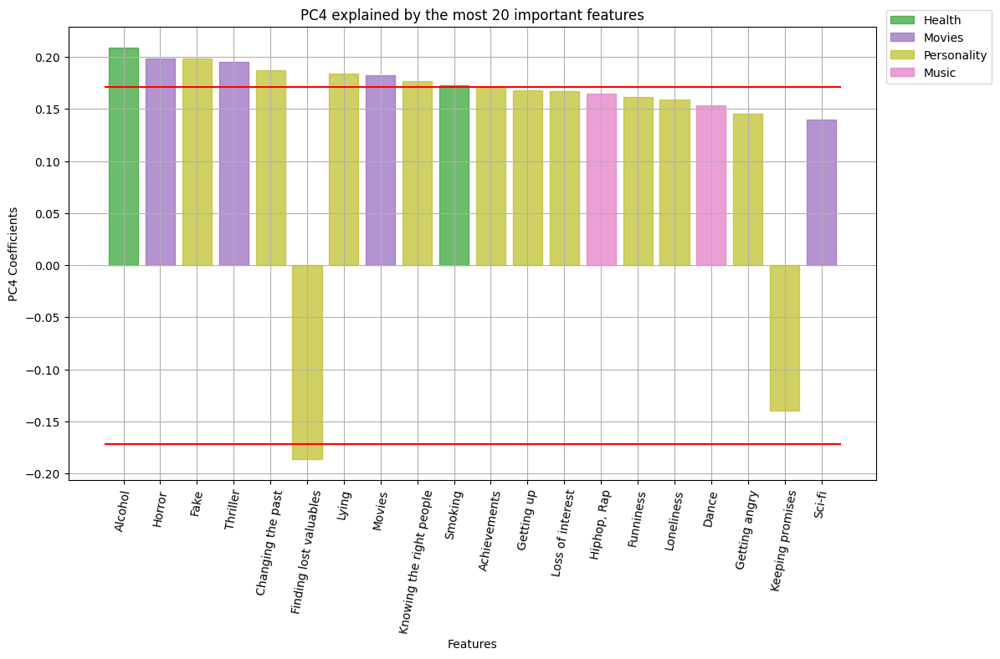

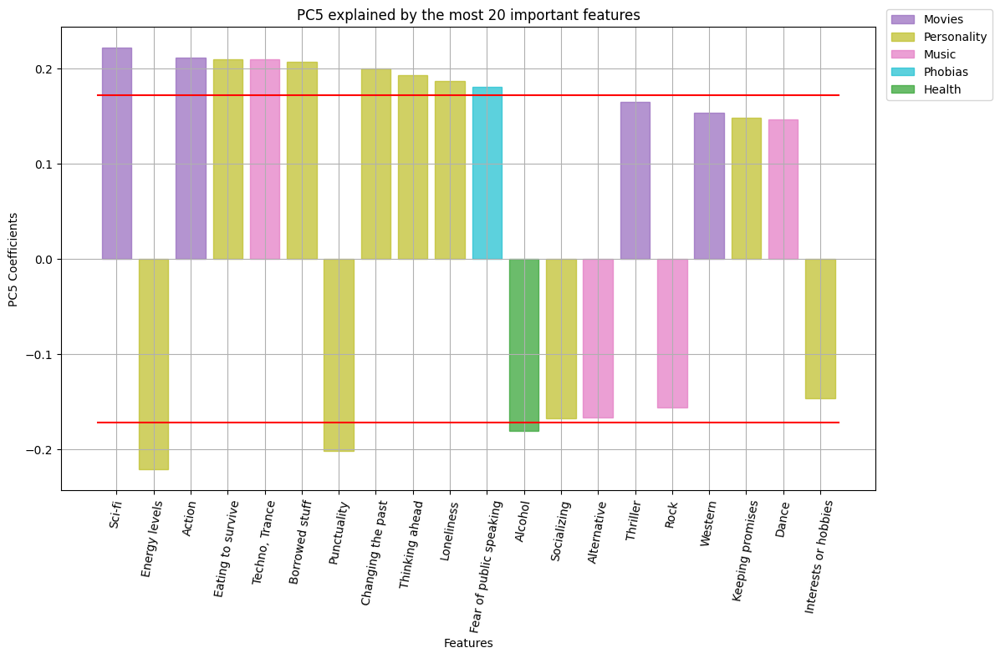


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Life struggles', 'Storm', 'Darkness', 'Spiders', 'Snakes', 'Rats', 'Dangerous dogs', 'Romantic']
HIGH-VALUED NEGATIVE COMPONENTS: ['Metal or Hardrock', 'War']
*********************************************


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Folk', 'Country', 'Classical music', 'Musical', 'Reggae, Ska', 'Swing, Jazz', 'Rock n roll', 'Latino', 'Opera', 'Fantasy/Fairy tales', 'Documentary', 'Western']
HIGH-VALUED NEGATIVE COMPONENTS: []
*********************************************


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Socializing', 'Personality', 'Energy levels', 'Interests or hobbies', 'Dance', 'Hiphop, Rap', 'Comedy']
HIGH-VALUED NEGATIVE COMPONENTS: ['Loneliness', 'Fear of public speaking', 'Rock', 'Metal or Hardrock', 'Punk', 'Alternative']
*********************************************


****************** PC4 **

In [62]:
plot_pca_features(Xstd_df, pca_Xstd_df_m, filtered_variables_by_type)

##### NAMES FOR THE 5 PCS of Xstd_df
1. PC1:  "*romantic movies* (+) & *phobias* (+)" ; 
1. PC2: "*many music genres*(+)";
1. PC3: "*positivity* (+) & *energy * (+) vs *Rock* (-)";
1. PC4 : "*fearful movies* (+) & *bad habits* (+) vs *unreliability* (-)"
1. PC5 : "*positive traits* (-) & *bad habits* (-) vs *action, sci-fi movies* (+)"

In [63]:
# Creation of the list of Xstd_df'sPCs' names
pcs_names_Xstd_df = [
    "1:'romantic movies'(+) & 'phobias' (+)",
    "2:'many music genres' (+)",
    "3:'positivity' (+) & 'energy' (+) vs 'rock' (-)",
    "4:'fearful movies' (+) & 'bad habits' (+) vs 'unreliability' (-)",
    "5:'positive traits' (-) & 'bad habits' (-) vs 'action, sci-fi movies' (+)"
]

##### 3.1.4) Interpretation of PCs of Xmm_df

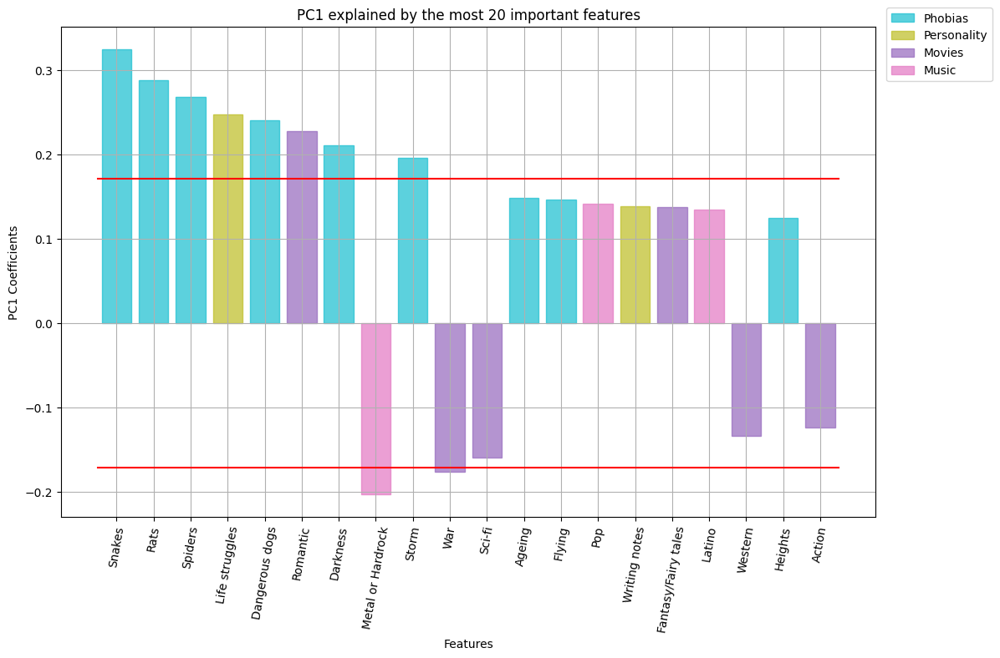

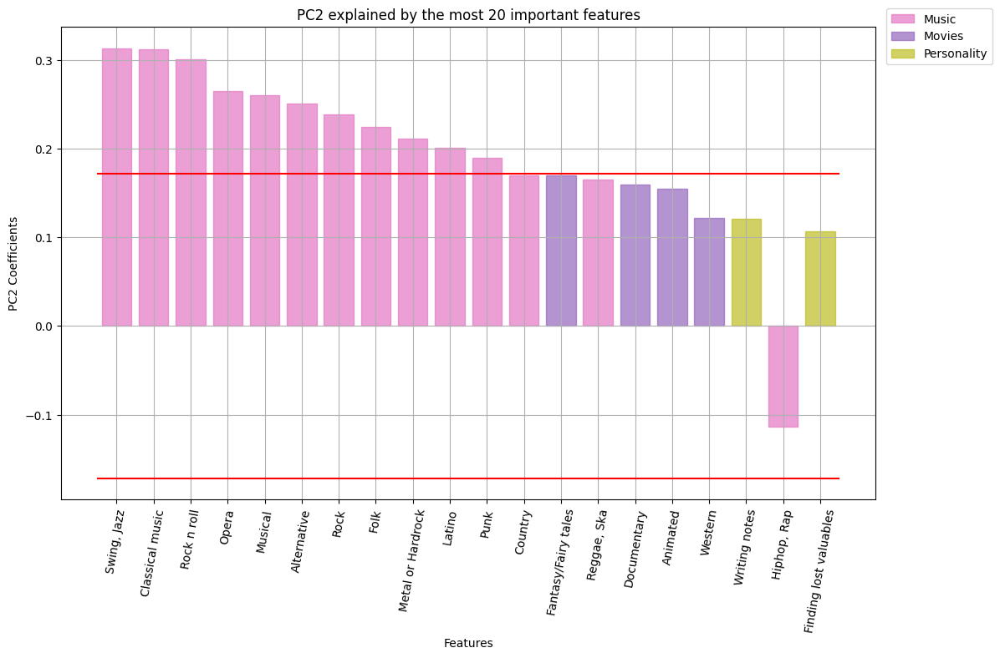

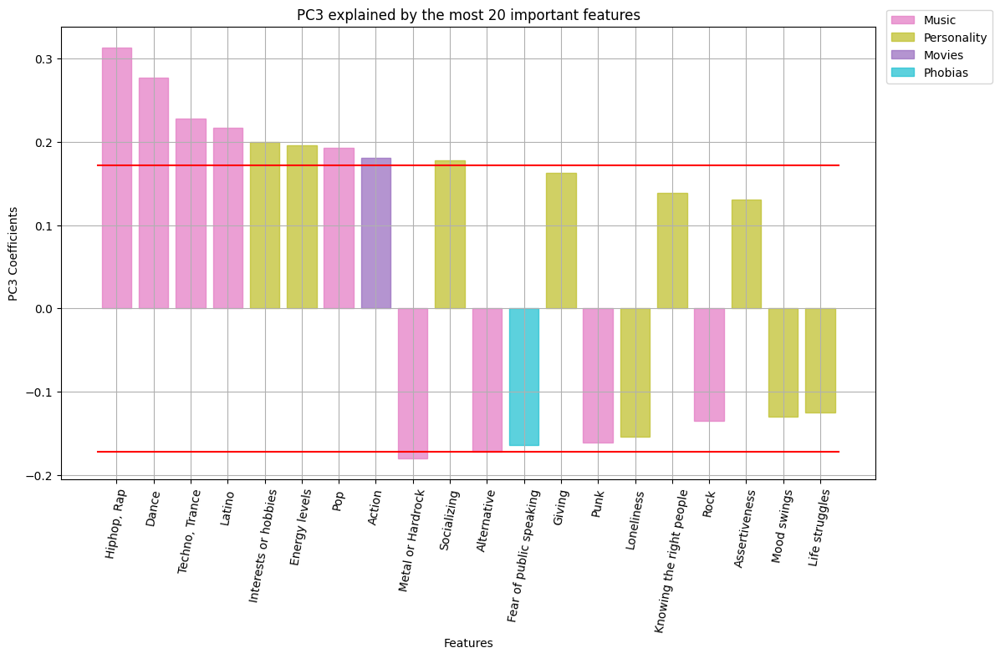

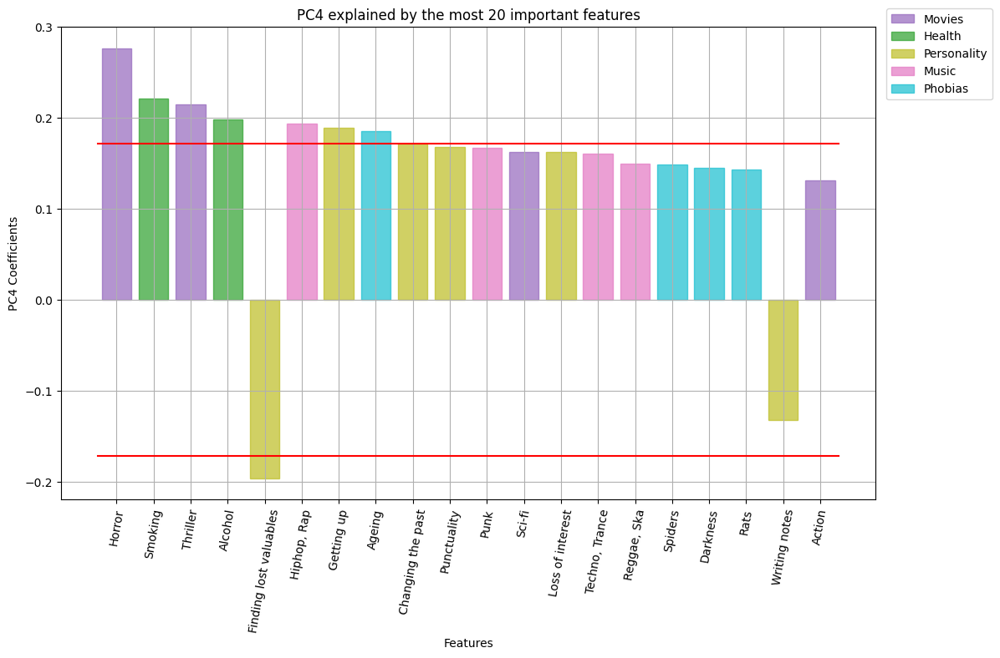

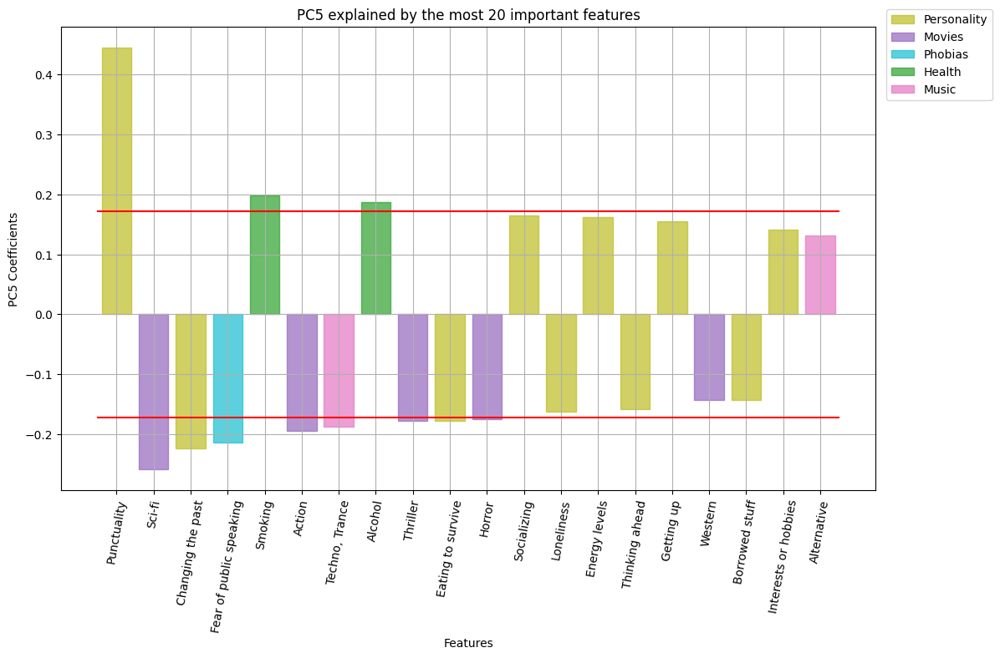


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Life struggles', 'Storm', 'Darkness', 'Spiders', 'Snakes', 'Rats', 'Dangerous dogs', 'Romantic']
HIGH-VALUED NEGATIVE COMPONENTS: ['Metal or Hardrock', 'War']
*********************************************


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Folk', 'Classical music', 'Musical', 'Rock', 'Metal or Hardrock', 'Punk', 'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 'Opera']
HIGH-VALUED NEGATIVE COMPONENTS: []
*********************************************


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Socializing', 'Energy levels', 'Interests or hobbies', 'Dance', 'Pop', 'Hiphop, Rap', 'Latino', 'Techno, Trance', 'Action']
HIGH-VALUED NEGATIVE COMPONENTS: ['Metal or Hardrock', 'Alternative']
*********************************************


****************** PC4 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Gett

In [64]:
plot_pca_features(Xmm_df, pca_Xmm_df_m, filtered_variables_by_type)

##### NAMES FOR THE 5 PCS of Xmm_df
1. PC1:  "*metal, hardrock* (-) vs *phobias* (+) ; 
1. PC2: "*many music genres* (+)";
1. PC3: "*rock* (-) vs *energy* (+) & *extrovert* (+)";
1. PC4 : "*fearful movies* (+) & *bad habits* (+) vs *honest* (-)"
1. PC5 : "*positive traits* (+) vs *bad habits* (+) vs *action, sci-fi movies* (-)"

In [66]:
# Creation of the list of Xmm_df'sPCs' names
pcs_names_Xmm_df = [
    "1:'metal, hardrock' (-) vs 'phobias' (+)",
    "2:'many music genres' (+)",
    "3:'rock' (-) vs 'energy' (+) & 'extrovert' (+)",
    "4:'fearful movies' (+) & 'bad habits' (+) vs 'honest' (-)",
    "5:'positive traits' (+) & 'bad habits' (+) vs 'action, sci-fi movies' (-)"
]

##### 3.1.5) Score graph of Xstd_df wrt the first 3 PCs

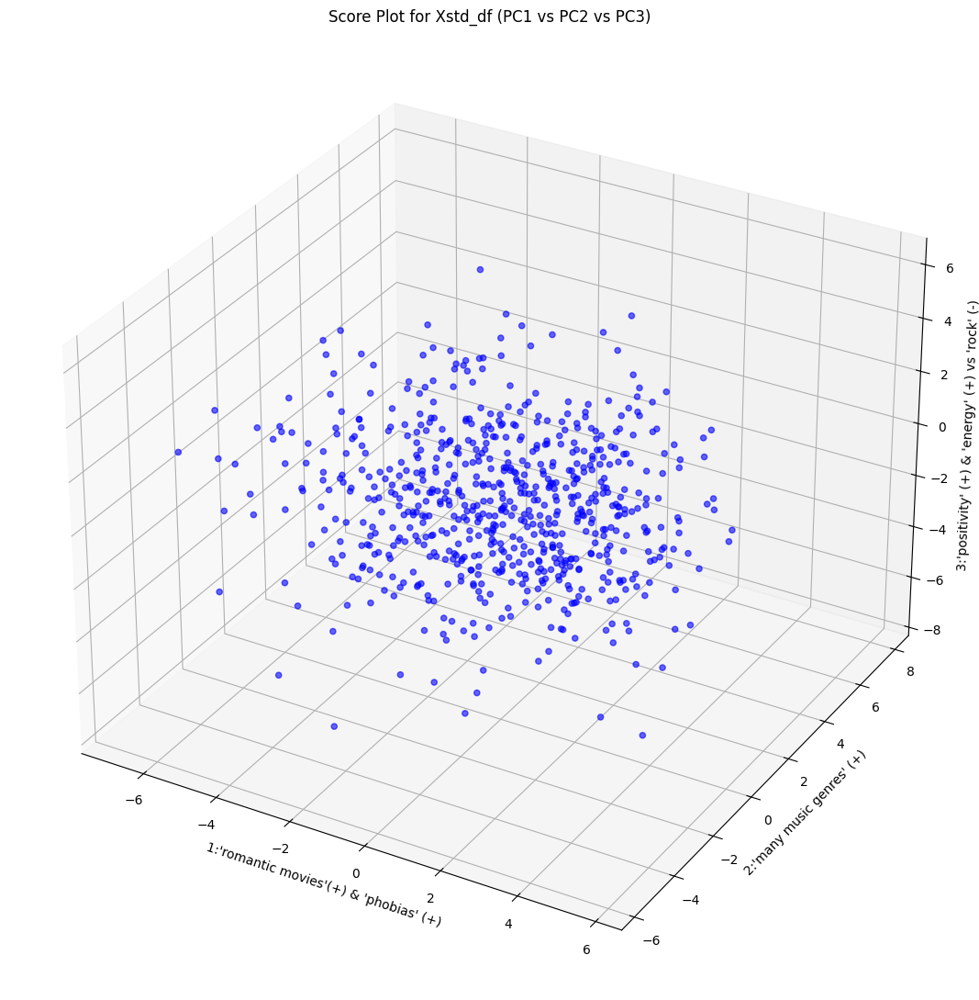

In [67]:
# Perform PCA with 3 components and transform the data
pca_Xstd_df_3 = PCA(n_components=3, random_state = random_seed)
Y_Xstd_df_3 = pca_Xstd_df_3.fit_transform(Xstd_df)
plot_3d_pca(Y_Xstd_df_3, pcs_names_Xstd_df, 'Xstd_df')

##### 3.1.6) Score graph of Xmm_df wrt the first 3 PCs

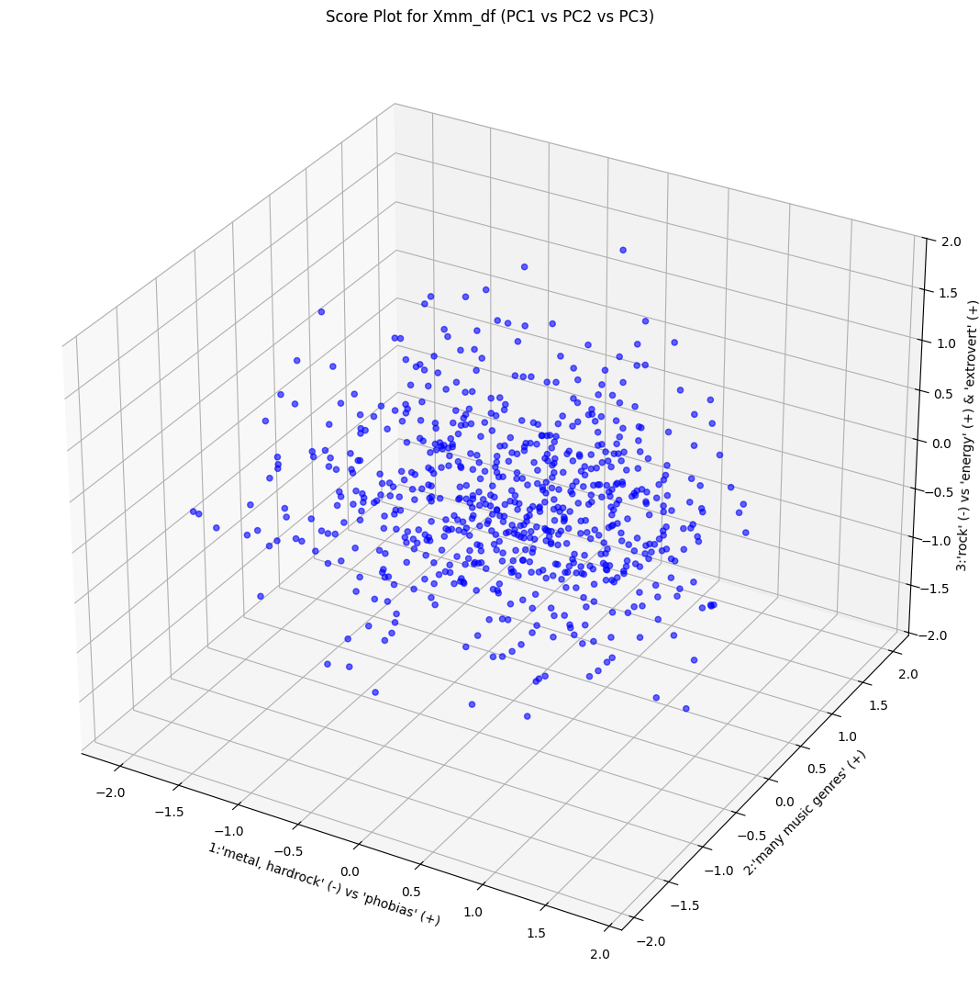

In [68]:
# Perform PCA with 3 components and transform the data
pca_Xmm_df_3 = PCA(n_components=3, random_state = random_seed)
Y_Xmm_df_3 = pca_Xmm_df_3.fit_transform(Xmm_df)
plot_3d_pca(Y_Xmm_df_3, pcs_names_Xmm_df, 'Xmm_df')

##### Observations:
The analysis compares the data projection in the first three principal components (PC1, PC2, PC3) obtained with PCA on two versions of the dataset: standardised (`Xstd_df`) and normalised Min-Max (`Xmm_df`).

Both score plots show a spherical/ellipsoidal point cloud centred on the origin. This indicates a similar variance structure and the absence of obvious clusters in the first three principal components. The distribution of points appears uniform in both graphs.

The main difference lies in the scale of the axes: wider for `Xstd_df` (about -6/+8) and narrower for `Xmm_df` (about -2/+2), reflecting the different scaling transformations. Standardisation (StandardScaler) centres at zero mean and scales by standard deviation, while Min-Max normalisation scales in a narrow range. 


##### 3.1.7) Graphs of additional scores for comparing Xstd and Xmm against certain labels
First, we take a look at the labels.

We now proceed with the visualisation of the score plots, considering three selected labels. The objective is to analyse the arrangement of the data in principal component space in relation to these labels.

In [69]:
labels = variables_by_type['Demographics']
labels

['Age',
 'Height',
 'Weight',
 'Number of siblings',
 'Gender',
 'Hand',
 'Education',
 'Only child',
 'Home Town Type',
 'Home Type']

We choose 3 labels for our analysis:
- Age
- Gender
- Only child

###### 3.1.7.1) First label: Age

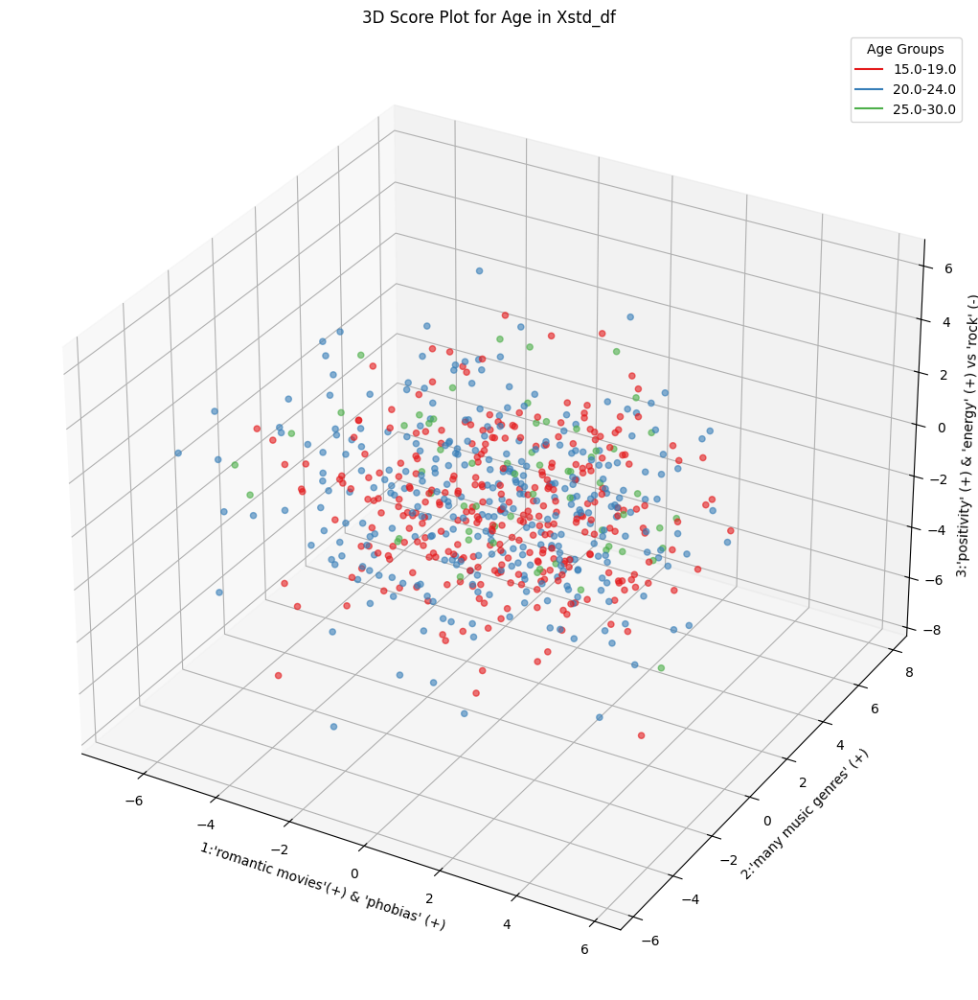

In [72]:
plot_3d_with_groups(encoded_fill_df_combined, Y_Xstd_df_3, 'Age', pcs_names_Xstd_df, 'Xstd_df', group_size=5)

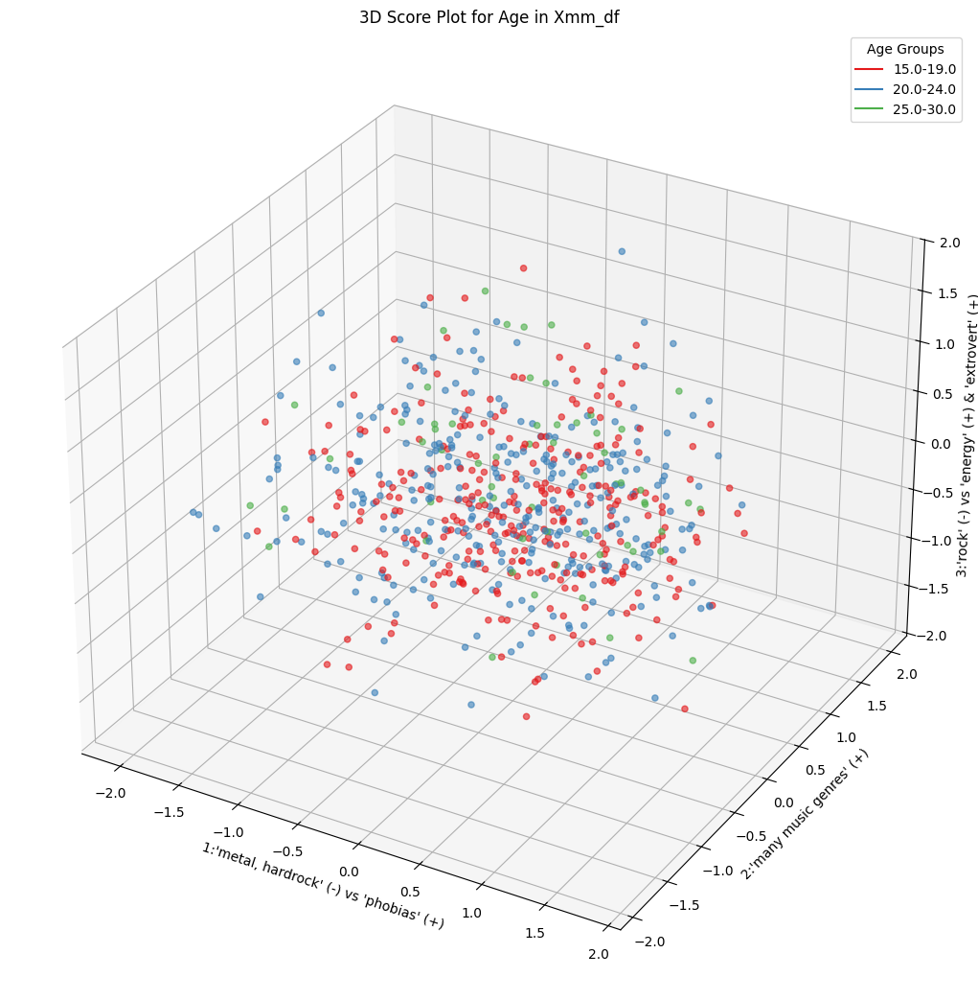

In [73]:
plot_3d_with_groups(encoded_fill_df_combined, Y_Xmm_df_3, 'Age', pcs_names_Xmm_df, 'Xmm_df', group_size=5)

###### Observations:
We divided the points into three age groups, since the 'Age' column has a lot of different values.
By plotting the points with respect to the first 3 PCs, there is no clear division of the points with respect to the current label.
By looking at the names of the first 3 PCs in both dataframes, we think that they are not so relevant into dividing the points by 'Age', for example music lovers and shy people belong to a wide range of age values.

###### 3.1.7.2) Second label: Gender

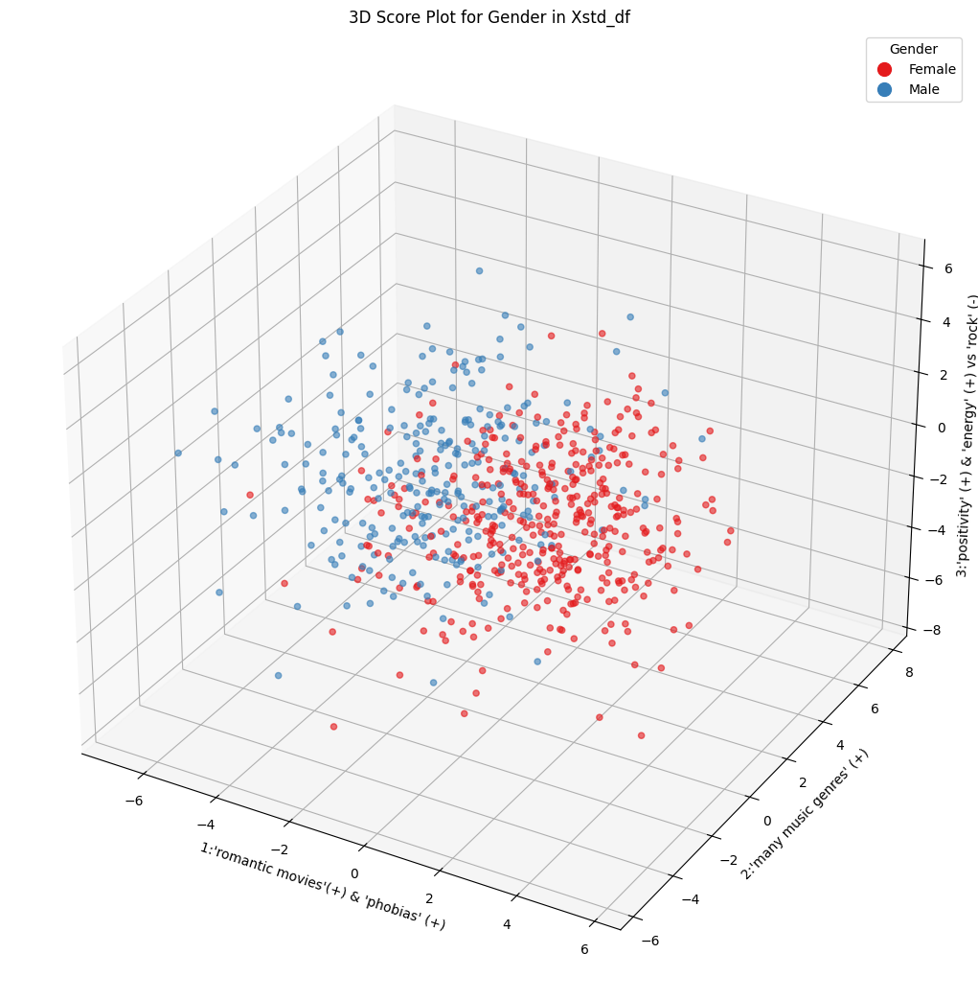

In [74]:
gender_labels = {1: 'Female', 2: 'Male'}
plot_3d_with_labels(encoded_fill_df_combined, Y_Xstd_df_3, 'Gender', pcs_names_Xstd_df, gender_labels, 'Xstd_df')

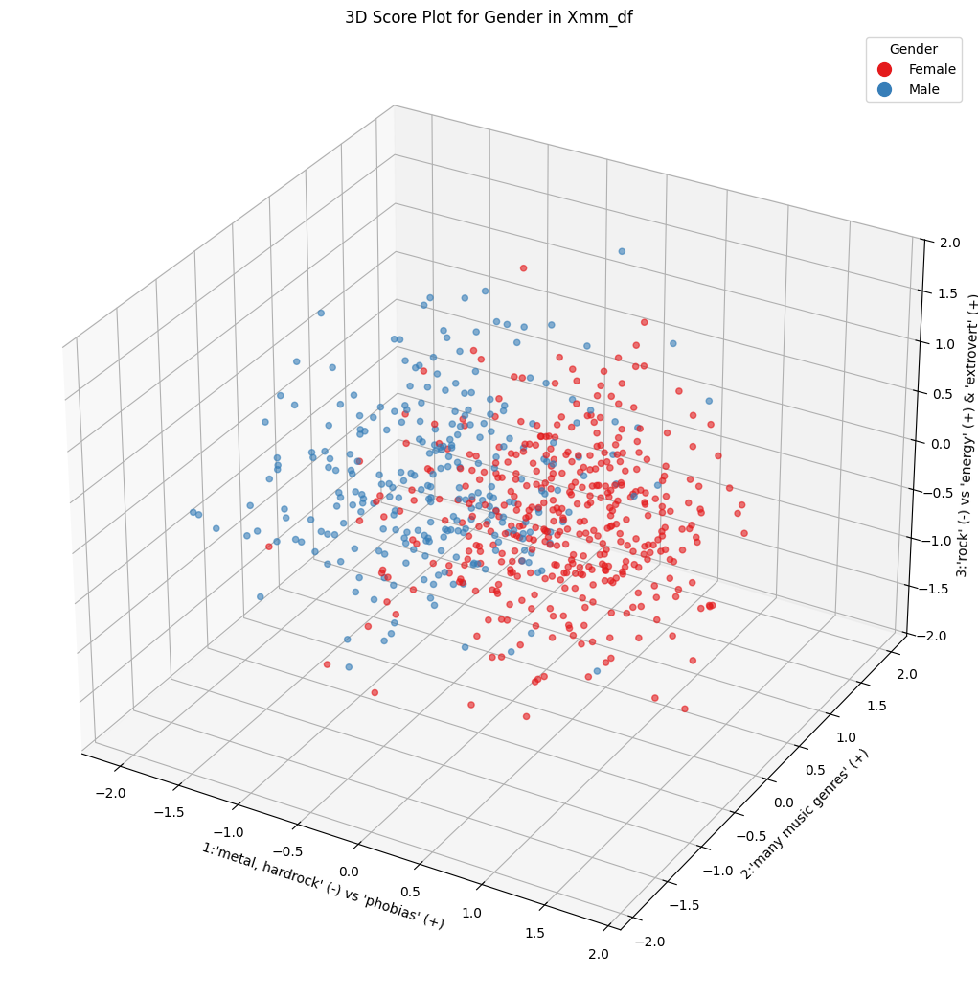

In [75]:
plot_3d_with_labels(encoded_fill_df_combined, Y_Xmm_df_3, 'Gender', pcs_names_Xmm_df, gender_labels, 'Xmm_df')

###### Observations:
Here, when plotting the points and labelling them by 'Gender', there is a much clearer division in both cases. This means that, even only the first 3 PCs carry enough information to  divide quite well the points with respect to the aformentioned label. What we can especially tell is that people of 'Female' gender tend to love many music genres than the others in the X_std_df. In the Xmm_df, 'Male' individuals prefer metal and hardrock more than females.


###### 3.1.7.3) Third label: Only child

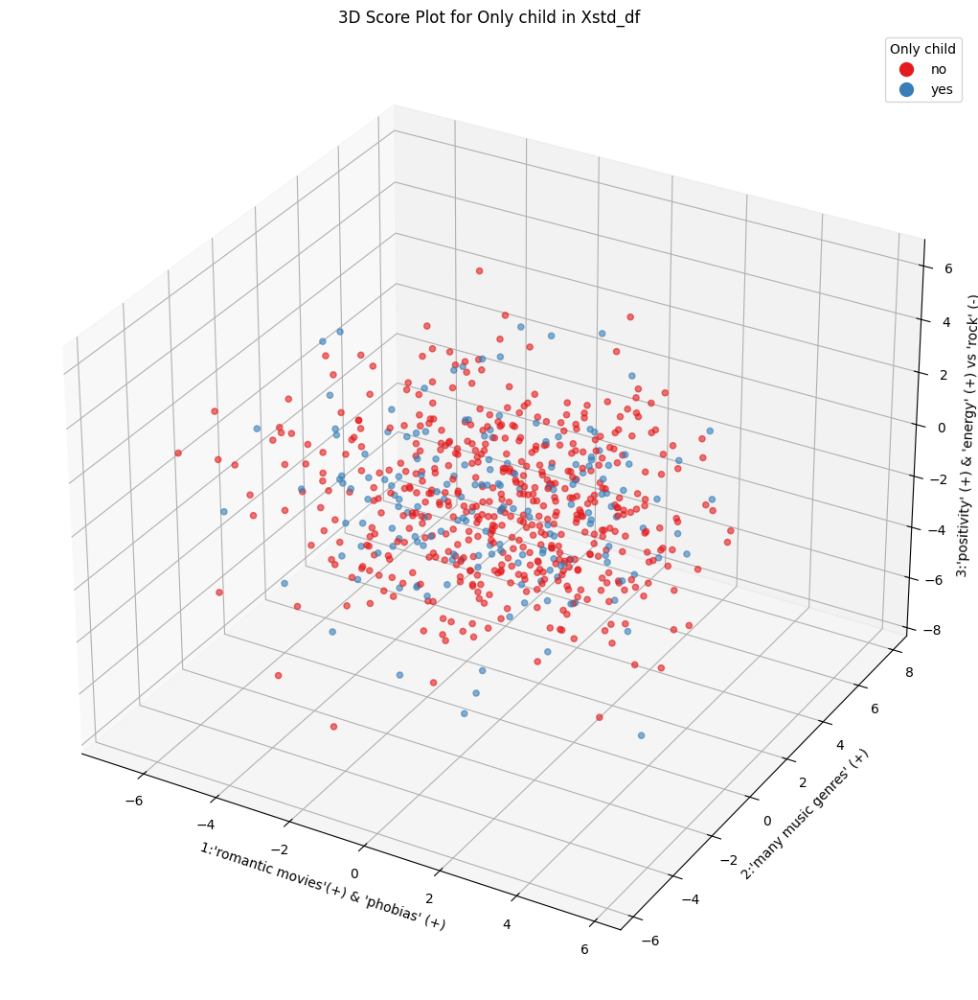

In [76]:
only_child_labels = {1: 'no', 2: 'yes'}
plot_3d_with_labels(encoded_fill_df_combined, Y_Xstd_df_3, 'Only child', pcs_names_Xstd_df, only_child_labels, 'Xstd_df')

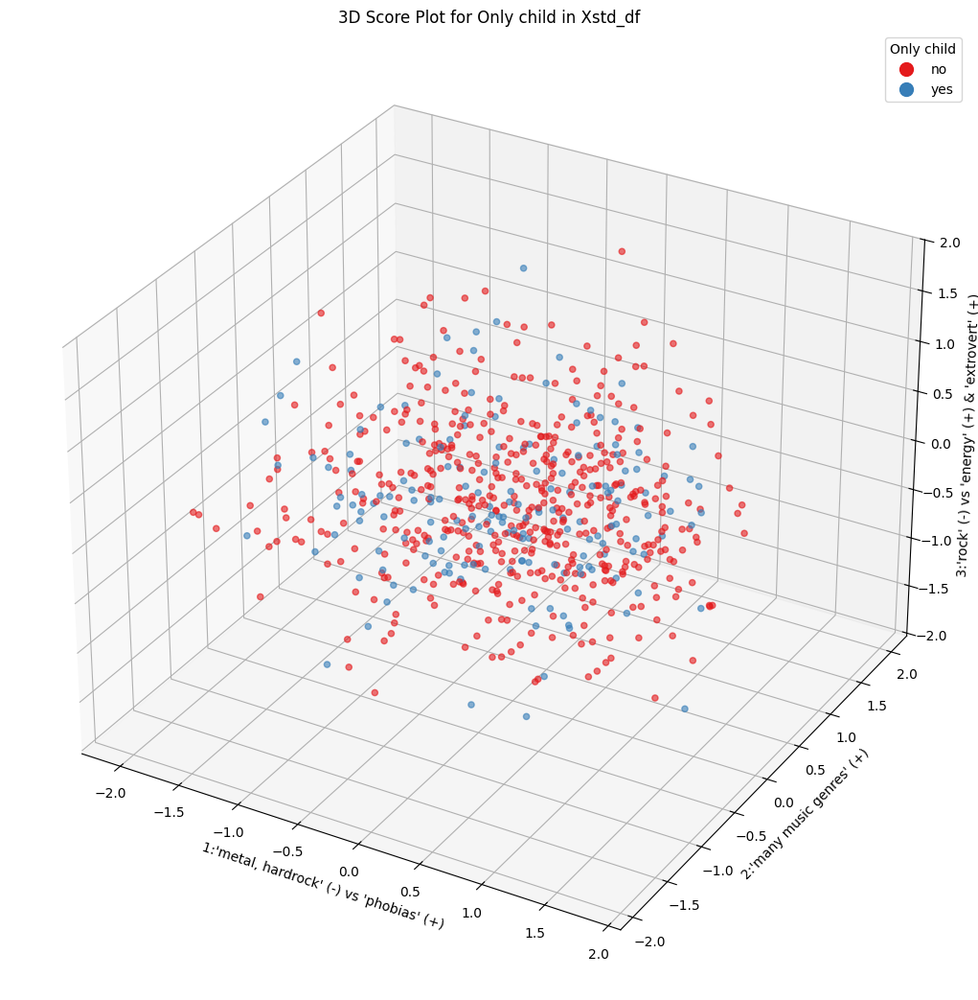

In [77]:
plot_3d_with_labels(encoded_fill_df_combined, Y_Xmm_df_3, 'Only child', pcs_names_Xmm_df, only_child_labels, 'Xstd_df')

###### Observations:
Just like in the case of 'Age', no clear pattern is found because the 3 PCs are not related enough to being an only child or not.

#### 3.2) Dropped Dataset

##### 3.2.1) Calculation of the number m of PCs that will be used for Xstd_df and plots
Calculation and display of variance explained for the selection of the number of principal components.

In [78]:
expl_var_std = np.cumsum(pca_Xstd_df_drop.explained_variance_ratio_) # Explained cumulative variance for Xstd_df
min_num_comp_std = np.argmax(expl_var_std >= 0.33) + 1 # Minimum number of pcs for 33% explained variance for Xstd_df_drop
m_std = min(min_num_comp_std, 5)
print(f'The minimum number of PCs to explain 33% of variance for the dataset Xstd_df is {min_num_comp_std}.\nThe number of PCs that will be used is {m_std}, that explain {expl_var_std[m_std - 1]*100:.2f}% of the variance.')

The minimum number of PCs to explain 33% of variance for the dataset Xstd_df is 9.
The number of PCs that will be used is 5, that explain 24.70% of the variance.


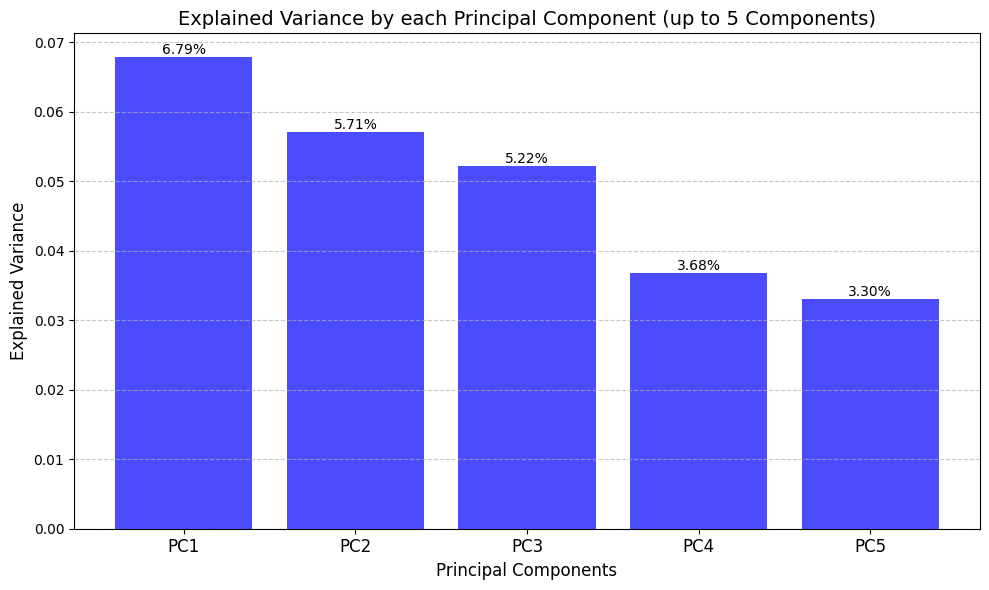

In [79]:
plot_explained_variance_barplot(pca_Xstd_df_drop, m_std)

In [80]:
# Perform PCA with m_std components and transform the data
pca_Xstd_df_drop_m = PCA(n_components=m_std, random_state = random_seed)
Y_Xstd_df_drop_m = pca_Xstd_df_drop_m.fit_transform(Xstd_df_drop)

##### 3.2.2) Calculation of the number m of PCs that will be used for Xmm_df and plots
Calculation and display of variance explained for the selection of the number of principal components.

In [81]:
expl_var_mm = np.cumsum(pca_Xmm_df_drop.explained_variance_ratio_) # Explained cumulative variance for X_df
min_num_comp_mm = np.argmax(expl_var_mm >= 0.33) + 1 # Minimum number of pcs for 33% explained variance for Xmm_df_drop
m_mm = min(min_num_comp_mm, 5)
print(f'The minimum number of PCs to explain 33% of variance for the dataset Xmm_df is {min_num_comp_mm}.\nThe number of PCs that will be used is {m_mm}, that explain {expl_var_mm[m_mm - 1]*100:.2f}% of the variance.')

The minimum number of PCs to explain 33% of variance for the dataset Xmm_df is 8.
The number of PCs that will be used is 5, that explain 26.47% of the variance.


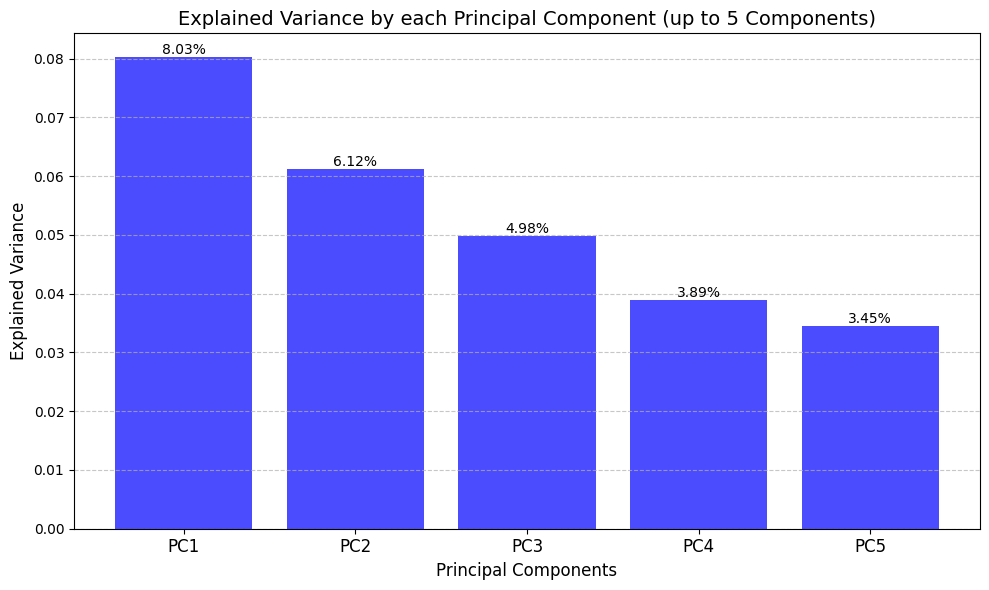

In [82]:
plot_explained_variance_barplot(pca_Xmm_df_drop, m_mm)

In [83]:
# Perform PCA with m_mm components and transform the data
pca_Xmm_df_drop_m = PCA(n_components=m_mm, random_state = random_seed)
Y_Xmm_df_drop_m = pca_Xmm_df_drop_m.fit_transform(Xmm_df_drop)

##### 3.2.3) Interpretation of PCs of Xstd_df_drop

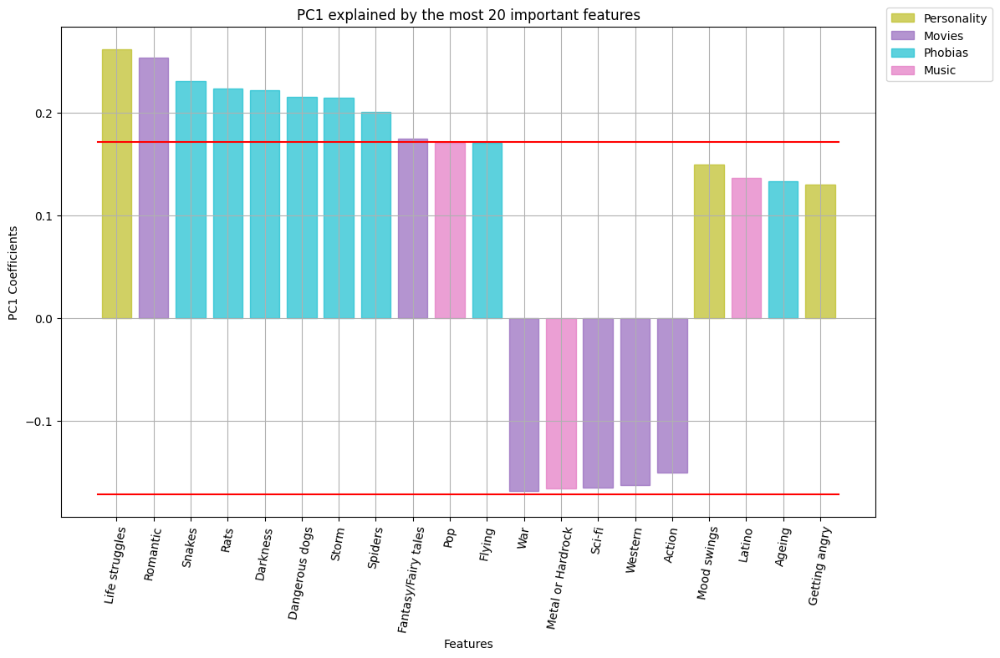

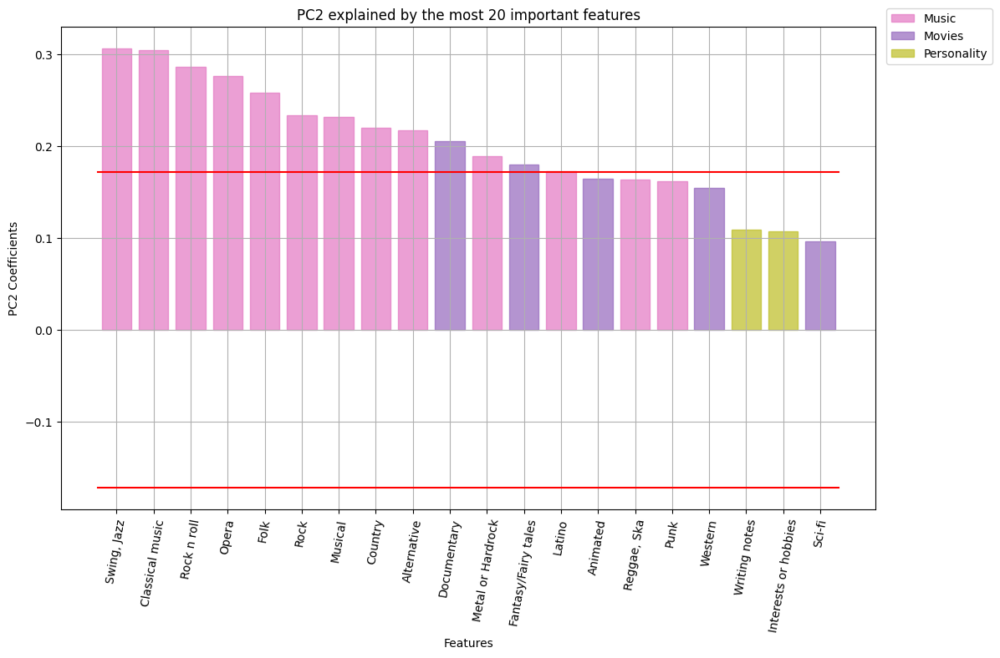

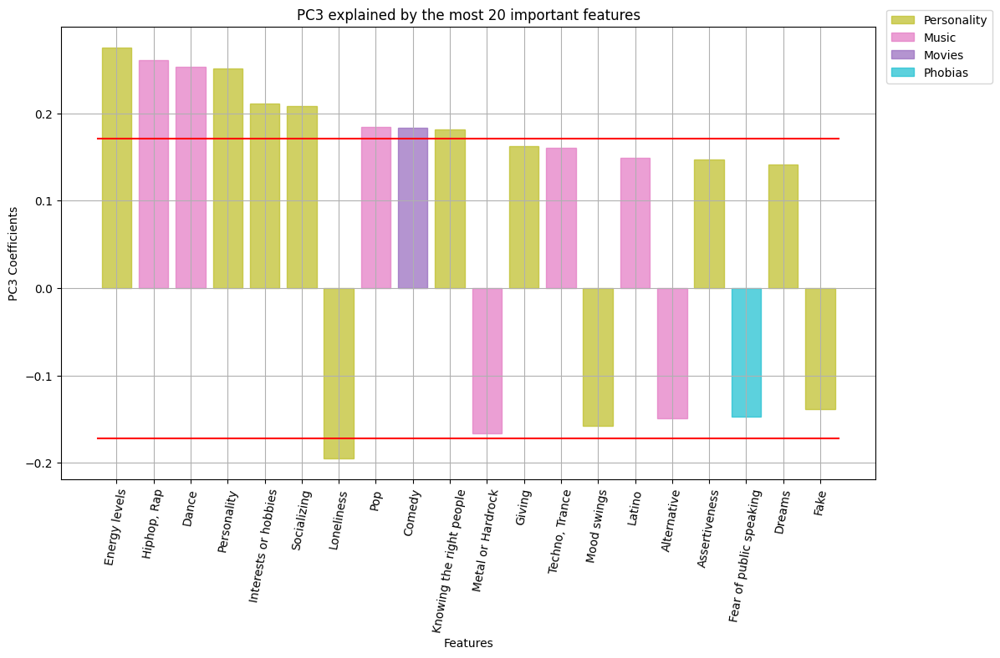

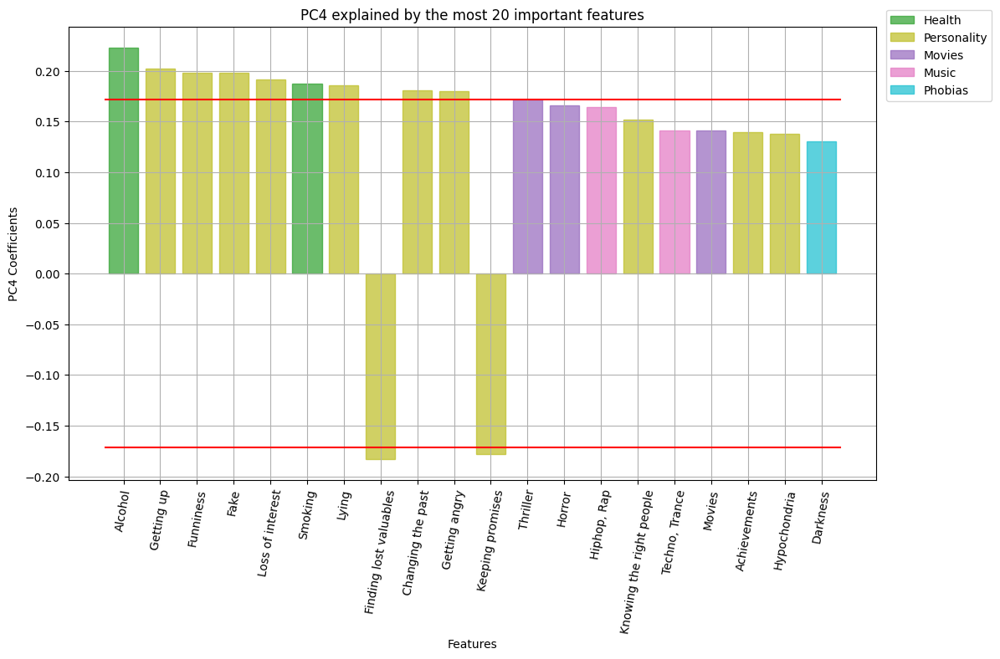

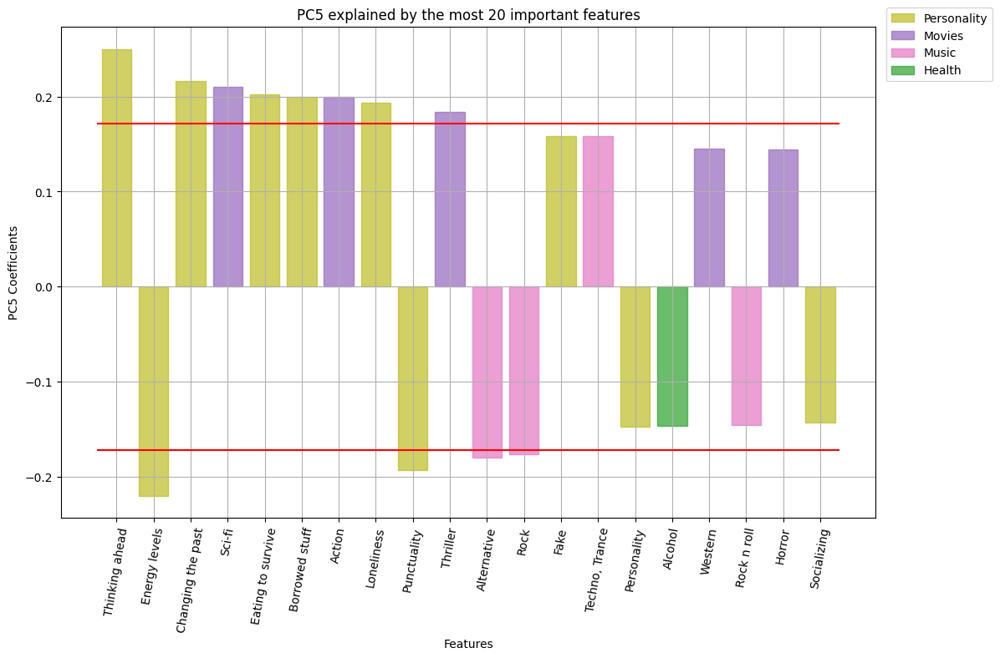


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Life struggles', 'Storm', 'Darkness', 'Spiders', 'Snakes', 'Rats', 'Dangerous dogs', 'Romantic', 'Fantasy/Fairy tales']
HIGH-VALUED NEGATIVE COMPONENTS: []
*********************************************


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Folk', 'Country', 'Classical music', 'Musical', 'Rock', 'Metal or Hardrock', 'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 'Opera', 'Fantasy/Fairy tales', 'Documentary']
HIGH-VALUED NEGATIVE COMPONENTS: []
*********************************************


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Socializing', 'Knowing the right people', 'Personality', 'Energy levels', 'Interests or hobbies', 'Dance', 'Pop', 'Hiphop, Rap', 'Comedy']
HIGH-VALUED NEGATIVE COMPONENTS: ['Loneliness']
*********************************************


****************** PC4 **********************
HIGH-VAL

In [84]:
plot_pca_features(Xstd_df_drop, pca_Xstd_df_drop_m, filtered_variables_by_type)

##### NAMES FOR THE 5 PCS of Xstd_df_drop
1. PC1:  " *life struggles* (+) & *phobias* (+)" ; 
1. PC2: "*many music genres*(+)";
1. PC3: "*loneliness* (-) vs *energy * (+) & *hobbies* (+)";
1. PC4 : "*alcohol* (+) vs *honest* (-) "
1. PC5 : "*positive traits* (-) & *bad habits* (-) vs * sci-fi movies* (+)"

In [85]:
# Creation of the list of Xstd_df'sPCs' names
pcs_names_Xstd_df_drop = [
    "1:'life struggless'(+) & 'phobias' (+)",
    "2:'many music genres' (+)",
    "3:'loneliness' (-) vs 'energy' (+) & 'hobbies' (+)",
    "4:'alcohol' (+) vs 'honest' (-)  ",
    "5:'positive traits' (-) & 'bad habits' (-) vs 'sci-fi movies' (+)"
]

##### 3.2.4) Interpretation of PCs of Xmm_df_drop

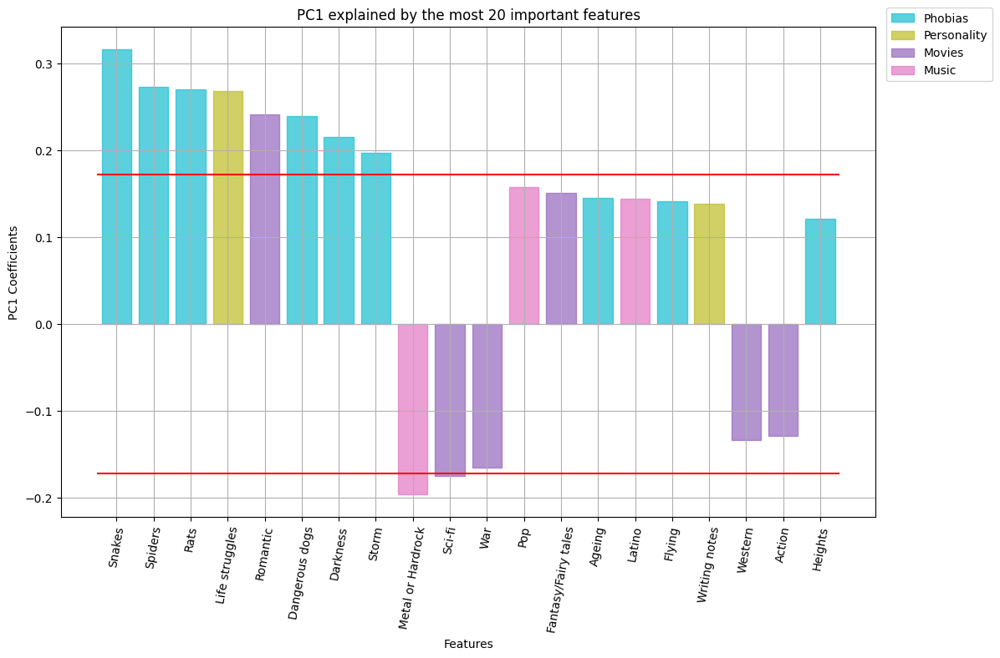

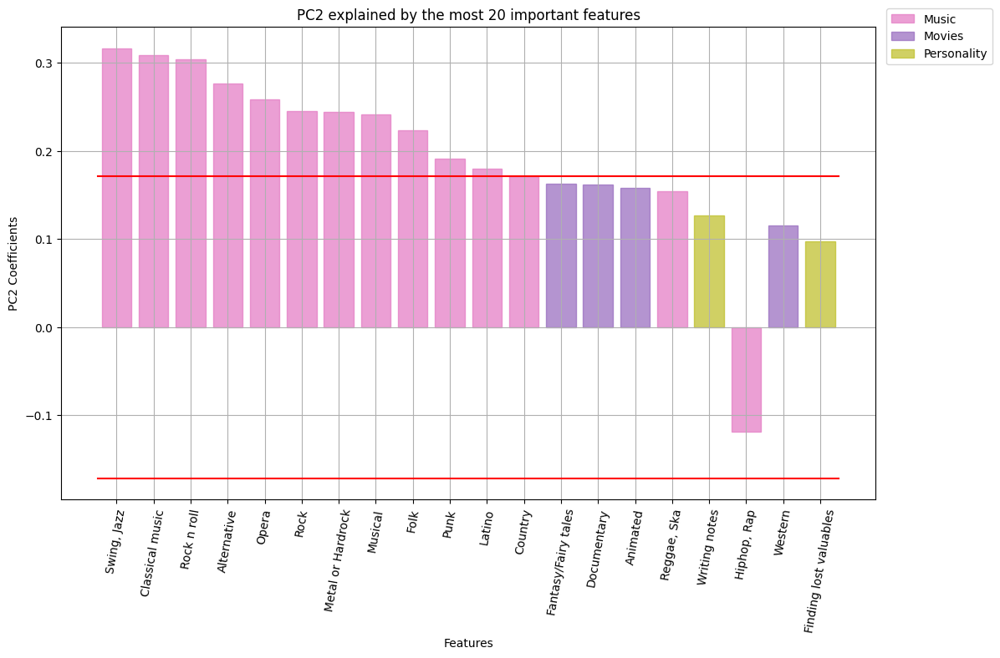

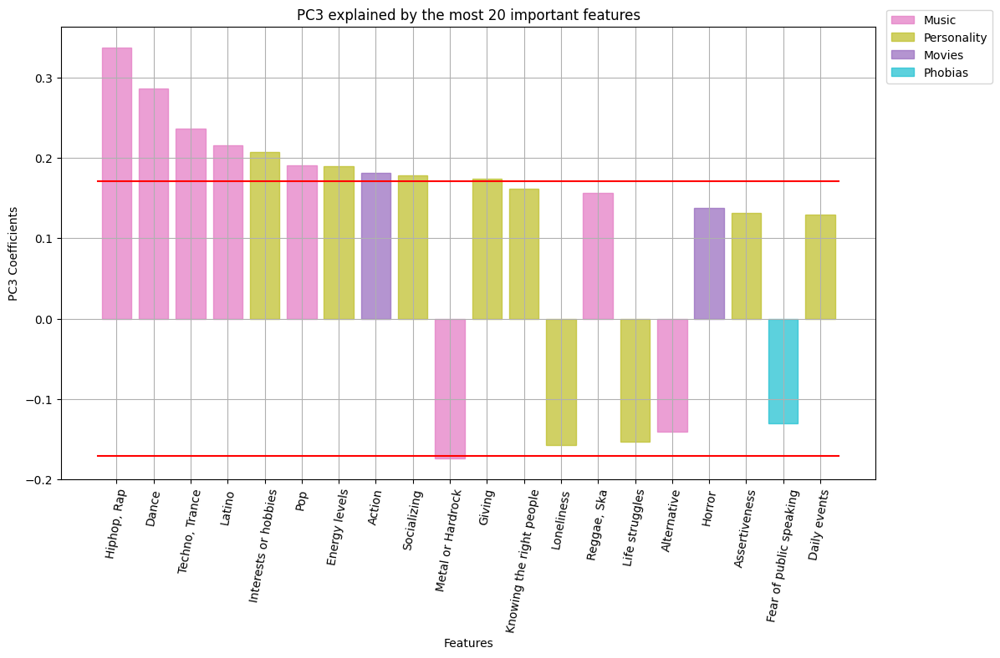

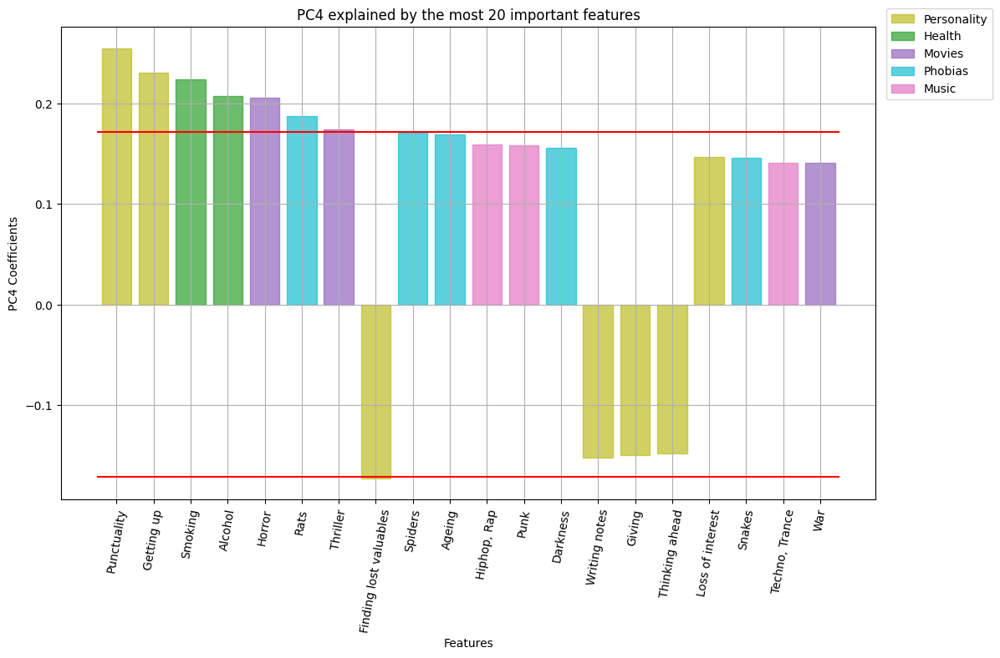

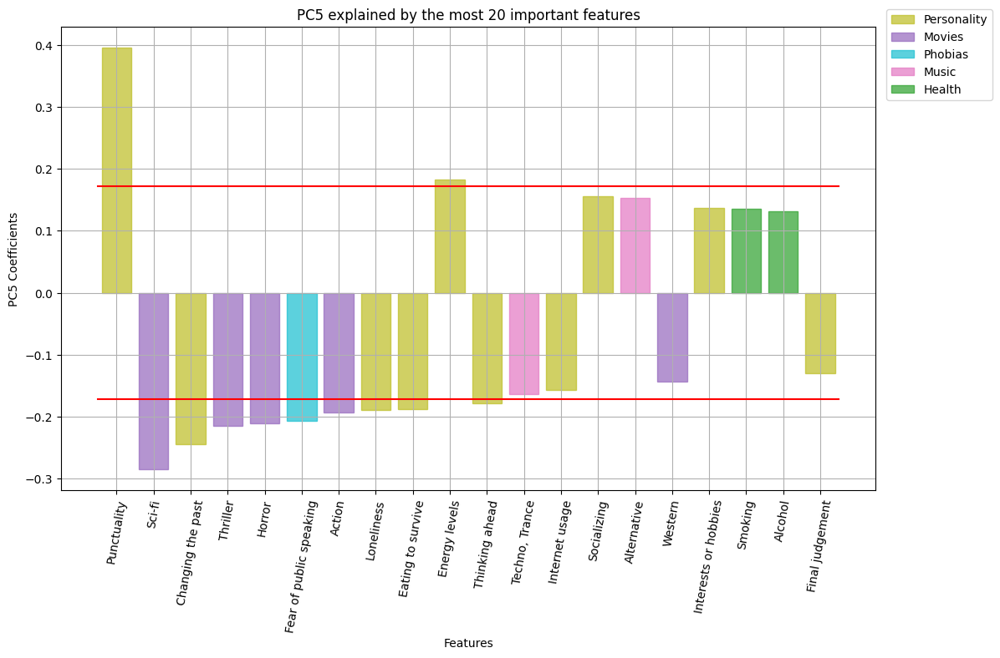


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Life struggles', 'Storm', 'Darkness', 'Spiders', 'Snakes', 'Rats', 'Dangerous dogs', 'Romantic']
HIGH-VALUED NEGATIVE COMPONENTS: ['Metal or Hardrock', 'Sci-fi']
*********************************************


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Folk', 'Classical music', 'Musical', 'Rock', 'Metal or Hardrock', 'Punk', 'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 'Opera']
HIGH-VALUED NEGATIVE COMPONENTS: []
*********************************************


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Socializing', 'Giving', 'Energy levels', 'Interests or hobbies', 'Dance', 'Pop', 'Hiphop, Rap', 'Latino', 'Techno, Trance', 'Action']
HIGH-VALUED NEGATIVE COMPONENTS: ['Metal or Hardrock']
*********************************************


****************** PC4 **********************
HIGH-VALUED POSITIVE COMPONENTS: ['Punctu

In [86]:
plot_pca_features(Xmm_df_drop, pca_Xmm_df_drop_m, filtered_variables_by_type)

##### NAMES FOR THE 5 PCS of Xmm_df_drop
1. PC1:  " *life struggles* (+) & *phobias* (+) ; 
1. PC2: "*many music genres* (+)";
1. PC3: " *energy* (+) & *hobbies* (+)";
1. PC4 : "*bad habits* (+) & *phobias* (+)"
1. PC5 : "*interests or hobbies* (+) vs *thriller , horror* (-) & *introversion* (-)"

In [87]:
# Creation of the list of Xmm_df_drop'sPCs' names
pcs_names_Xmm_df_drop = [
    "1:'life struggles' (+) & 'phobias' (+)",
    "2:'many music genres' (+)",
    "3:'energy' (+) & 'hobbies' (+)",
    "4:'phobias' (+) & 'bad habits' (+)",
    "5:'interests or hobbies' (+) vs 'thriller , horror' (-) & 'introversion' (-)"
]

##### 3.2.5) Score graph of Xstd_df_drop wrt the first 3 PCs

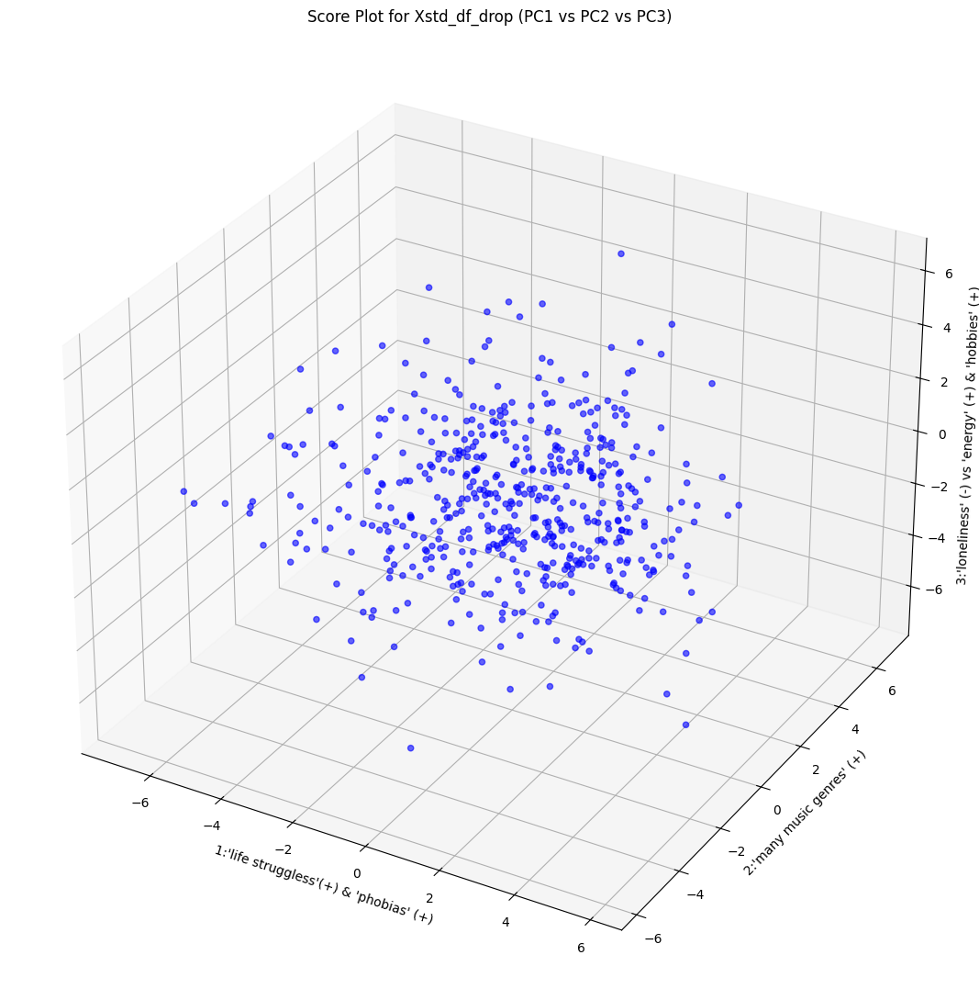

In [88]:
# Perform PCA with 3 components and transform the data
pca_Xstd_df_drop_3 = PCA(n_components=3, random_state = random_seed)
Y_Xstd_df_drop_3 = pca_Xstd_df_drop_3.fit_transform(Xstd_df_drop)
plot_3d_pca(Y_Xstd_df_drop_3, pcs_names_Xstd_df_drop, 'Xstd_df_drop')

##### 3.2.6) Score graph of Xmm_df wrt the first 3 PCs

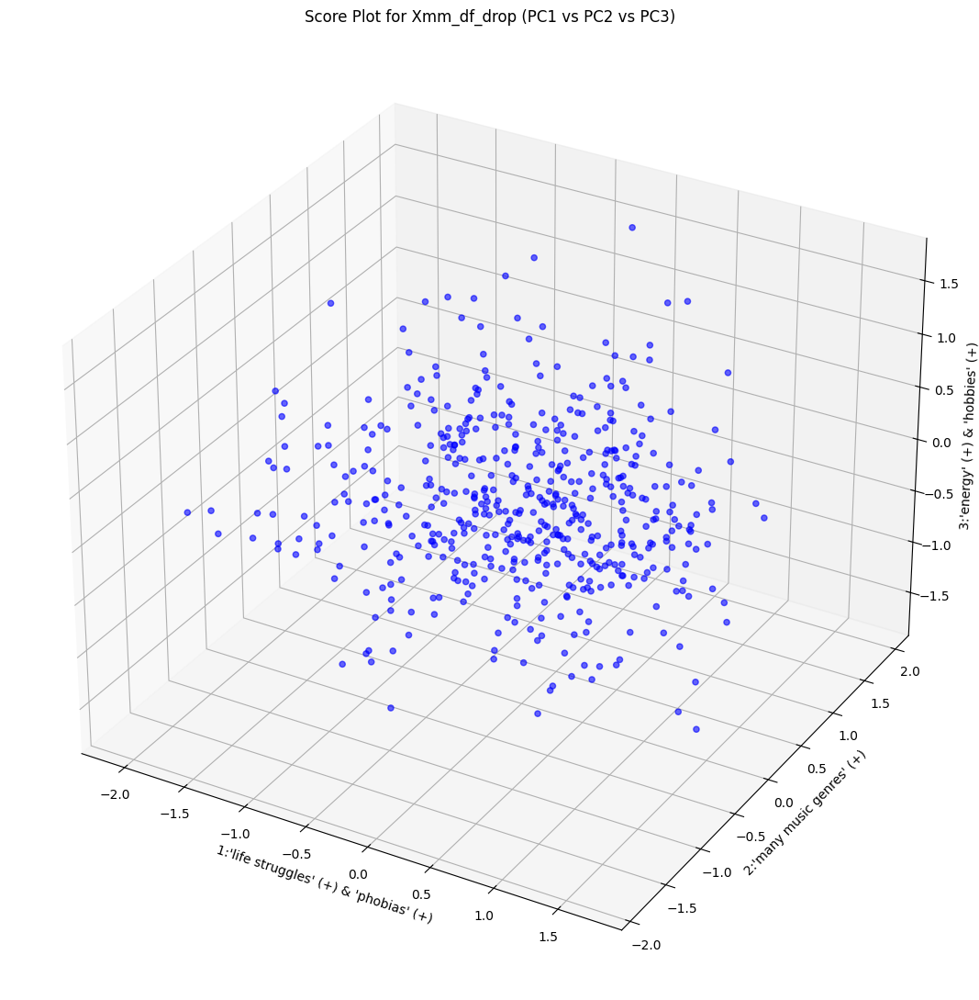

In [89]:
# Perform PCA with 3 components and transform the data
pca_Xmm_df_drop_3 = PCA(n_components=3, random_state = random_seed)
Y_Xmm_df_drop_3 = pca_Xmm_df_drop_3.fit_transform(Xmm_df_drop)
plot_3d_pca(Y_Xmm_df_drop_3, pcs_names_Xmm_df_drop, 'Xmm_df_drop')

##### 3.2.7) Graphs of additional scores for comparing Xstd_drop and Xmm_drop against certain labels
We now proceed with the visualisation of the score plots, considering the same three selected labels as before. The objective is to analyse the arrangement of the data in principal component space in relation to these labels.

###### 3.2.7.1) First label : Age

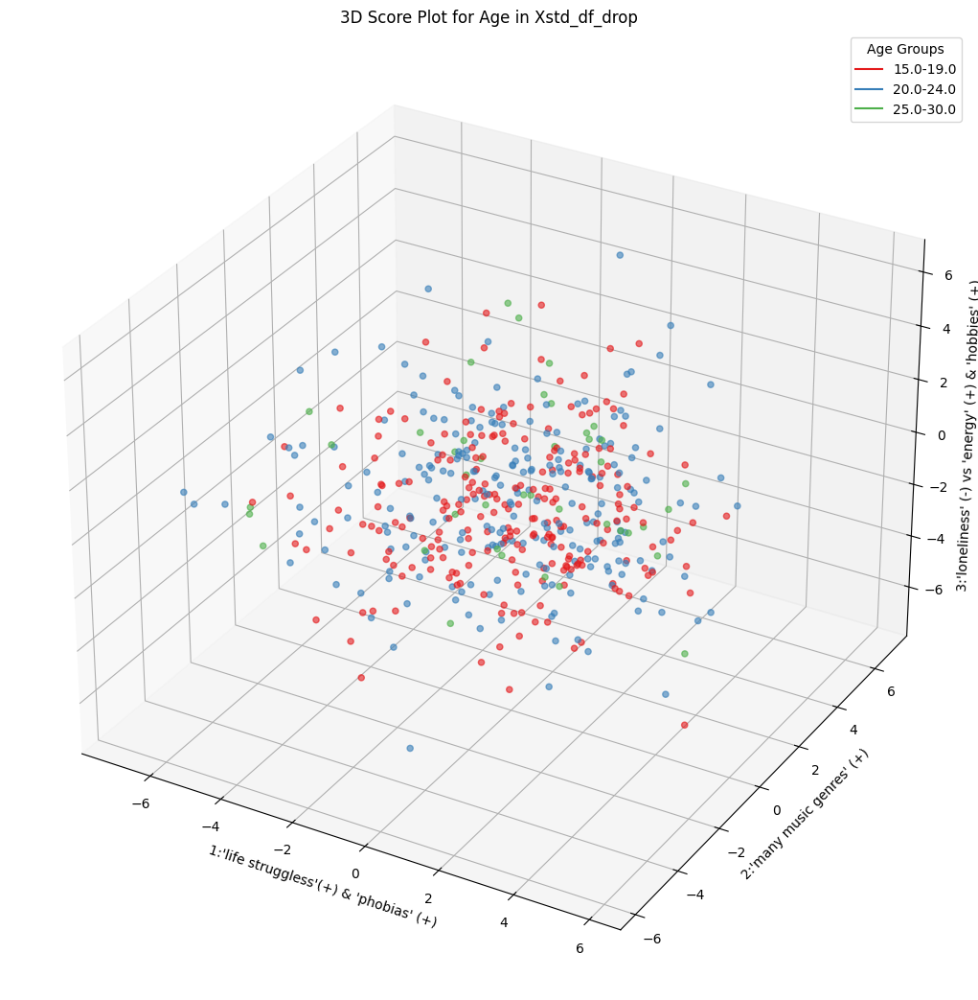

In [90]:
plot_3d_with_groups(X_df_combined_cleaned, Y_Xstd_df_drop_3, 'Age', pcs_names_Xstd_df_drop, 'Xstd_df_drop', group_size=5)

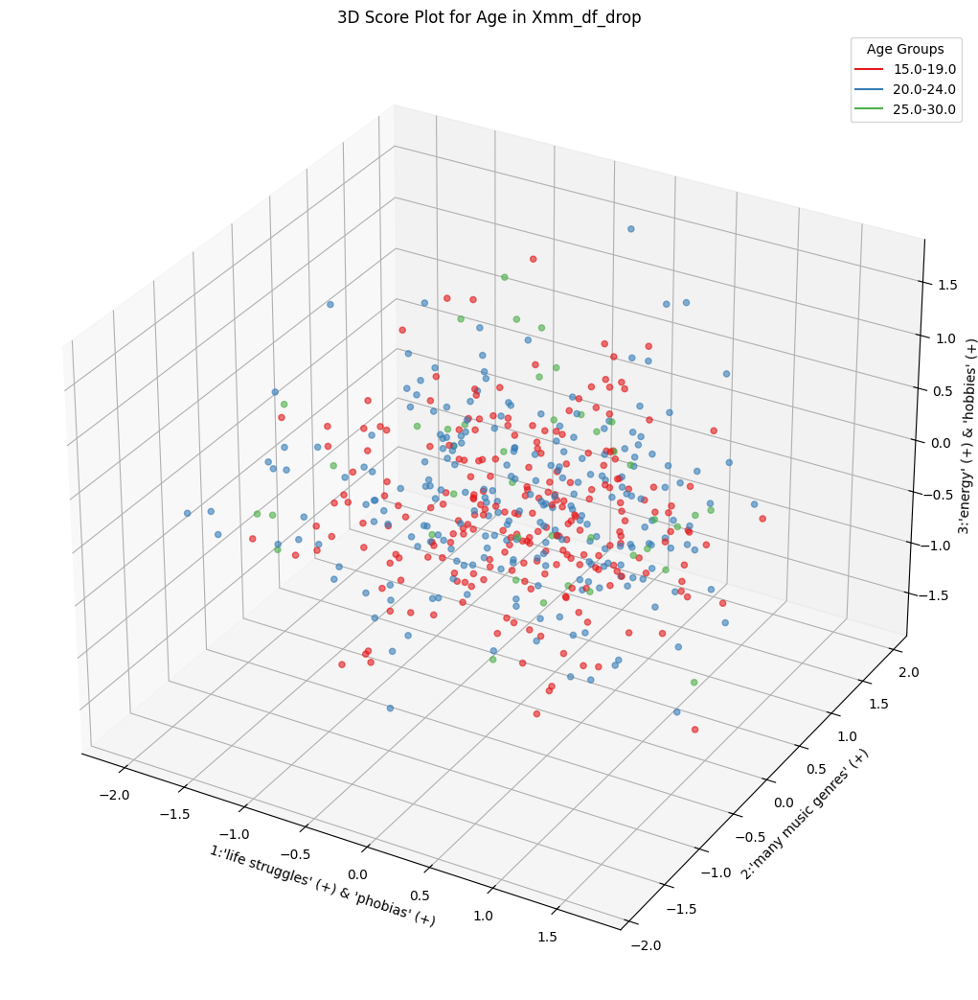

In [91]:
plot_3d_with_groups(X_df_combined_cleaned, Y_Xmm_df_drop_3, 'Age', pcs_names_Xmm_df_drop, 'Xmm_df_drop', group_size=5)

###### 3.2.7.2) Second label : Gender

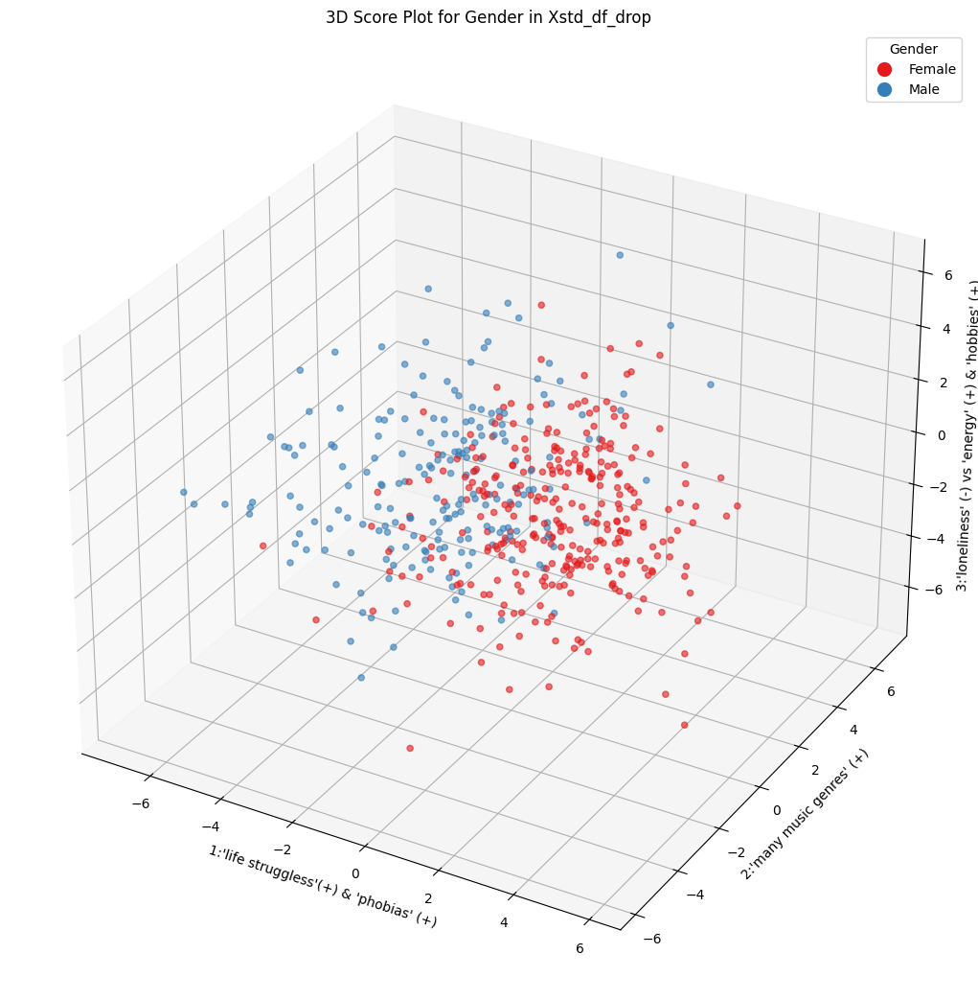

In [92]:
gender_labels = {1: 'Female', 2: 'Male'}
plot_3d_with_labels(X_df_combined_cleaned, Y_Xstd_df_drop_3, 'Gender', pcs_names_Xstd_df_drop, gender_labels, 'Xstd_df_drop')

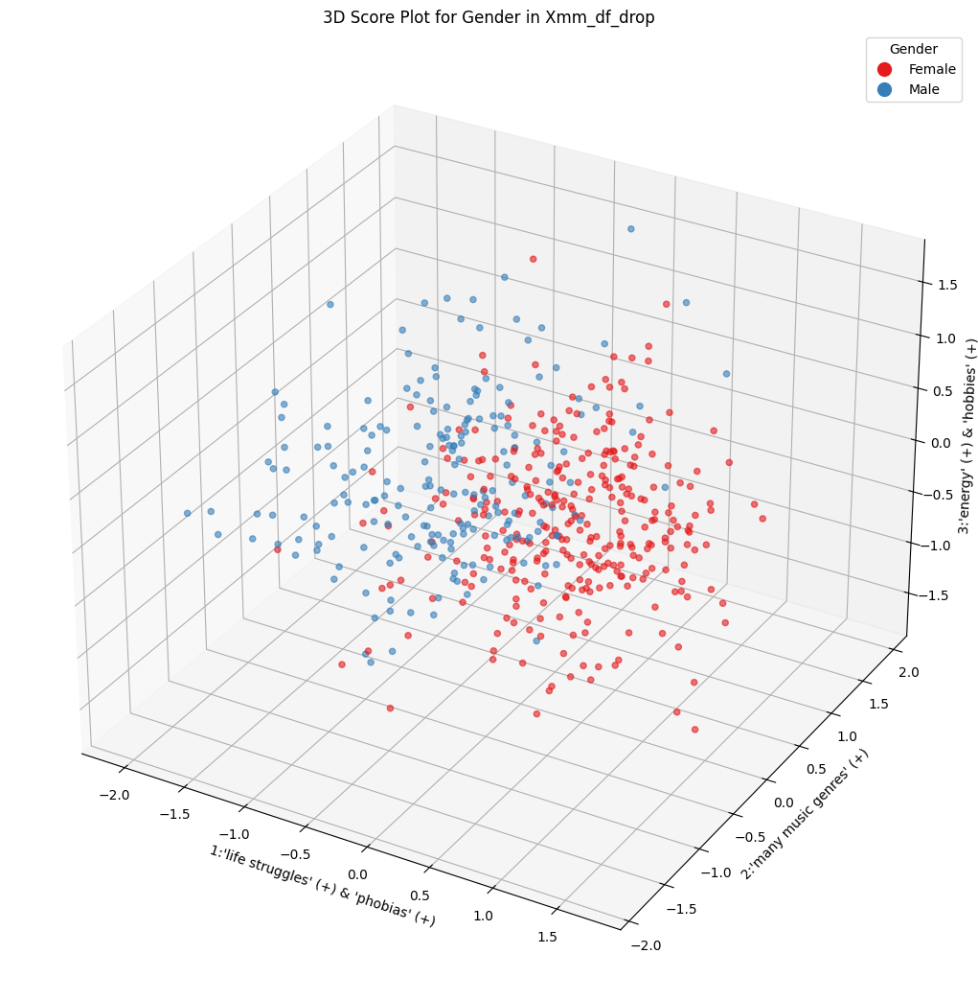

In [93]:
plot_3d_with_labels(X_df_combined_cleaned, Y_Xmm_df_drop_3, 'Gender', pcs_names_Xmm_df_drop, gender_labels, 'Xmm_df_drop')

###### 3.2.7.3) Third label : Only child

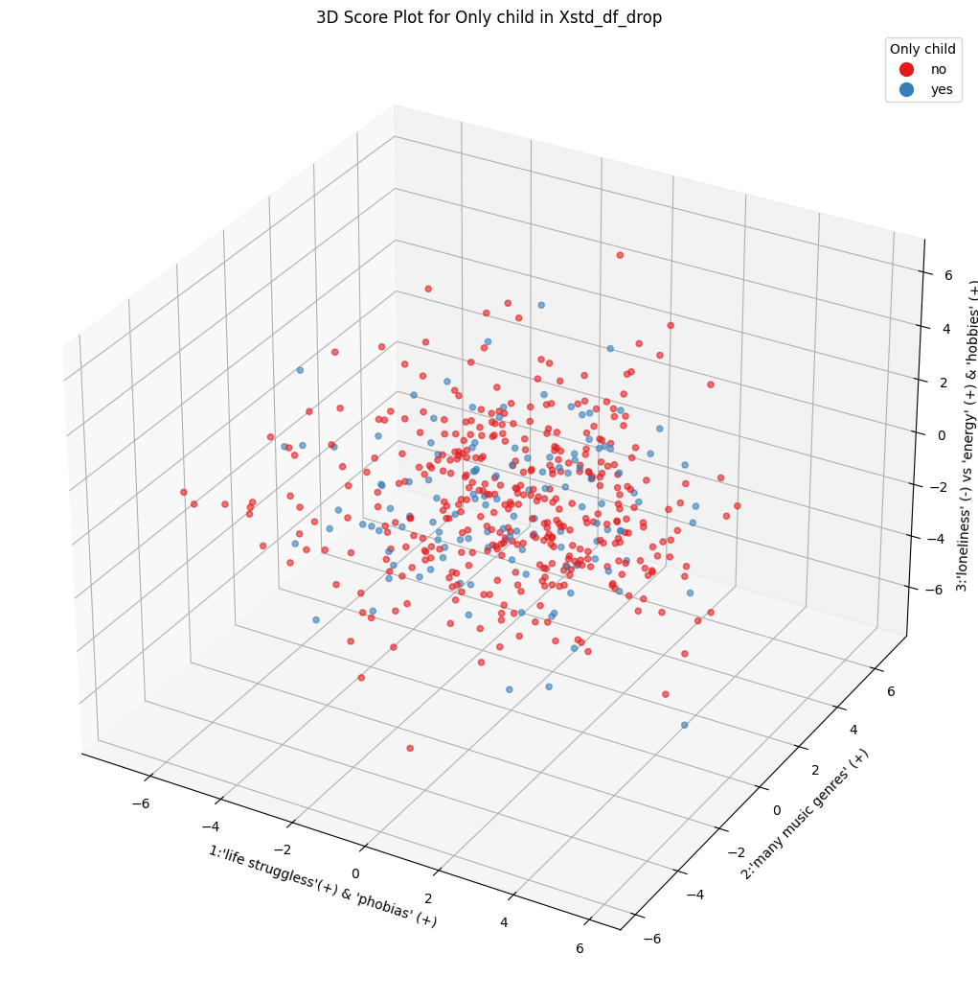

In [94]:
only_child_labels = {1: 'no', 2: 'yes'}
plot_3d_with_labels(X_df_combined_cleaned, Y_Xstd_df_drop_3, 'Only child', pcs_names_Xstd_df_drop, only_child_labels, 'Xstd_df_drop')

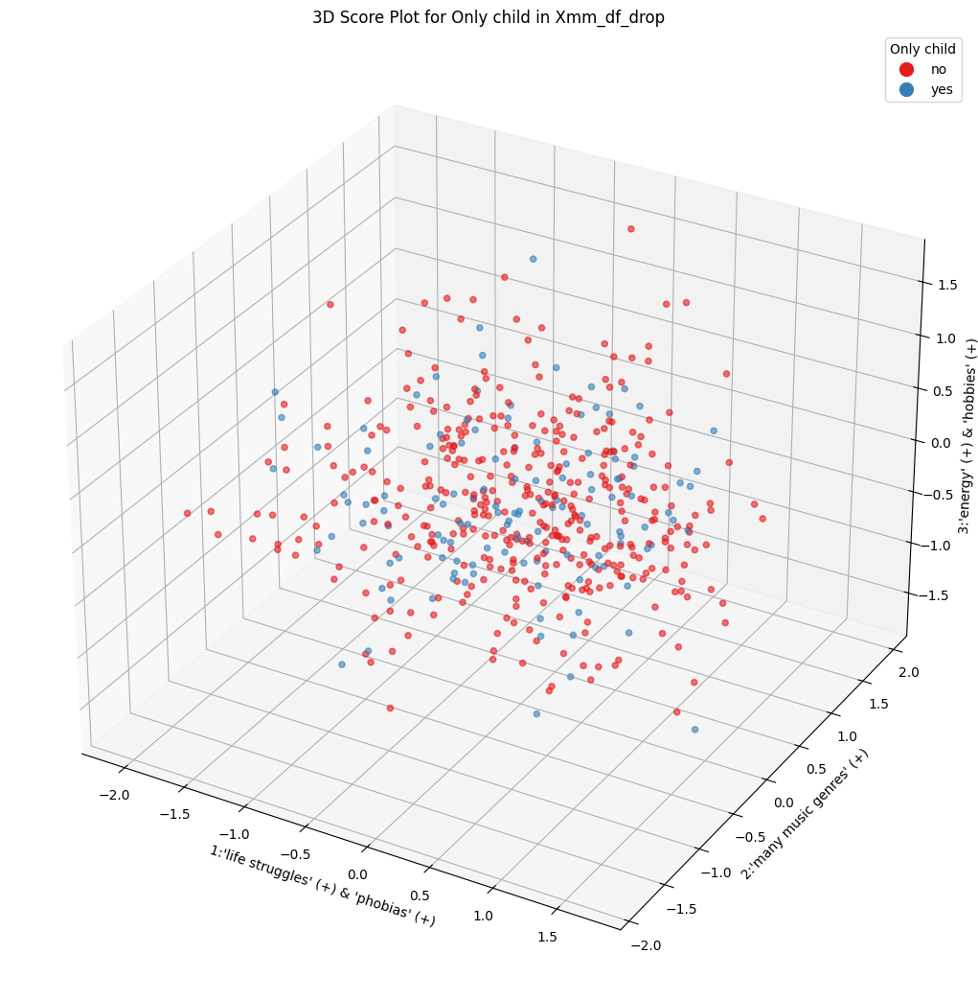

In [95]:
plot_3d_with_labels(X_df_combined_cleaned, Y_Xmm_df_drop_3, 'Only child', pcs_names_Xmm_df_drop, only_child_labels, 'Xmm_df_drop')

###### Observations:
Similar considerations as in the case of the filled dataframes can be made, so the only label that divides the projected data quite well on the space defined by the first 3 PCS is the label 'Gender'. There are no particular patterns to be found in the other plots.

#### Comments on the results:
Except for the label 'Gender', the other two analyzed labels show no particular patterns in the score plots. By looking at the names of the PCs, in every case, we understand that happens because they are not enoough meaningful to give information on whether someone is an 'Only child' or on how old they could be.

## Exercise 4. $k$-Means

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), run the $k$-Means for clustering the data. In particular, **use the silohuette score for identify the best value for $k\in\{3, \ldots, 10\}$**.
2. Plot the score graphs of exercise 3.3, adding the centroids of the cluster.
3. Observing the centroids coordinates in the PC space, **give a name/interpretation to them**, exploiting the names you assigned to the PCs. **Comment and motivate your interpretations**.

#### Functions

In [96]:
# Grid search for k-means wrt the silhouette score
def grid_kmeans(data, data_name):
    
    silhouette_list = {} 
    # Grid for the grid search
    param_grid = {
        'n_clusters' : [3, 4, 5, 6, 7, 8, 9, 10],
        'algorithm' : ['lloyd', 'elkan'],
        'init' : ['k-means++', 'random'],
        'n_init' : ["auto", 5, 10, 15, 20],
        'max_iter' : [100, 300, 500],
        'tol' : [1e-4, 1e-6, 1e-8, 1e-10]
    }
    
    for config in ParameterGrid(param_grid):
        kmean = KMeans(**config, random_state=random_seed)
        kmean.fit(data)
        silhouette_list[str(config)] = silhouette_score(data, kmean.predict(data))

    return silhouette_list

In [97]:
# Plot of the best configuration that gives a certain k by varying the number of clusters
def plot_best_config(data, data_name, algorithm, init, max_iter, n_init, tol):
    
    ks = range(3,11)
    silhouette_list = []
    
    for k in ks:
        kmean = KMeans(algorithm=algorithm, init=init, max_iter=max_iter, n_clusters=k, n_init=n_init, tol=tol, random_state=random_seed)
        kmean.fit(data)
        y_pred = kmean.predict(data)
        silhouette_list.append(silhouette_score(data, y_pred))
        
    plt.figure(figsize=(8, 6))
    plt.plot(ks, silhouette_list, marker='o')
    plt.title(f'Silhouette Score for Different Values of k for {data_name}')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.show()

In [98]:
# Plot the centroids wrt to the m Pcs we kept
def centroid_plot(data, pc_name, algorithm, init, max_iter, n_clusters, n_init, tol):
    kmean = KMeans(algorithm=algorithm, init=init, max_iter=max_iter, n_clusters=n_clusters, n_init=n_init, tol=tol, random_state=random_seed)
    kmean.fit(data)
    y_pred = kmean.predict(data)
    maxs = data.max(axis=0)
    mins = data.min(axis=0)

    fig, ax = plt.subplots(1, n_clusters, figsize=(10, 3))
    for i in range(n_clusters):
        ax[i].bar(np.arange(kmean.cluster_centers_.shape[1]), maxs, color='blue', alpha=0.15)
        ax[i].bar(np.arange(kmean.cluster_centers_.shape[1]), mins, color='blue', alpha=0.15)
        ax[i].bar(np.arange(kmean.cluster_centers_.shape[1]), kmean.cluster_centers_[i, :])
        ax[i].set_xticks(ticks=np.arange(kmean.cluster_centers_.shape[1]))
        ax[i].set_xticklabels(labels=[pc_name[0], pc_name[1], pc_name[2], pc_name[3], pc_name[4]], rotation=90)
        ax[i].grid(visible=True, which='both')
        ax[i].set_title(f'CENTROID {i + 1}')
    
    plt.show()
    return kmean, y_pred

In [99]:
# Score plot in 3d with the clusterized points and the centroids as x
def centroid_score(data, kmean, pc_name):
    markers = {0: '+', 1: '_', 2: '*', 3: 'o'}
    cmap = plt.cm.viridis
    
    fig = plt.figure(figsize=(13, 13)) 
    ax = fig.add_subplot(111, projection='3d')
    
    for i in set(kmean.labels_):
        # Extract data for current cluster
        X = data[kmean.labels_ == i, 0]
        Y = data[kmean.labels_ == i, 1]
        Z = data[kmean.labels_ == i, 2] 
    
        cluster_colors = cmap(kmean.labels_[kmean.labels_ == i] / (kmean.n_clusters - 1))
        ax.scatter(X, Y, Z, c=cluster_colors, marker=markers[i])
    
    # Plot cluster centers in black with larger size and 'x' marker
    ax.scatter(
        kmean.cluster_centers_[:, 0],
        kmean.cluster_centers_[:, 1],
        kmean.cluster_centers_[:, 2],
        c='red', marker='x', s=100
    )
    
    plt.title('SCORE GRAPH w.r.t. the CENTROIDS')
    ax.set_xlabel(pc_name[0])
    ax.set_ylabel(pc_name[1])
    ax.set_zlabel(pc_name[2])
    
    plt.show()

In [100]:
# Gives an analysis of the centroid wrt to the original features in order to find which features are more relevant when obtaining the clusters
def centroid_original_features(big_data, data, typology, pca_data, filtered_variables_by_type, kmean):
    columns = big_data.columns
    data_pd = pd.DataFrame(data, columns=columns)
    overall_mean = data_pd.mean()

    c1 = c2 = c3 = c4 = descr_c1 = descr_c2 = descr_c3 = descr_c4 = mean_c1 = mean_c2 = mean_c3 = mean_c4 = means = None
    components = pca_data.components_
    num_features_to_plot = 20
    eps = 1 / pow(data.shape[1], 1 / 3) #heuristics
    
    # Colors map
    custom_colormap = mpl.colormaps['tab10']
    group_colors = custom_colormap(np.linspace(0, 1, len(filtered_variables_by_type)))
    group_keys = list(filtered_variables_by_type.keys())
    
    # Labels added wrt clusters
    data_pd['Labels'] = kmean.labels_
    c1 = data_pd[data_pd['Labels'] == 0]
    c2 = data_pd[data_pd['Labels'] == 1]
    c3 = data_pd[data_pd['Labels'] == 2]

    
    if typology == "mm":
        mean_c1 = c1.drop("Labels", axis=1).mean()  
        mean_c2 = c2.drop("Labels", axis=1).mean()
        mean_c3 = c3.drop("Labels", axis=1).mean()
        means = [mean_c1, mean_c2, mean_c3]
        
    elif typology == "std":
        c4 = data_pd[data_pd['Labels'] == 3]
        mean_c1 = c1.drop("Labels", axis=1).mean()  
        mean_c2 = c2.drop("Labels", axis=1).mean()
        mean_c3 = c3.drop("Labels", axis=1).mean()
        mean_c4 = c4.drop("Labels", axis=1).mean()
        means = [mean_c1, mean_c2, mean_c3, mean_c4]
    

    handles = []
    labels = []
    feature_names_for_legend = [] 
    
    # Get the features of the first centroid to get their names
    feature_names_for_legend= list(means[0].index)
    feature_groups = [
        next((group for group, features in filtered_variables_by_type.items() if feature in features), None)
        for feature in feature_names_for_legend
    ]
    
    for i, feature in enumerate(feature_names_for_legend):
        group = feature_groups[i]
        if group and group not in labels:
            labels.append(group)
            handles.append(mpl.patches.Patch(color=group_colors[group_keys.index(group)], label=group))
    
    # Foe each centroid
    for ind, mean in enumerate(means):
        indices = np.argsort(np.abs(mean))[::-1][:num_features_to_plot]
        feature_names = list(mean.index[indices])
        mean_values = mean.values[indices]
    
        plt.figure(figsize=(12, 8))
    
        bar_indices = np.arange(len(feature_names))
        bars = plt.bar(bar_indices, mean_values, alpha=0.7)
    
        feature_groups = [
            next((group for group, features in filtered_variables_by_type.items() if feature in features), None)
            for feature in feature_names
        ]
        
        for i, bar in enumerate(bars):
            group = feature_groups[i]
            group_color = group_colors[group_keys.index(group)] if group else 'gray'
            bar.set_color(group_color)
    
        plt.plot([-0.5, len(bar_indices) - 0.5], [eps, eps], 'red', label='EPS Threshold')
        plt.plot([-0.5, len(bar_indices) - 0.5], [-eps, -eps], 'red', label='EPS Threshold')
    
        plt.title(f'Cluster {ind + 1} w.r.t. the original features')
        plt.xlabel('Features')
        plt.ylabel('Value')
    
        plt.xticks(bar_indices, feature_names, rotation=90)
    
        plt.legend(handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(1.15, 1.05))
        plt.grid()
        plt.tight_layout()
        plt.show()

#### 4.1) Filled Dataset

##### 4.1.1) Xstd_df

###### 4.1.1.1) Hyperparameter tuning
By applying a grid-search, we try different configurations in order to find the one that gives the best silhoutte score.

In [101]:
silhouette_list = grid_kmeans(Y_Xstd_df_m, 'Y_Xstd_df_m')

In [102]:
max_value_std = max(silhouette_list.values())
max_key = max(silhouette_list, key=silhouette_list.get)

print(f"The max value of the silhouette is {max_value_std} with the configuration {max_key}")

The max value of the silhouette is 0.1764276054687755 with the configuration {'algorithm': 'lloyd', 'init': 'random', 'max_iter': 100, 'n_clusters': 4, 'n_init': 'auto', 'tol': 0.0001}


###### 4.1.1.2) Plot as k varies
The silhouette score graph shows a peak at $k=4$, suggesting that 4 clusters are a good choice for this dataset. However, the relatively low silhouette scores (≈0.175 at peak) indicate that the cluster structure is not particularly clear-cut, suggesting a potential overlap between clusters or limited suitability of the k-means algorithm for this data.

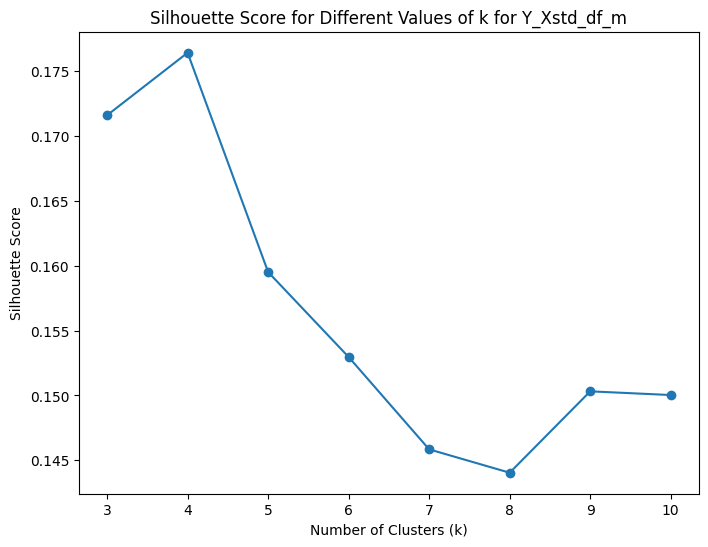

In [103]:
plot_best_config(Y_Xstd_df_m, 'Y_Xstd_df_m', 'lloyd', 'random', 100, 'auto', 0.0001)

###### 4.1.1.3) Plot to visualize the centroids
The plot shows the importance of the top five principal components (PCs) within four centroids (clusters). Each vertical bar graph represents a centroid, and the bars within it show the contribution of each PC.

It can be seen that PCs 1, 2 and 3 have a greater influence on the centroids than PCs 4 and 5, which have smaller and more variable contributions.

- PC1 (‘romantic movies (+) & phobias (+)’) is dominant in centroid 1 and has a positive contribution in the other centroids as well, suggesting its general importance in the data structure.
- PC2 (‘many music genres (+)’) is particularly relevant in Centroid 2, indicating that this cluster is characterised by a wide variety of music tastes.
- PC3 (‘positivity (+) & energy (+) vs. rock (-)’) shows a polarisation: positive in centroids 1, 3 and 4, and negative in Centroid 2, suggesting a distinction between those who prefer rock music (Centroid 2) and those who exhibit positivity and energy traits (other centroids).

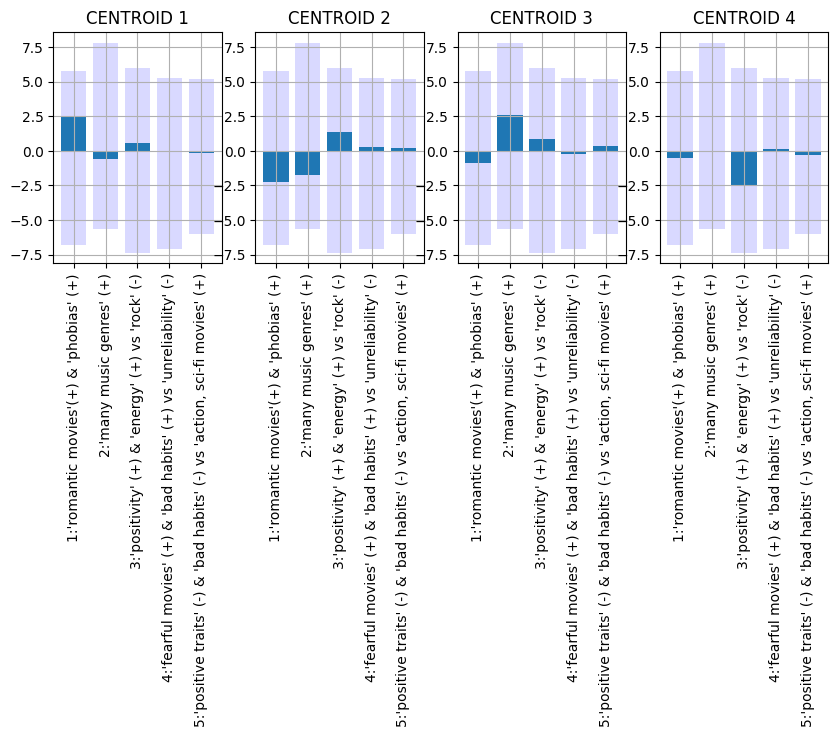

In [104]:
kmean_std, y_pred_std = centroid_plot(Y_Xstd_df_m, pcs_names_Xstd_df, algorithm='lloyd', init='random', max_iter=100, n_clusters=4, n_init='auto', tol=1e-4)

###### 4.1.1.4) Score graph vs Centroid
The three-dimensional score graph visualises the distribution of data with respect to the centroids of different clusters. The coloured dots represent the projected data in the space of the first three principal components (PC1, PC2, PC3). Each colour corresponds to a different cluster. The red ‘x ’s indicate the position of the centroids of each cluster in the same space. The graph makes it possible to visualise how the data clusters around the centroids in the three-dimensional space defined by the principal components, providing a visual representation of the cluster structure.

The plot suggests some separation between the clusters, although some points are close to the boundaries, indicating a potential overlap.

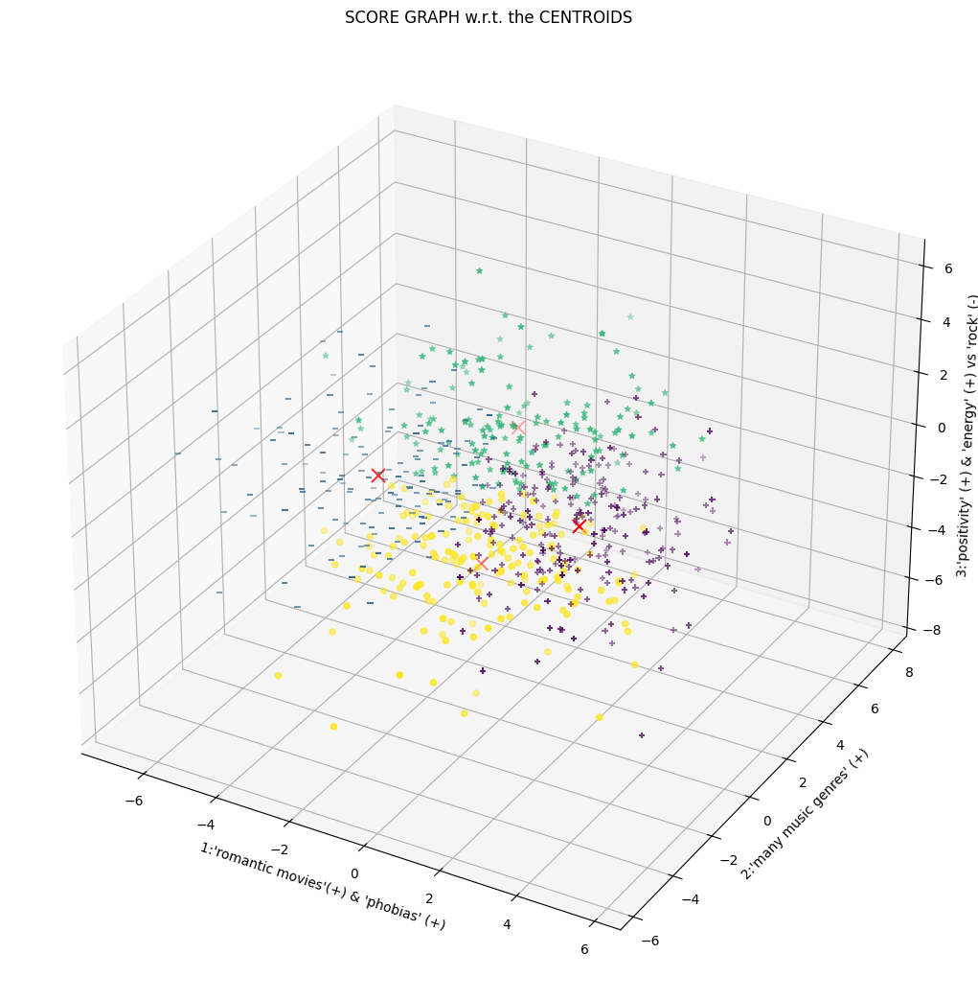

In [105]:
centroid_score(Y_Xstd_df_m, kmean_std, pcs_names_Xstd_df)

###### 4.1.1.5) Centroid w.r.t. the original features
The following analysis is conducted to assess the contribution of the original features to the centroids of the clusters, with the aim of attributing interpretative meaning to them. When applying the centroid_original_features function to the datasets scaled with Min-Max, the statistics are normalised by dividing by the overall mean. This prevents a characteristic with inherently higher values from exerting a disproportionate influence on the contribution, ensuring a fairer evaluation.

Following several preliminary visualisations and analyses, it was decided to graphically represent only the 20 characteristics with the largest contribution. This choice, dictated by the need for clarity and readability of the plot, does not compromise the identification of the most relevant characteristics and the subsequent interpretation of the clusters. The threshold value for the selection of the 20 characteristics was determined heuristically.


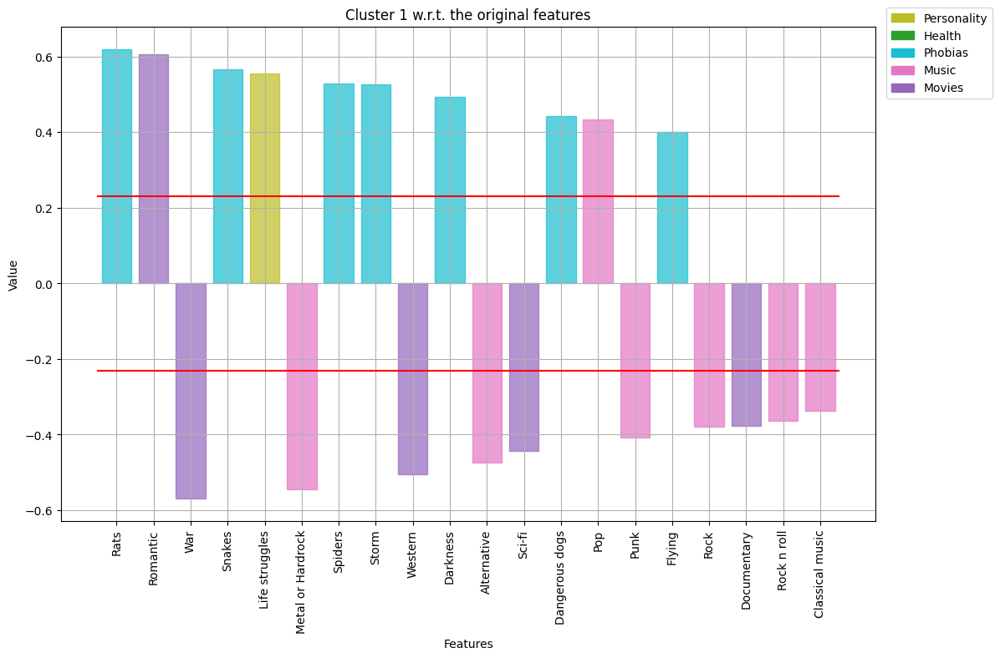

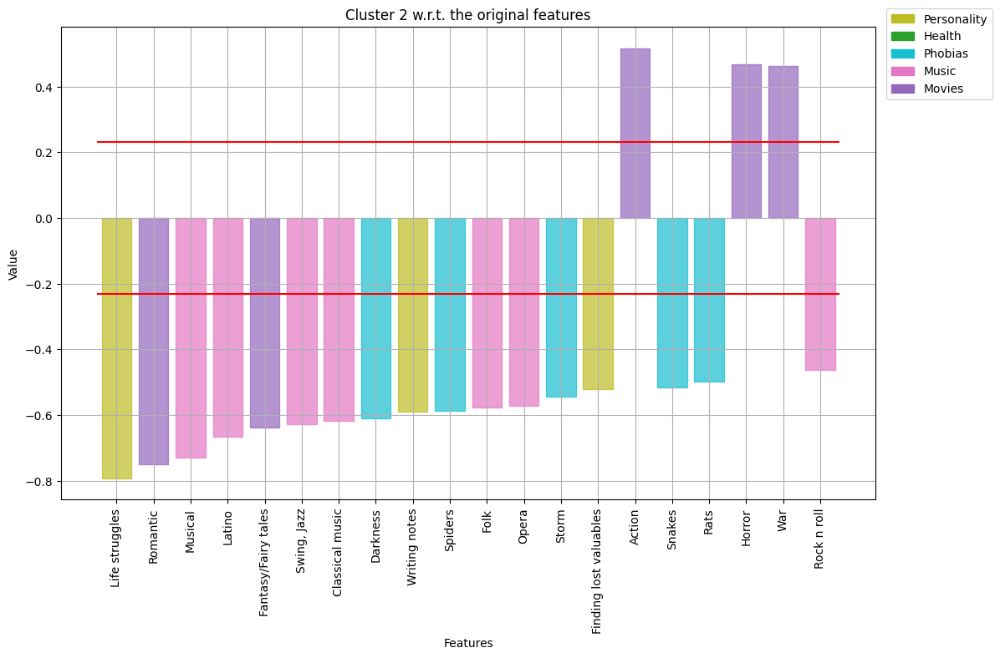

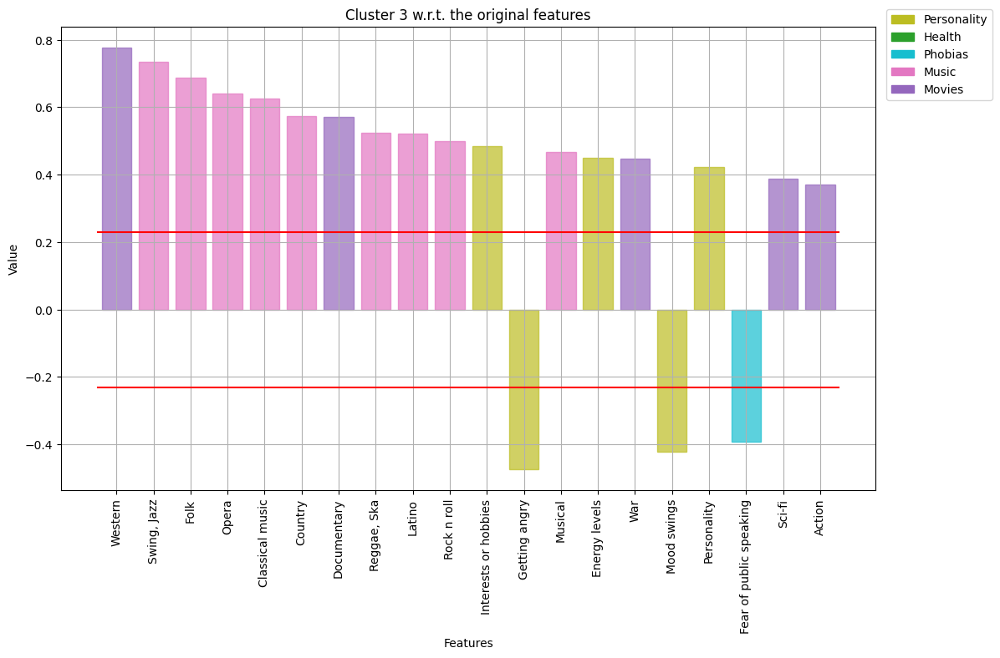

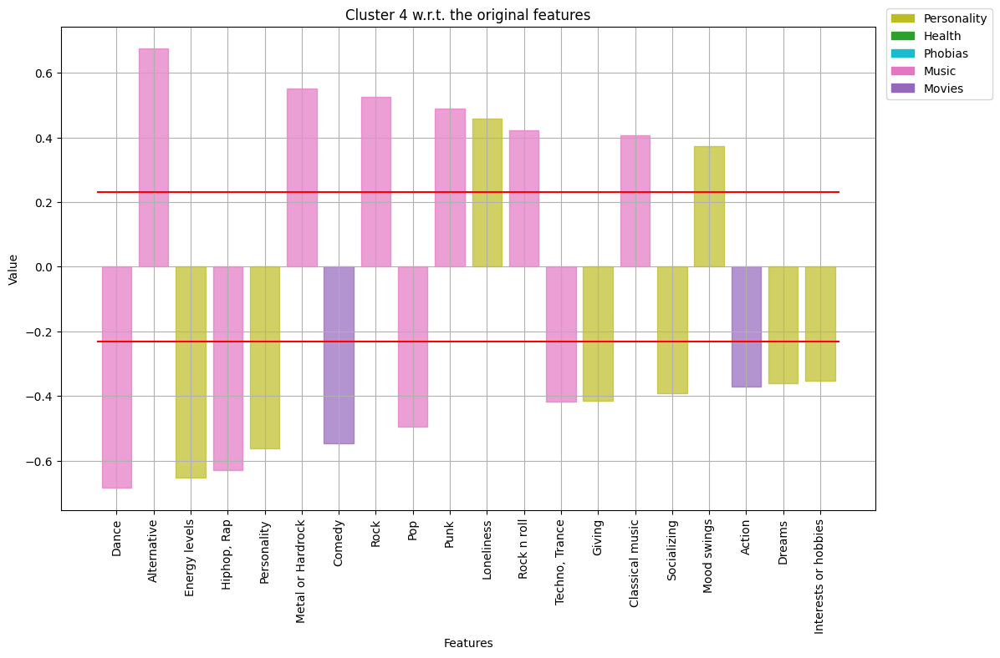

In [106]:
centroid_original_features(X_df, Xstd_df, "std", pca_Xstd_df, filtered_variables_by_type, kmean_std)

###### 4.1.1.6) Centroids' names

In [107]:
cluster_std_names = ["Phobias & Anti-Violence",
                     "Horror-Action-Film Watchers, Fearless",
                     "Music & Film Enthusiasts",
                     "Alternative Solitaries"]

##### 4.1.2) Xmm_df

###### 4.1.2.1) Hyperparameter tuning

In [108]:
silhouette_list = grid_kmeans(Y_Xmm_df_m, 'Y_Xmm_df_m')

In [109]:
max_value_mm = max(silhouette_list.values())
max_key = max(silhouette_list, key=silhouette_list.get)

print(f"The max value of the silhouette is {max_value_mm} with the configuration {max_key}")

The max value of the silhouette is 0.18104787908759748 with the configuration {'algorithm': 'lloyd', 'init': 'random', 'max_iter': 100, 'n_clusters': 3, 'n_init': 20, 'tol': 0.0001}


###### 4.1.2.2) Plot as k varies
This graph shows the trend of the Silhouette Score as the number of clusters *k* changes (from 3 to 10) for the `Y_Xmm_df_m` dataset. A peak in the score is observed for *k*=3, suggesting that three clusters might be a good choice. However, as in the previous graph, the scores remain relatively low (≈0.18 at peak), indicating a sub-optimal separation between clusters. After *k*=3, the score progressively decreases, suggesting that increasing the number of clusters does not improve the quality of the clustering. Again, the low quality of clustering suggests possible overlapping.

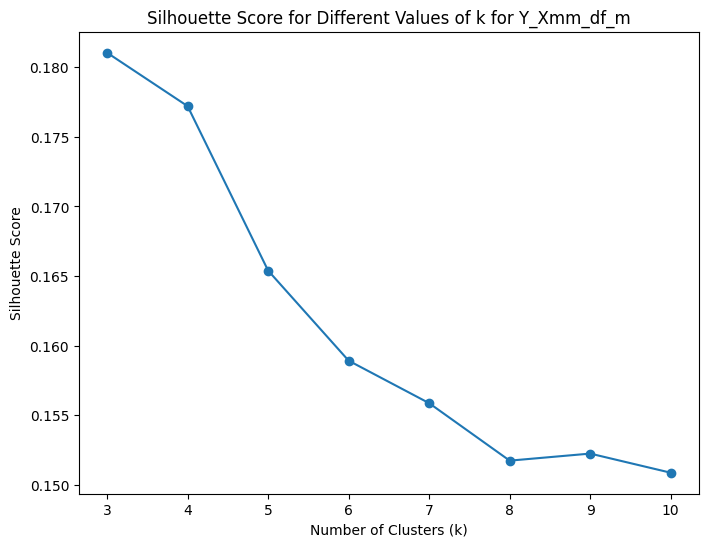

In [110]:
plot_best_config(Y_Xmm_df_m, 'Y_Xmm_df_m', 'lloyd', 'random', 100, 20, 1e-04)

###### 4.1.2.3) Plot to visualize the centroids
- PC1 (‘metal, hardrock (-) vs “phobias” (+)’): Distinguishes between those who prefer metal/hard rock (negative values) and those who have more phobias (positive values). It has little influence in Centroid 2.
- PC2 (‘many music genres (+)’): Represents the variety of musical tastes. It has a positive weight in all centroids, but is particularly pronounced in Centroid 2, suggesting that this cluster appreciates a wide range of genres.
- PC3 (‘rock (-) vs. “energy” (+) & “extrovert” (+)’): Opposes rock preference to energy and extroversion. Centroid 1 shows a slight preference for rock (negative value), while Centroid 3 is characterised by energy and extroversion (positive value).
- PC4 (‘fearful movies (+) & “bad habits” (+) vs. “honest” (-)’): Links fearful movies and bad habits to the opposite of honesty. It has limited weight in all centroids.
- PC5 (‘positive traits (+) & “bad habits” (+) vs “action, sci-fi movies” (-)’): Associates positive traits and bad habits with the opposite of action and sci-fi movies. This CP also has limited influence.

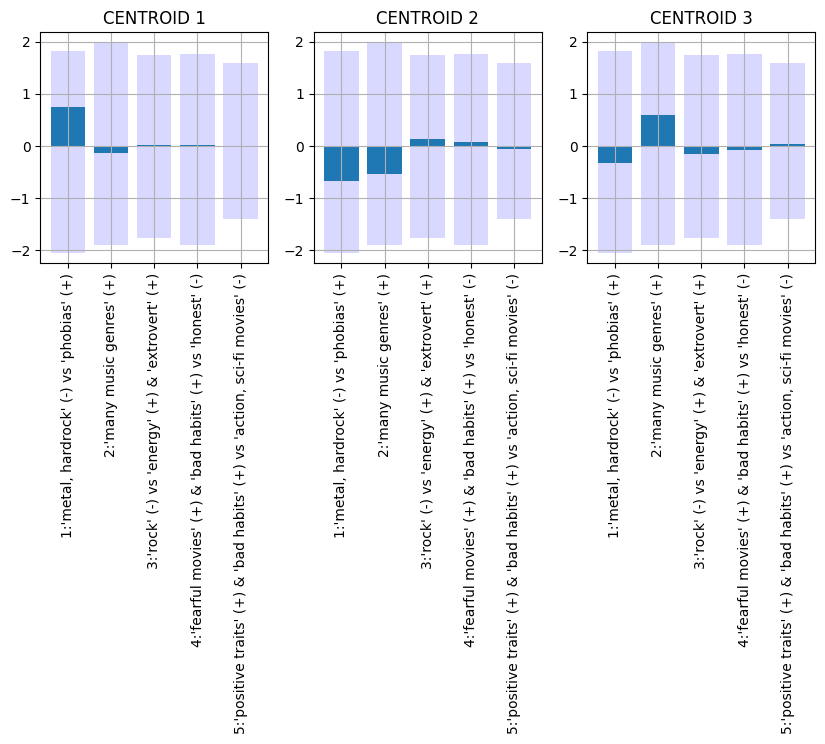

In [111]:
kmean_mm, y_pred_mm = centroid_plot(Y_Xmm_df_m, pcs_names_Xmm_df, algorithm='lloyd', init='random', max_iter=100, n_clusters=3, n_init=20, tol=1e-04)

###### 4.1.2.4) Score graph vs Centroids
Three distinct clusters are observed, although with some overlap, especially between the yellow and purple clusters. The centroids (red crosses) are positioned in the centre of each cluster, indicating their influence. The separation between the green cluster and the other two appears sharper. This suggests that the first three principal components capture a clustering structure, but with some ambiguity in the definition of boundaries between some clusters.

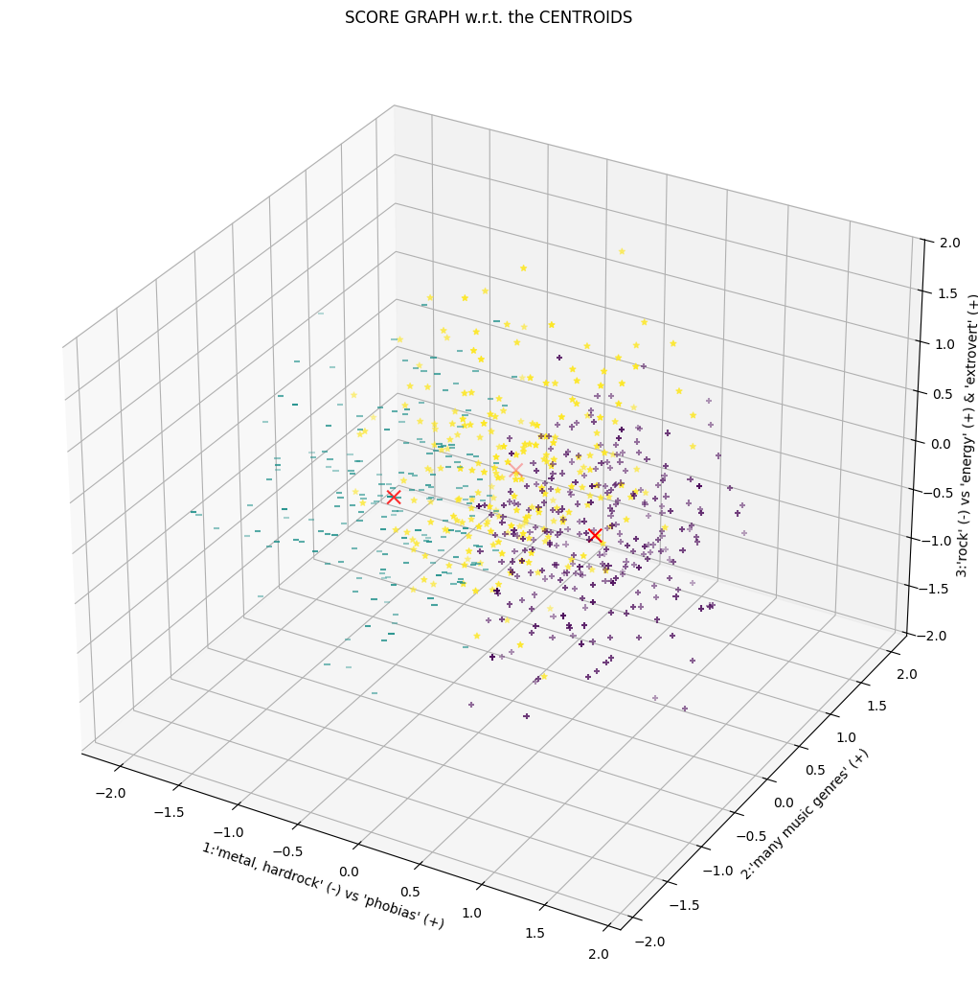

In [112]:
centroid_score(Y_Xmm_df_m, kmean_mm, pcs_names_Xmm_df)

###### 4.1.2.5) Centroids w.r.t. the original features

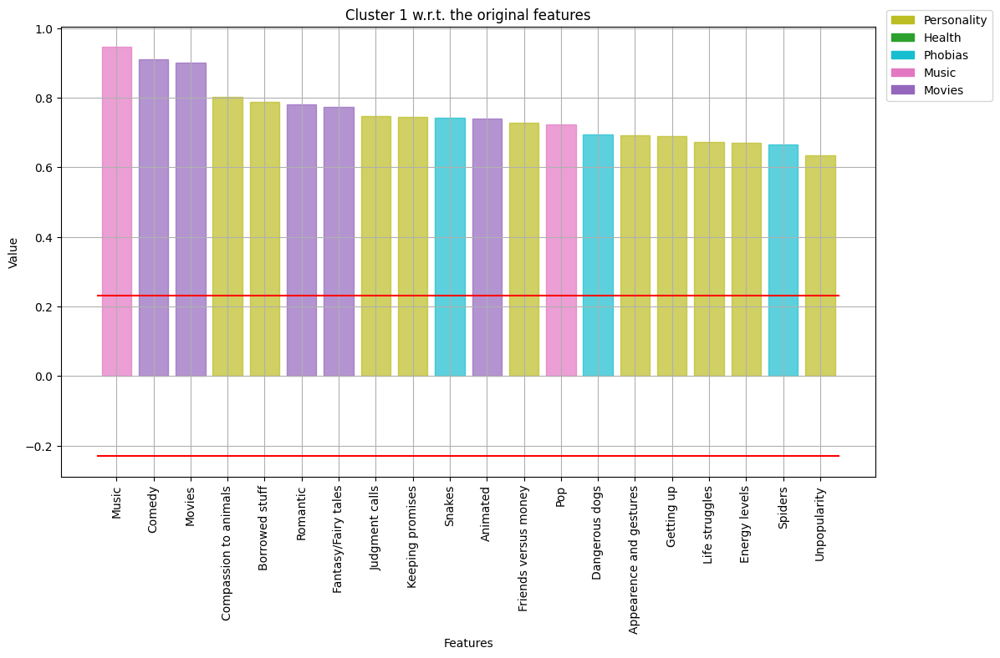

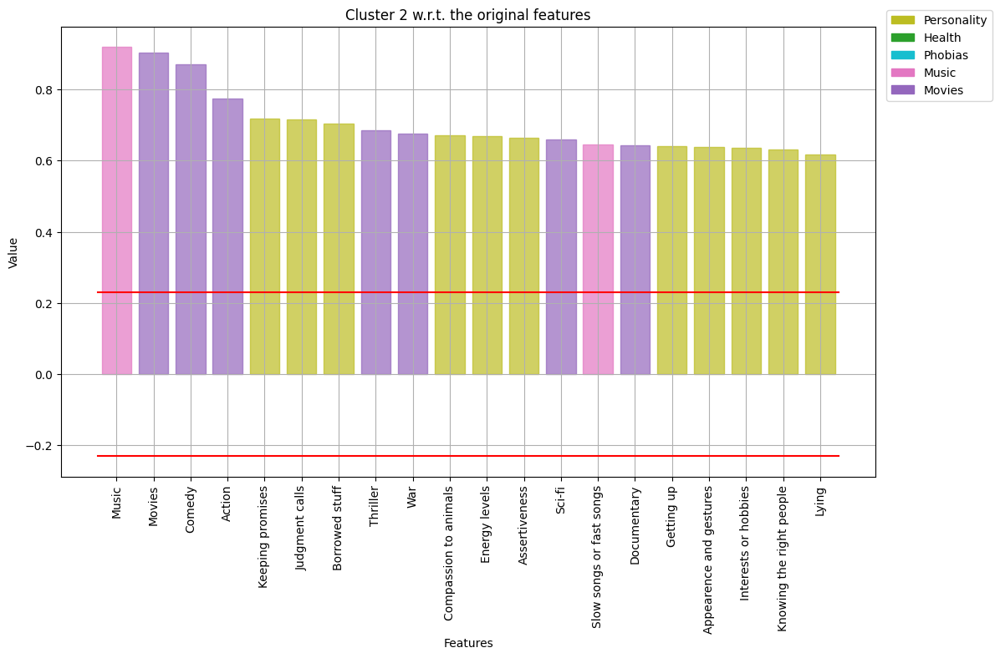

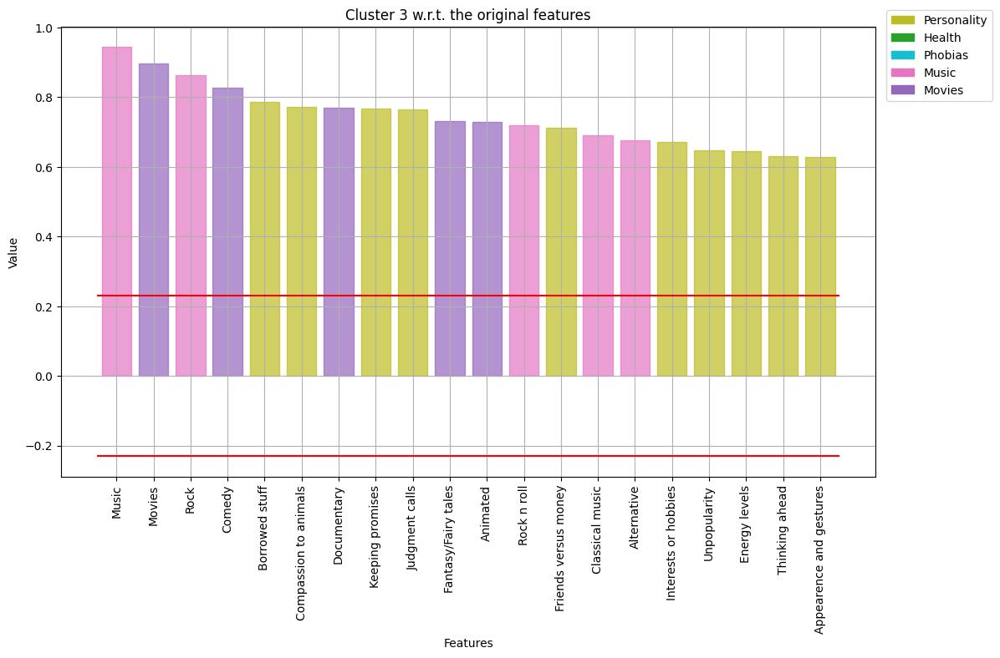

In [113]:
centroid_original_features(X_df, Xmm_df, "mm", pca_Xmm_df, filtered_variables_by_type, kmean_mm)

###### 4.1.2.6) Centroids' names

In [114]:
cluster_mm_names = ["Movie Lovers & Wimps",
                    "Music and Movie Lovers",
                    "Empathetic, Reliable, Music and Film Lovers"]

#### 4.2) Dropped Dataset

##### 4.2.1) Xstd_df_drop

###### 4.2.1.1) Hyperparameter tuning

In [115]:
silhouette_list = grid_kmeans(Y_Xstd_df_drop_m, 'Y_Xstd_df_drop_m') 

In [116]:
max_value_std_drop = max(silhouette_list.values())
max_key = max(silhouette_list, key=silhouette_list.get)

print(f"The max value of the silhouette is {max_value_std_drop} with the configuration {max_key}")

The max value of the silhouette is 0.17926198178150474 with the configuration {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 100, 'n_clusters': 4, 'n_init': 5, 'tol': 0.0001}


###### 4.2.1.2) Plot as k varies
The graph shows the trend of the Silhouette Score as the number of clusters *k* changes (from 3 to 10) for the `Y_Xstd_df_drop_m` dataset. A peak is observed at *k*=4, suggesting that four clusters might be a relatively good choice. However, the silhouette scores are low overall (the peak is below 0.18), indicating poor separation between clusters and potential overlap. After *k*=4, the score decreases, suggesting that increasing the number of clusters does not improve clustering. 

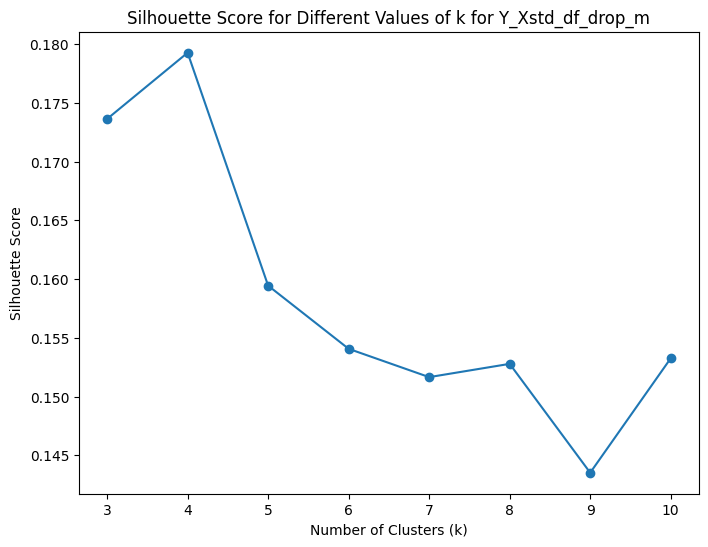

In [117]:
plot_best_config(Y_Xstd_df_drop_m, 'Y_Xstd_df_drop_m', 'lloyd', 'k-means++', 100, 5, 1e-04)

###### 4.2.1.3) Plot to visualize the centroids
- PC1 (‘life struggles (+) & “phobias” (+)’): Represents a combination of life struggles and phobias. It is particularly high in Centroid 1, suggesting that this cluster is characterised by individuals reporting more life struggles and phobias.
- PC2 (‘many music genres (+)’): Indicates an appreciation for many music genres. It has a positive contribution in all centroids, but is more pronounced in Centroid 2, highlighting a greater musical openness in this cluster.
- PC3 (‘loneliness (-) vs “energy” (+) & “hobbies” (+)’): Opposes loneliness to energy and hobbies. Centroid 3 shows a positive value for this PC, suggesting individuals with more energy and hobbies and less prone to loneliness.
- PC4 (‘alcohol (+) vs “honest” (-)’): Correlates alcohol use with less honesty. It has a relatively low weight in all centroids.
- PC5 (‘positive traits (-) & “bad habits” (-) vs “sci-fi movies” (+)’): Links preference for sci-fi movies to the absence of positive traits and bad habits. This CP also has limited influence.

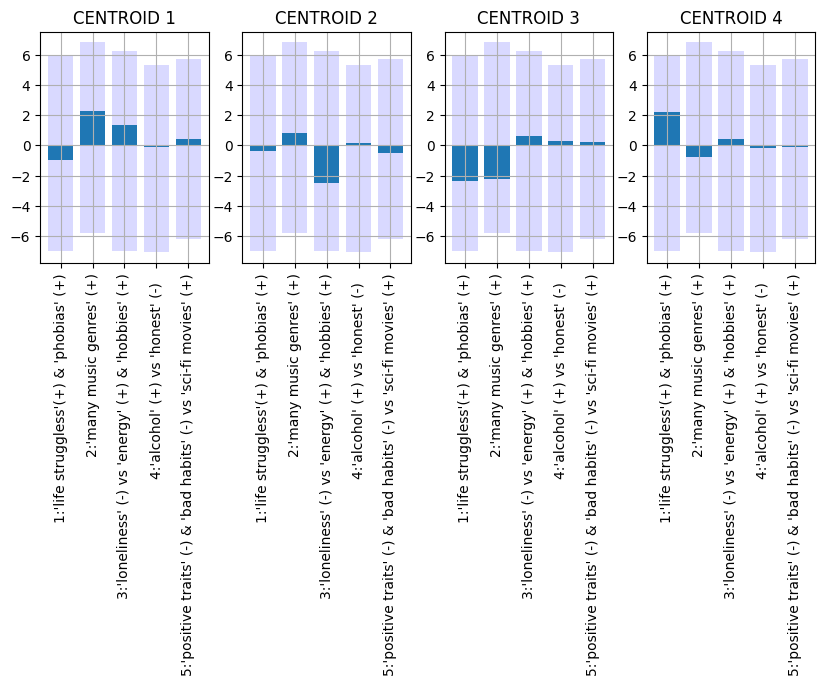

In [118]:
kmean_std_drop, y_pred_std_drop = centroid_plot(Y_Xstd_df_drop_m, pcs_names_Xstd_df_drop, algorithm='lloyd', init='k-means++', max_iter=100, n_clusters=4, n_init=5, tol=1e-04)

###### 4.2.1.4) Score graph vs Centroid
A discrete separation is observed between some clusters, in particular the green cluster from the others. However, there is also an overlap between the yellow cluster and the purple clusters, suggesting a potential ambiguity in the allocation of some points.

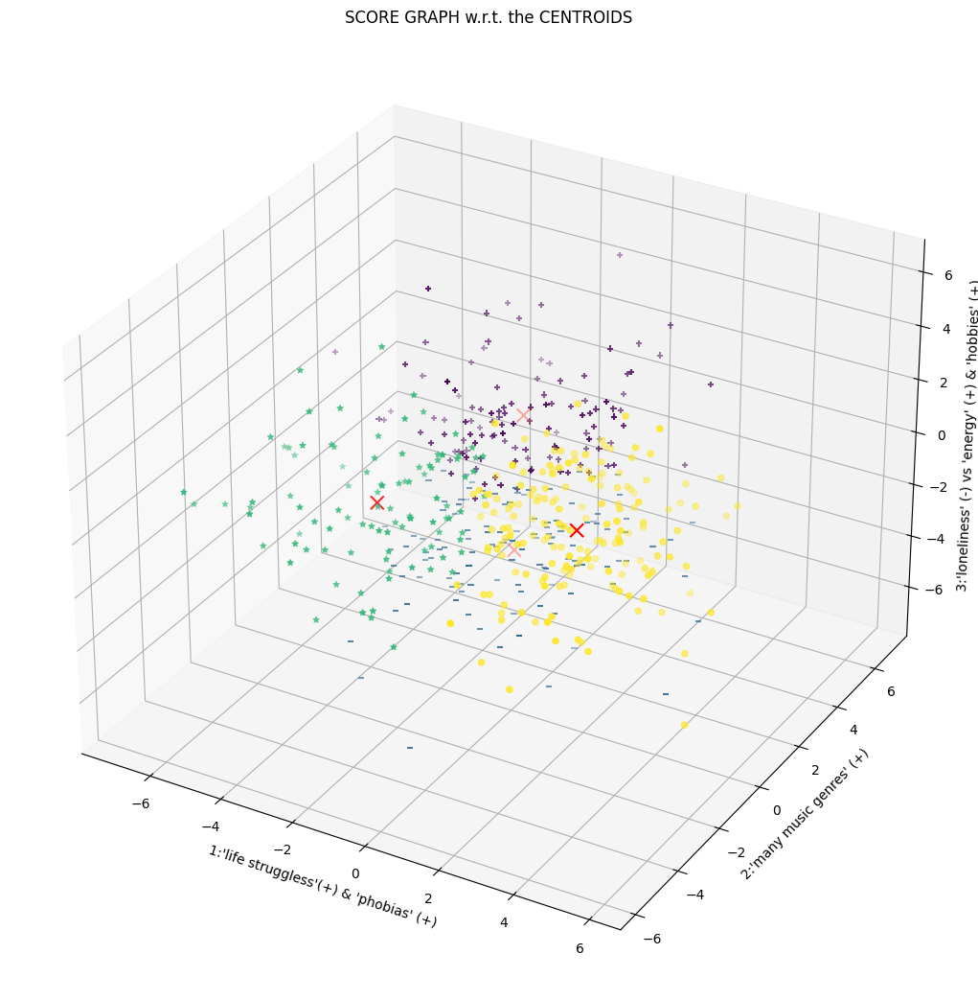

In [119]:
centroid_score(Y_Xstd_df_drop_m, kmean_std_drop, pcs_names_Xstd_df_drop)

###### 4.2.1.5) Centroid w.r.t. the original features

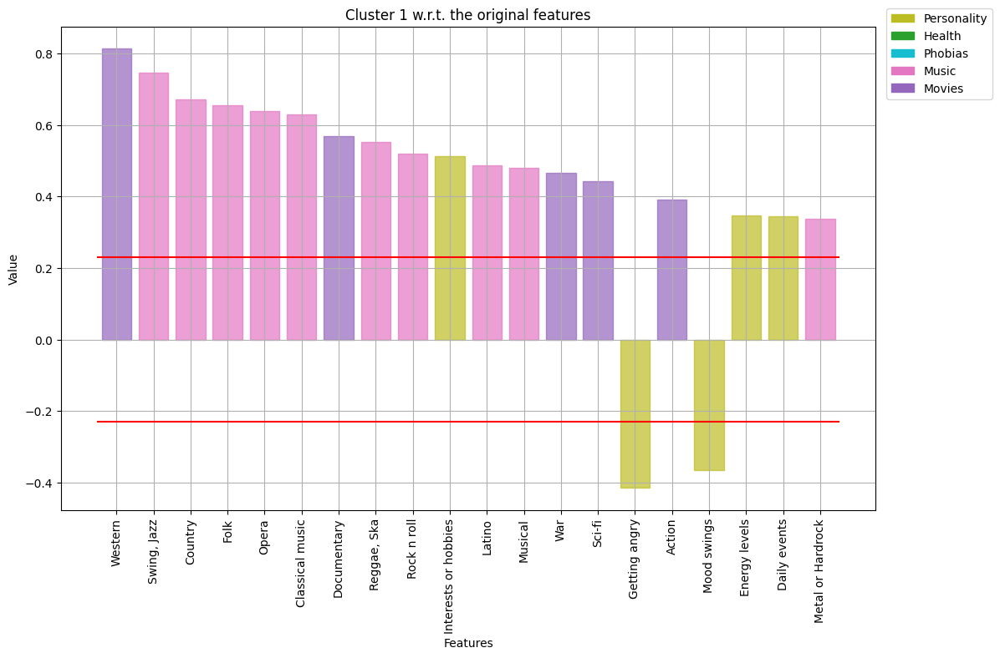

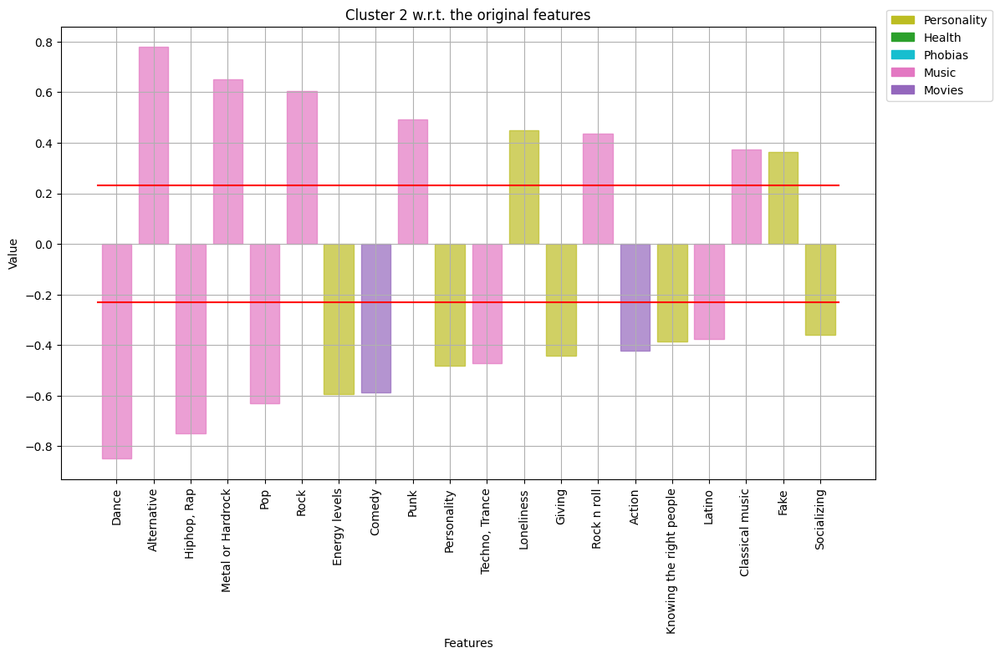

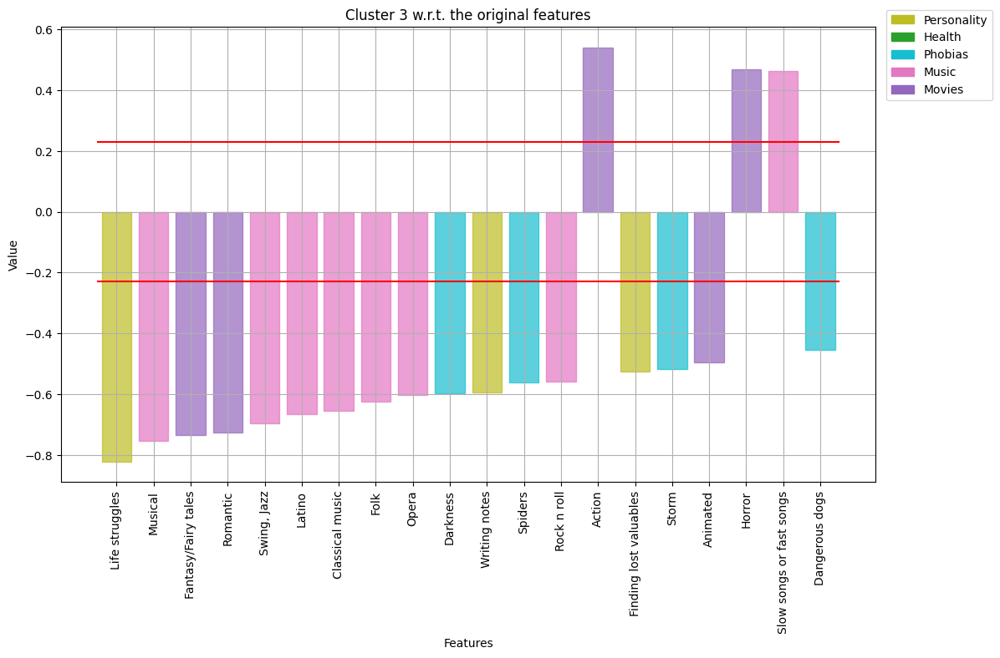

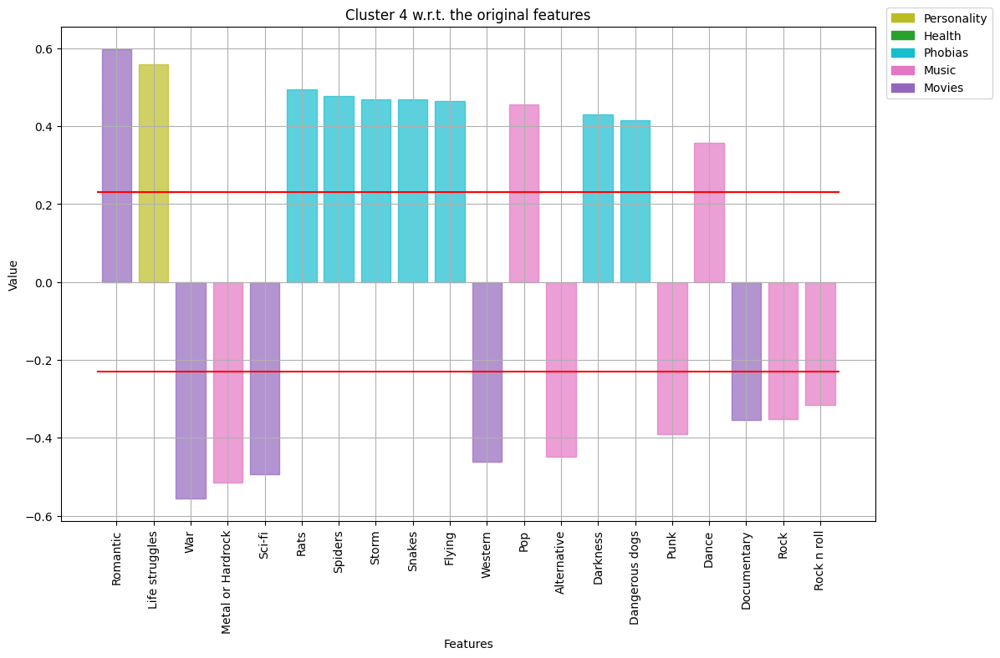

In [120]:
centroid_original_features(X_df, Xstd_df_drop, "std", pca_Xstd_df_drop, filtered_variables_by_type, kmean_std_drop)

###### 4.2.1.6) Centroids' names

In [121]:
cluster_std_drop_names = ["Music & Film Enthusiasts",
                          "Lonely Rock lovers",
                          "Action lovers",
                          "Romantic & Wimps"]

##### 4.2.2) Xmm_df_drop

###### 4.2.2.1) Hyperparameter tuning

In [122]:
silhouette_list = grid_kmeans(Y_Xmm_df_drop_m, 'Y_Xmm_df_drop_m')

In [123]:
max_value_mm_drop = max(silhouette_list.values())
max_key = max(silhouette_list, key=silhouette_list.get)

print(f"The max value of the silhouette is {max_value_mm_drop} with the configuration {max_key}")

The max value of the silhouette is 0.18267423737154764 with the configuration {'algorithm': 'lloyd', 'init': 'random', 'max_iter': 100, 'n_clusters': 3, 'n_init': 5, 'tol': 0.0001}


###### 4.2.2.2) Plot as k varies
This graph shows the performance of the Silhouette Score as the number of clusters *k* changes (from 3 to 10) for the `Y_Xmm_df_drop_m` dataset. The silhouette score shows a maximum value for *k*=3, suggesting that three clusters represent the optimal split between the values tested. However, the maximum score is around 0.18, a relatively low value indicating an unclear separation between clusters and possible overlap. As *k* increases beyond 3, the score decreases, indicating a deterioration in clustering quality.

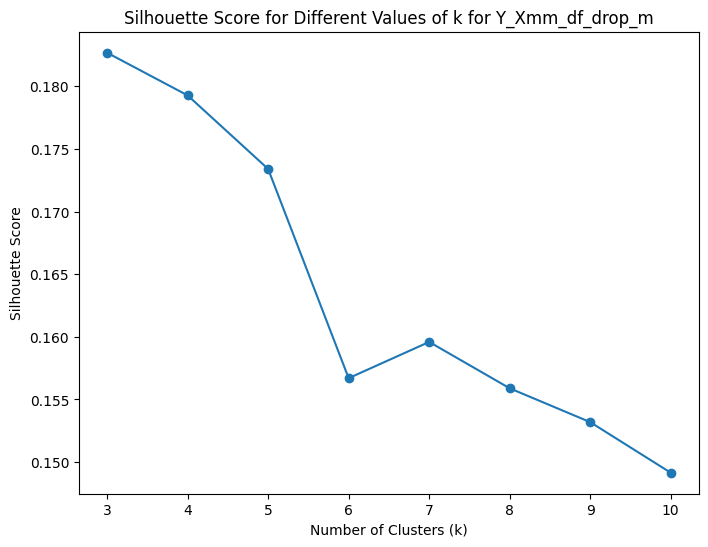

In [124]:
plot_best_config(Y_Xmm_df_drop_m, 'Y_Xmm_df_drop_m', 'lloyd', 'random', 100, 5, 1e-04)

###### 4.2.2.3) Plot to visualize the centroids
- PC1 (‘life struggles (+) & “phobias” (+)’): Associates life struggles and phobias. It has a positive weight in Centroid 1, suggesting that this cluster is characterised by individuals reporting more difficulties and phobias. It is less present in the other centroids.
- PC2 (‘many music genres (+)’): Indicates an appreciation for different genres of music. It has a positive weight in all the centroids, but is less marked than in the other PCs.
- PC3 (‘energy (+) & “hobbies” (+)’): Associates energy and hobbies. It has a positive weight in Centroid 3, suggesting individuals with more energy and dedicated to hobbies. It is negative in Centroid 1, indicating a lower presence of these characteristics.
- PC4 (‘phobias (+) & “bad habits” (+)’): Correlates phobias and bad habits. It has limited weight in all centroids.
- PC5 (‘interests or hobbies’ (+) vs ‘thrillers, horror’ (-) & ‘introversion’ (-)"): Opposes interests/hobbies to thriller/horror and introversion. It has limited weight.

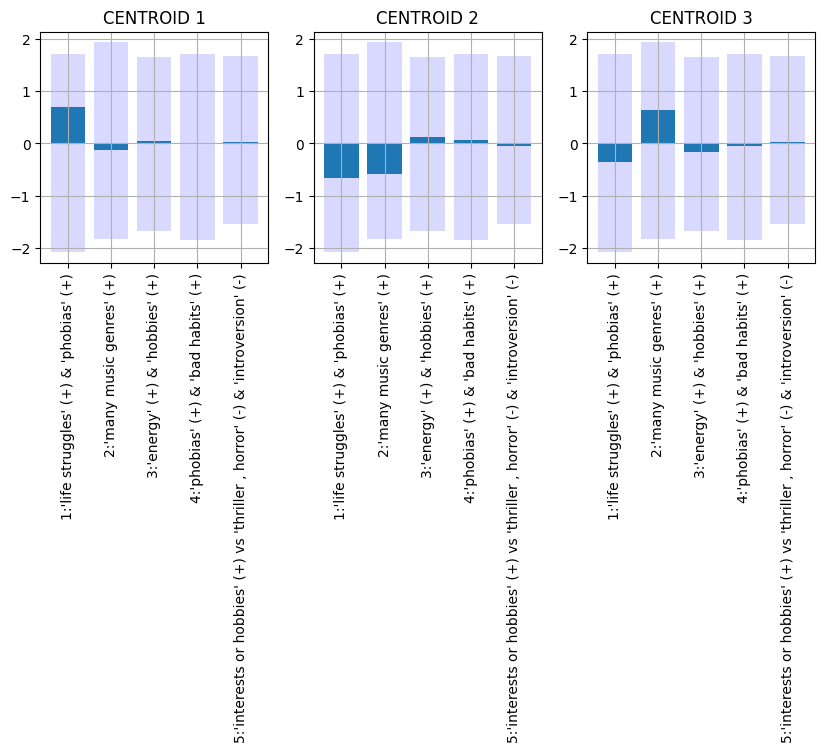

In [125]:
kmean_mm_drop, y_pred_mm_drop = centroid_plot(Y_Xmm_df_drop_m, pcs_names_Xmm_df_drop, algorithm='lloyd', init='random', max_iter=100, n_clusters=3, n_init=5, tol=1e-4)

###### 4.2.2.4) Score graph vs Centroids
Three clusters are observed with some overlap, particularly between the yellow and the purple cluster. The green cluster appears more distinct. The overlap suggests that some data may belong to more than one cluster or that the clusters are not well separated from the first three principal components.

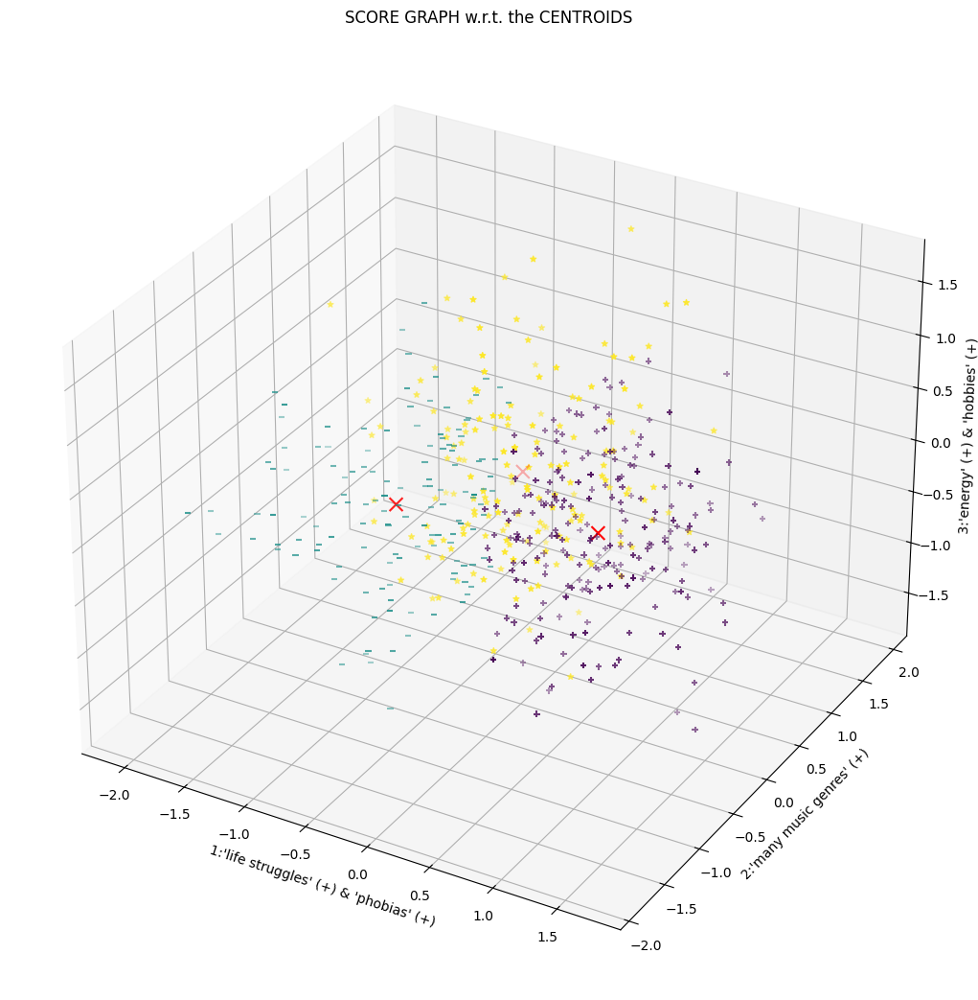

In [126]:
centroid_score(Y_Xmm_df_drop_m, kmean_mm_drop, pcs_names_Xmm_df_drop)

###### 4.2.2.5) Centroids w.r.t. the original features

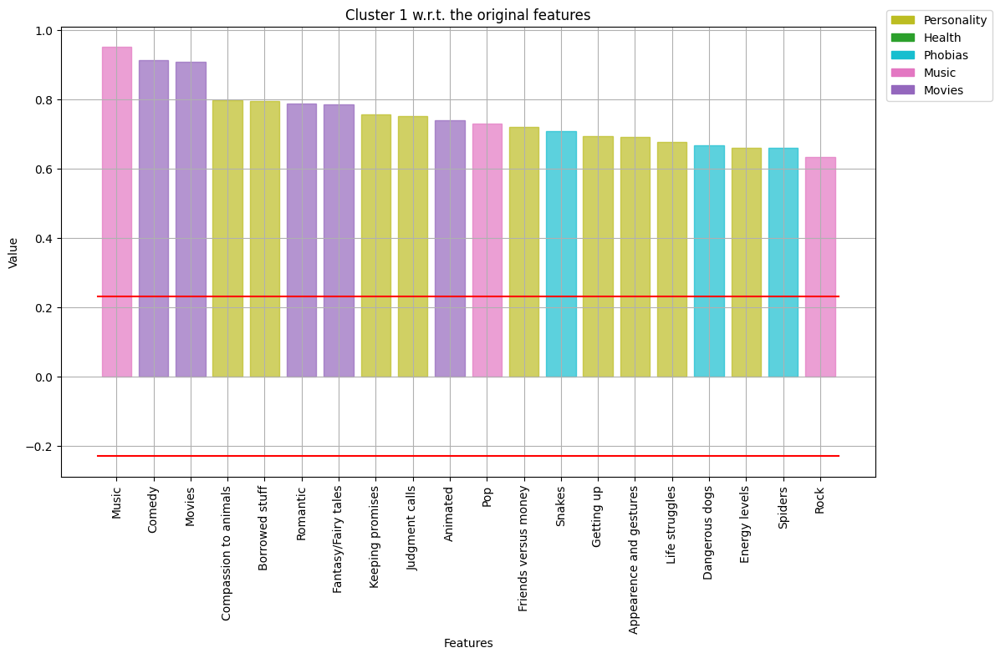

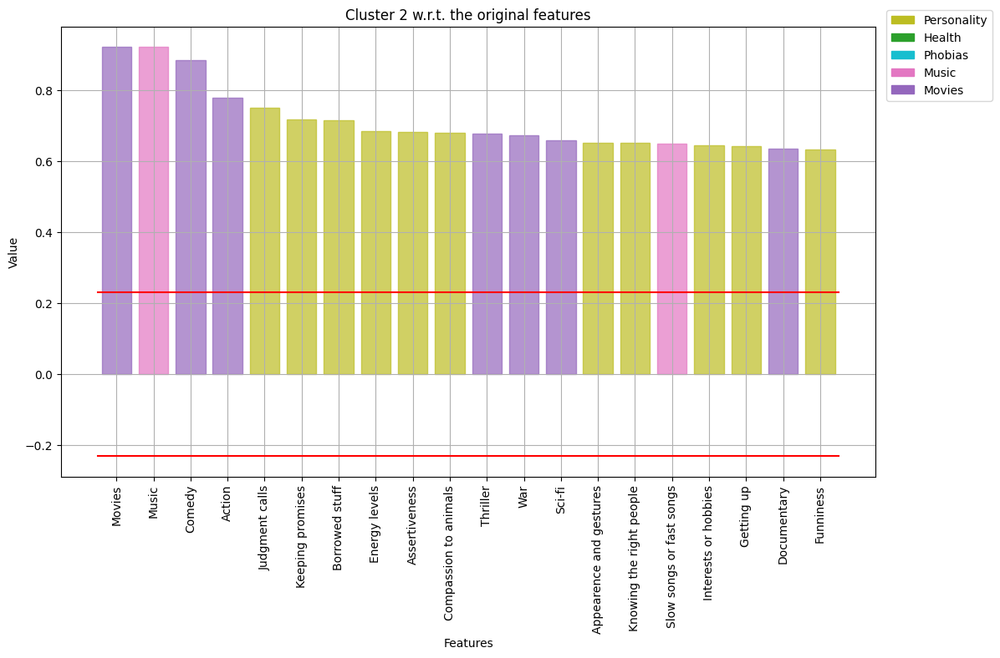

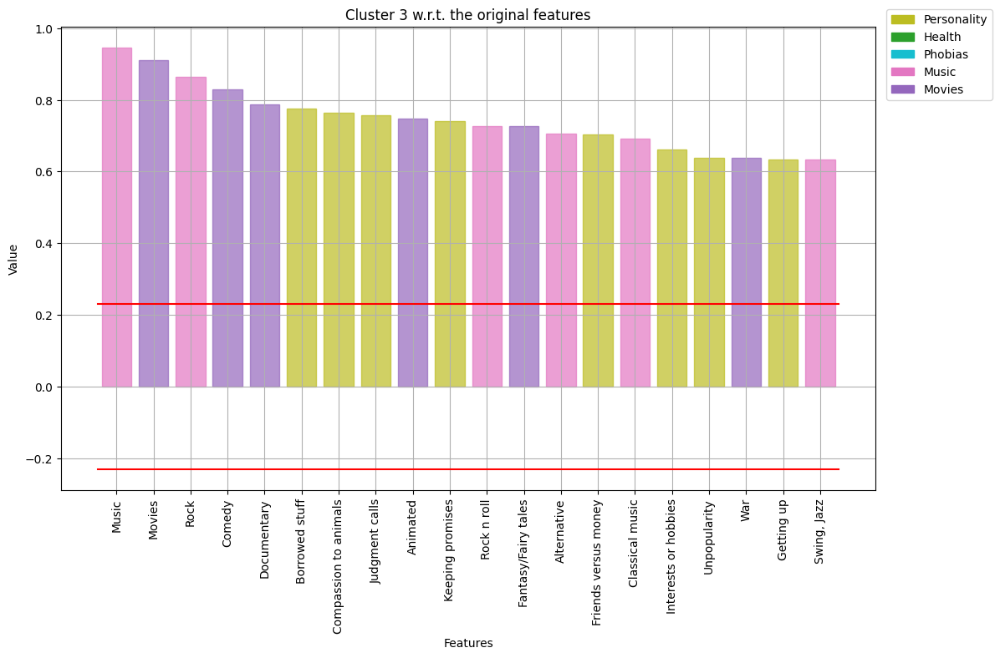

In [127]:
centroid_original_features(X_df, Xmm_df_drop, "mm", pca_Xmm_df_drop, filtered_variables_by_type, kmean_mm_drop)

###### 4.2.2.6) Centroids' names

In [128]:
cluster_mm_drop_names = ["Movie Lovers & Wimps",
                         "Music and Movie Lovers",
                         "Empathetic, Reliable, Music and Film Lovers"]

#### Observations:
What we notice is that we always the 'lloyd' algorithm , which is the default one.
Both in the 'filled' and 'dropped' dataframes, the standardized dataframes get the best silhouette score with k = 4 clusters, while for the min-max scaled dataframes the best score is reached with k = 3. The names that we chose for the centroids were obviously given by looking at the values higher or lower than the 'eps' tolerance in the plots of the contibutions of the features on the centroids. There are some differences when comparing the 'filled' and 'dropped' datasets, suggesting that the rows that we kept in the full one bring some ulterior information, so that the centroids have different contributions on them.

## Exercise 5. Cluster Evaluations

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), perform an **external evaluation** of the clustering obtained at exercise 4.1 with respect to one or more labels in the list _labels_. **Comment the results, comparing the evaluation with the interpretation you gave at exercise 4.3**. 
2. For each one of the two datasets (_std_ and _mm_), perform an **internal evaluation** of each cluster, with respect to the silohuette score. **Comment the results**. 

#### Functions

The task was performed using the the **silhouette score** for each cluster, which evaluates how good the clustering is by measuring the cohesion within each cluster and the separation between clusters. It ranges between 1 (well-separated clusters) and -1 (poor clustering).
We computed the silhouette scores for each cluster, by computing the mean value of silhouette score of the points in them. The global (maximum) score has already been computed in exercise 4.

In [129]:
# Computes the silhouette scores for the clusters
def internal_eval(data, kmean, max_sil, cluster_name):
    silscores = silhouette_samples(data, kmean.labels_)
    cluster_silscores = [np.mean(silscores[kmean.labels_ == k]) for k in range(kmean.n_clusters)]
    display(pd.DataFrame(np.array(cluster_silscores + [max_sil]), index=cluster_name + ['Global'], columns=['Silohuette Score']))

To assess this task, we first used 5 different metrics:

1. **Adjusted Rand Index (ARI)** (-1,1): it compares the clusters with the true labels. If 1, it means the clustering is identical to the true labels, while  and negative values indicate worse-than-random clustering.

2. **Normalized Mutual Information (NMI)** (0,1): it measures the amount of shared information between the clustering result and the true labels. A value of 1 indicates identical partitions, and 0 indicates no shared information.
   
3. **Homogeneity** (0,1): it measures how uniformly the predicted labels are within each cluster. So if it is low, that means that the clusters contain memebrs of different labels.

4. **Completeness**(0,1): it measures how well all members of the same class are grouped into a cluster.

5. **V-measure**(0,1): it is a mixture of Homogeneity and Completeness.


In [130]:
# Measures the external evaluation metrics
def external_evaluation_metrics(y_pred, data, label):
    y_true = data[label]
    
    ari = adjusted_rand_score(y_true, y_pred)
    nmi = normalized_mutual_info_score(y_true, y_pred)
    homogeneity = homogeneity_score(y_true, y_pred)
    completeness = completeness_score(y_true, y_pred)
    v_measure = v_measure_score(y_true, y_pred)

    print("Metrics")
    print("1. Adjusted Rand Index:", ari)
    print("2. Normalized Mutual Information:", nmi)
    print("3. Homogeneity:", homogeneity)
    print("4. Completeness:", completeness)
    print("5. V-measure:", v_measure)

Later, in the 'external_evaluation_label' function, we also show a visual represntation of how the points in each cluster are divided with respect to each chosen labels. The labels that we choose are:
- 'Gender';
- 'Education';
- 'Age'.

In [131]:
# Shows for each cluster, the division in terms of the labes
def external_evaluation_label(y_pred, data, X, kmeans, cluster_names, label):
    gender_labels = ['Female', 'Male']
    education_labels = [
        'Currently a primary school pupil', 'Primary school', 
        'Secondary school', 'College/bachelor degree', 
        'Masters degree', 'Doctorate degree'
    ]
        
    k = kmeans.n_clusters  # Corrected number of clusters

    mask_cluster = [kmeans.labels_ == i for i in range(k)]

    if label != 'Age':
        cluster = [
            data.loc[mask_cluster[i], label].value_counts().to_dict() 
            for i in range(k)
        ]
    else:
        cluster = set(y_pred)

    # Subplots
    rows = (k + 1) // 2  # 2 plots per row
    fig, axes = plt.subplots(rows, 2, figsize=(15, 5 * rows))
    axes = axes.flatten() 
    
    for i, cluster_data in enumerate(cluster):
        ax = axes[i]  

        if label == 'Gender':
            # Extract values for Female and Male
            female_count = cluster_data.get(1.0, 0)
            male_count = cluster_data.get(2.0, 0)
            values = [female_count, male_count]
            ax.bar(gender_labels, values)

        elif label == 'Education':
            # Extract values for education levels
            values = [
                cluster_data.get(1, 0), cluster_data.get(2, 0), 
                cluster_data.get(3, 0), cluster_data.get(4, 0), 
                cluster_data.get(5, 0), cluster_data.get(6, 0)
            ]
            ax.bar(education_labels, values)
            ax.set_xticks(range(len(education_labels)))  
            ax.set_xticklabels(education_labels, rotation=90)

        elif label == 'Age':
            cluster_age = data[y_pred == cluster_data]
            cluster_ages = cluster_age[label]
            ax.hist(cluster_ages)

        ax.grid(True)
        ax.set_title(f"Cluster {i+1} - {cluster_names[i]}")
        ax.set_xlabel(label)
        ax.set_ylabel("Count")
        if label == 'Education':
            ax.set_xticklabels(education_labels, rotation=90)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

#### 5.1) Filled Dataset

##### 5.1.1) Xstd_df

##### 5.1.1.1) External evaluation

###### Gender - Observations:
This plot shows the gender distribution (Female/Male) within four clusters. 
- Cluster 1 (Phobias & Anti-Violence): It is strongly dominated by female individuals. This suggests a correlation between phobias, aversion to violence and female gender in the dataset.
- Cluster 2 (Horror-Action-Film Watchers, Fearless): Has a higher concentration of male individuals. This indicates a preference for horror and action films and a lower presence of fear (as suggested by the name ‘Fearless’) among men in this cluster.
- Cluster 3 (Music & Film Enthusiasts): Shows a more balanced gender distribution, with a slight male dominance. This suggests that interest in music and film is shared by both genders, although slightly more so among men.
- Cluster 4 (Alternative Solitaries): This cluster is characterised by a clear predominance of female individuals. This cluster therefore seems to represent a group of women with solitary tendencies and alternative tastes.

In [132]:
external_evaluation_metrics(y_pred_std, encoded_fill_df_combined, 'Gender')

Metrics
1. Adjusted Rand Index: 0.16387763076806214
2. Normalized Mutual Information: 0.1602219452496197
3. Homogeneity: 0.24282150598772229
4. Completeness: 0.11955382738196765
5. V-measure: 0.1602219452496197


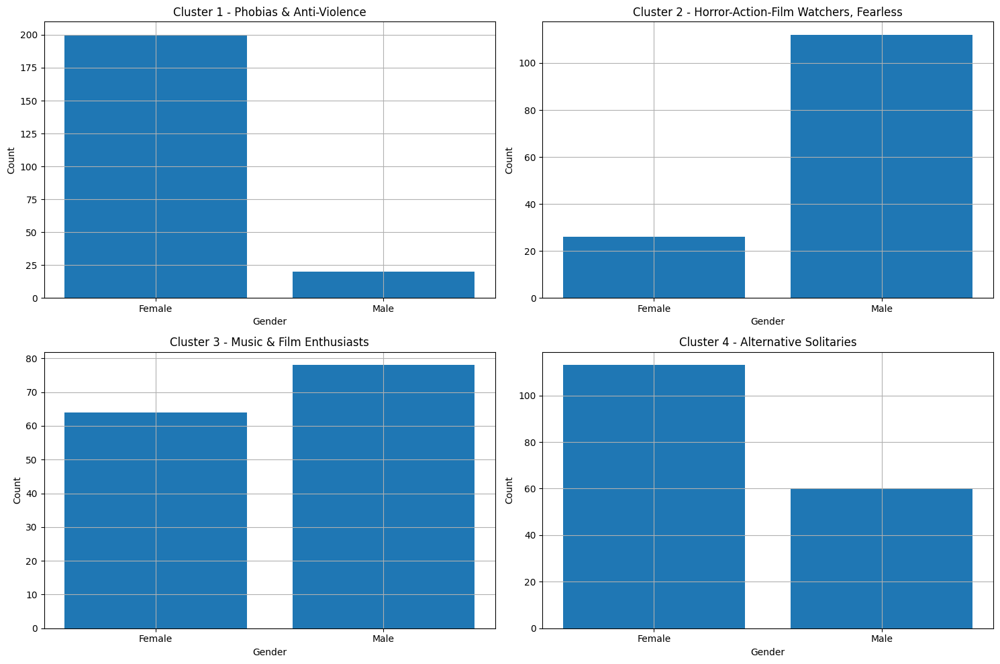

In [133]:
external_evaluation_label(y_pred_std, encoded_fill_df_combined, Y_Xstd_df_m, kmean_std, cluster_std_names, 'Gender')

###### Education - Observations
This plot shows the distribution of education level (‘Education’) within four clusters. 
- Cluster 1 (Phobias & Anti-Violence): The majority of individuals have a secondary level of education (‘Secondary school’), with a significant presence also of people with a Bachelor's/ Master's degree (‘College/bachelor degree’).
- Cluster 2 (Horror-Action-Film Watchers, Fearless): Secondary education also prevails in this cluster, followed by primary school (‘Primary school’) and university degree.
- Cluster 3 (Music & Film Enthusiasts): The distribution is more even, with a slight prevalence of secondary education and a good number of university graduates.
- Cluster 4 (Alternative Solitaries): As in clusters 1 and 2, secondary education is the most represented, followed by university degree.

In [134]:
external_evaluation_metrics(y_pred_std, encoded_fill_df_combined, 'Education')

Metrics
1. Adjusted Rand Index: -0.0014396430124748575
2. Normalized Mutual Information: 0.01631085584611947
3. Homogeneity: 0.018500982234818573
4. Completeness: 0.01458437340088933
5. V-measure: 0.016310855846119472


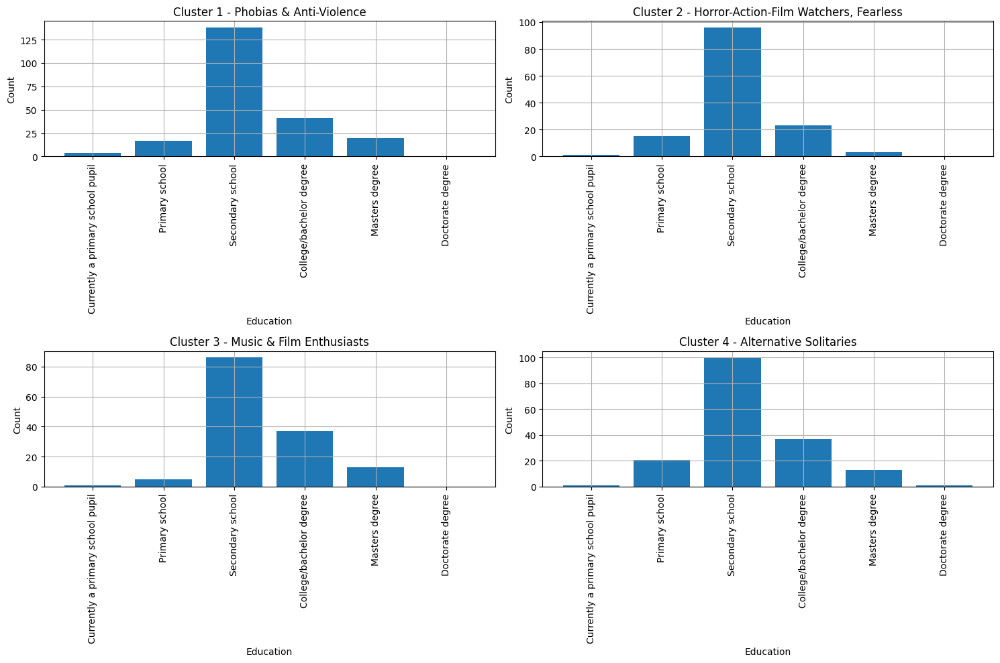

In [135]:
external_evaluation_label(y_pred_std, encoded_fill_df_combined, Y_Xstd_df_m, kmean_std, cluster_std_names, 'Education')

###### Age - Observation
This plot shows the age distribution within four clusters. 
- Cluster 1 (Phobias & Anti-Violence): The age distribution is concentrated between the ages of 18 and 22, with a peak around 20. This suggests that this cluster is mainly composed of young adults.
- Cluster 2 (Horror-Action-Film Watchers, Fearless): A concentration between 18 and 22 years is also observed here, but with a slightly wider distribution and a peak around 19.
- Cluster 3 (Music & Film Enthusiasts): The distribution is more shifted towards slightly higher ages, with a concentration between 20 and 24 and a peak around 21.
- Cluster 4 (Alternative Solitaries): Similar to clusters 1 and 2, most individuals are between 18 and 22 years old, with a peak around 19.

All clusters show a prevalence of young adults, with ages mainly concentrated between 18 and 22. Cluster 3 shows a tendency towards slightly higher ages than the others. Age, therefore, does not seem to be a factor that clearly discriminates the clusters, but rather a characteristic common to all of them.

In [136]:
external_evaluation_metrics(y_pred_std, encoded_fill_df_combined, 'Age')

Metrics
1. Adjusted Rand Index: -0.0018303407526070554
2. Normalized Mutual Information: 0.02313088104355456
3. Homogeneity: 0.018403266881810293
4. Completeness: 0.031127126855988636
5. V-measure: 0.023130881043554565


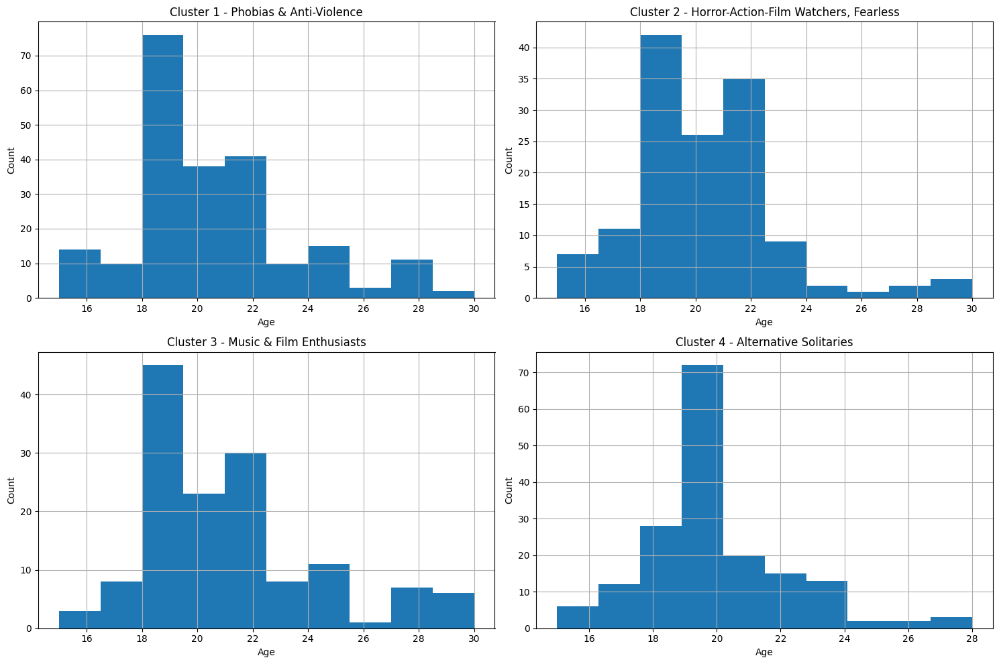

In [137]:
external_evaluation_label(y_pred_std, encoded_fill_df_combined, Y_Xstd_df_m, kmean_std, cluster_std_names, 'Age')

##### 5.1.1.2) Internal evaluation

In [138]:
internal_eval(Y_Xstd_df_m, kmean_std, max_value_std, cluster_std_names)

,Silohuette Score
Phobias & Anti-Violence,0.207687
"Horror-Action-Film Watchers, Fearless",0.172029
Music & Film Enthusiasts,0.171127
Alternative Solitaries,0.144534
Global,0.176428


###### Observations:
Obviously, also the the silhouette scores are very low, suggesting that the clusters are very overlapping (as can be seen from the plots of exercise 4).

##### 5.1.2) Xmm_df

##### 5.1.2.1) External evaluation

###### Gender - Observations
The external evaluation metrics have very low values. This plot shows the gender distribution (Female/Male) within three clusters. 
- Cluster 1 (Movie Lovers & Wimps): It is characterised by a strong prevalence of female gender. This suggests that the women included in this cluster show a greater affinity with the characteristics associated with the cluster, which from the name seem to be related to the love of movies and a certain ‘weakness’ (interpretation of the term ‘Wimps’).
- Cluster 2 (Music and Movie Lovers): Shows a clear predominance of male gender. The men in this cluster thus seem more inclined to combine an interest in music and film.
- Cluster 3 (Empathetic, Reliable, Music and Film Lovers): Shows a more balanced gender distribution than the other two clusters, with a slight predominance of women. This indicates that the characteristics of empathy, reliability and interest in music and film are shared by both genders, although slightly more present among women.

In [139]:
external_evaluation_metrics(y_pred_mm, encoded_fill_df_combined, 'Gender')

Metrics
1. Adjusted Rand Index: 0.21611884573181842
2. Normalized Mutual Information: 0.1959843668530487
3. Homogeneity: 0.256368937776911
4. Completeness: 0.15862272262455251
5. V-measure: 0.1959843668530487


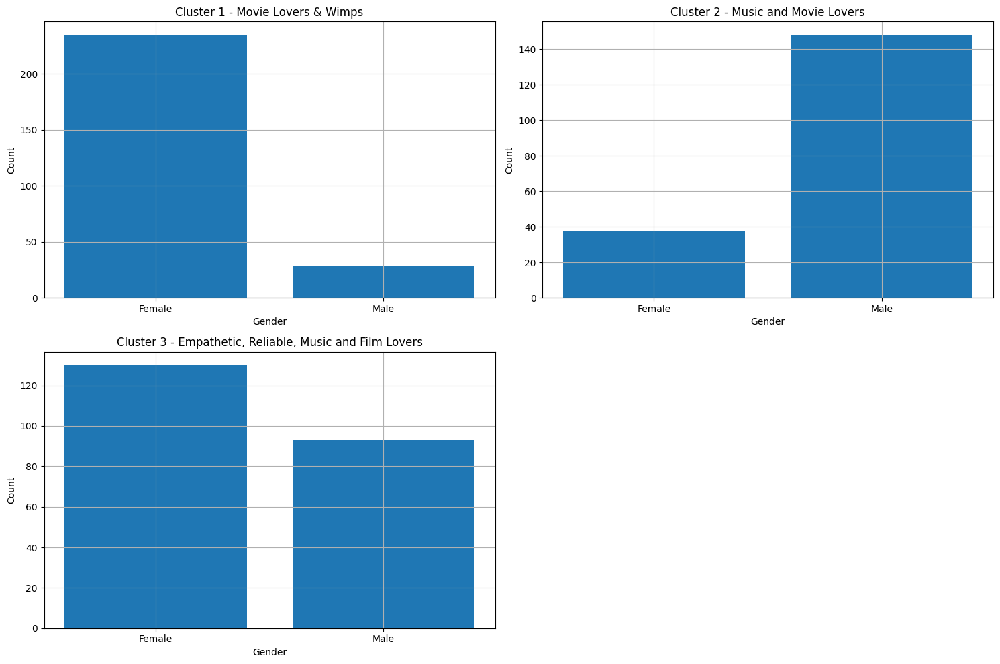

In [140]:
external_evaluation_label(y_pred_mm, encoded_fill_df_combined, Y_Xmm_df_m, kmean_mm, cluster_mm_names, 'Gender')

###### Education - Observations
Similar to the ones in the Xstd_df.

In [141]:
external_evaluation_metrics(y_pred_mm, encoded_fill_df_combined, 'Education')

Metrics
1. Adjusted Rand Index: -0.0032250978360198203
2. Normalized Mutual Information: 0.012517595351484334
3. Homogeneity: 0.0125767197311142
4. Completeness: 0.012459024269637497
5. V-measure: 0.012517595351484334


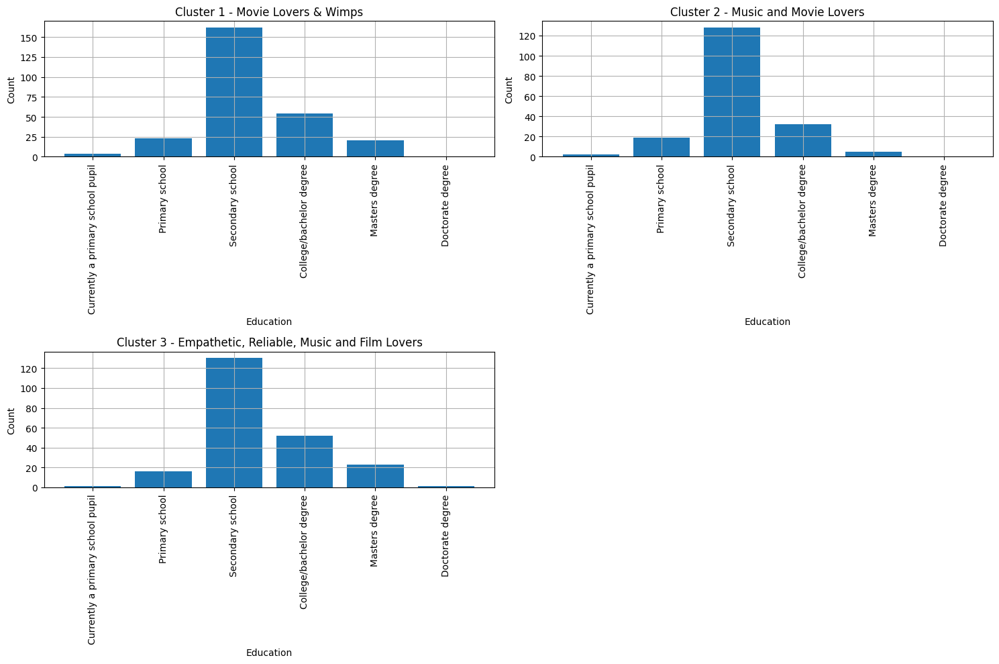

In [142]:
external_evaluation_label(y_pred_mm, encoded_fill_df_combined, Y_Xmm_df_m, kmean_mm, cluster_mm_names, 'Education')

###### Age - Observations
Similar to the ones in the Xstd_df.

In [143]:
external_evaluation_metrics(y_pred_mm, encoded_fill_df_combined, 'Age')

Metrics
1. Adjusted Rand Index: -0.0008599659899046231
2. Normalized Mutual Information: 0.015700759823610813
3. Homogeneity: 0.011543750641623482
4. Completeness: 0.024536618382838472
5. V-measure: 0.01570075982361081


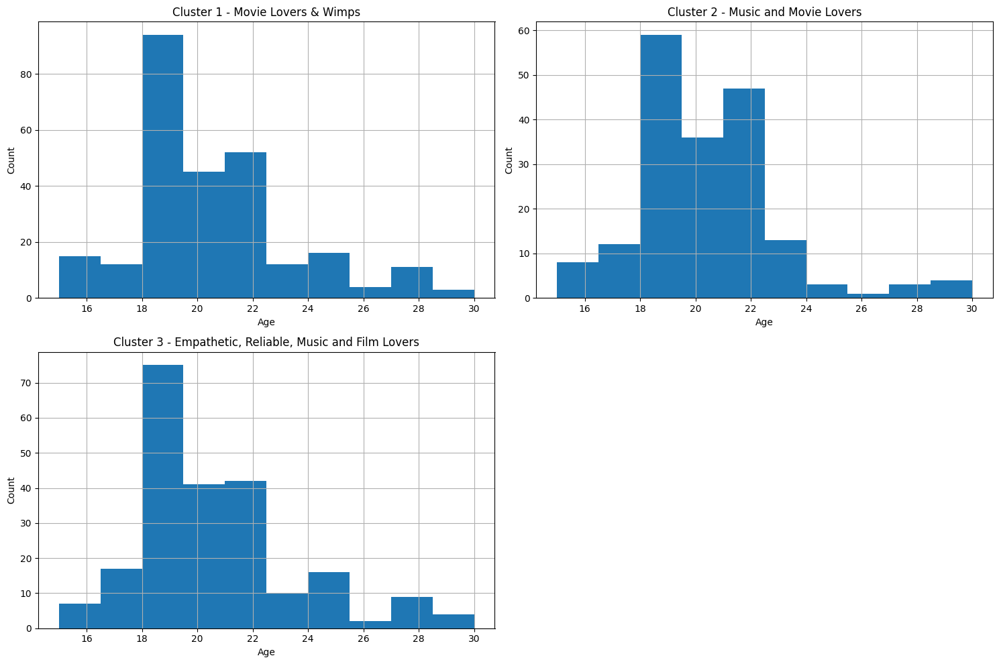

In [144]:
external_evaluation_label(y_pred_mm, encoded_fill_df_combined, Y_Xmm_df_m, kmean_mm, cluster_mm_names, 'Age')

##### 5.1.2.2) Internal evaluation

In [145]:
internal_eval(Y_Xmm_df_m, kmean_mm, max_value_mm, cluster_mm_names)

,Silohuette Score
Movie Lovers & Wimps,0.216185
Music and Movie Lovers,0.159469
"Empathetic, Reliable, Music and Film Lovers",0.157449
Global,0.181048


###### Observations:
The table shows the silhouette scores for evaluating cluster separation. 

- ‘Movie Lovers & Wimps’ (0.216): fair separation.
- ‘Music and Movie Lovers’ (0.159) and ‘Empathetic, Reliable, Music and Film Lovers’ (0.157): greater overlap between them.
- Overall score (0.181): less than optimal overall separation.

In short, ‘Movie Lovers & Wimps’ is the most distinct cluster, but overall the separation is not strong. 

#### 5.2) Dropped Dataset

##### 5.2.1) Xstd_df_drop

###### 5.2.1.1) External evaluation

###### Gender - Observations
Just like in Xstd_df, two clusters show a division between 'Female' and 'male' individuals.

In [146]:
external_evaluation_metrics(y_pred_std_drop, encoded_df_combined.dropna(), 'Gender')

Metrics
1. Adjusted Rand Index: 0.17216561407796432
2. Normalized Mutual Information: 0.15854968741714617
3. Homogeneity: 0.24006493037326557
4. Completeness: 0.11835997000820765
5. V-measure: 0.1585496874171462


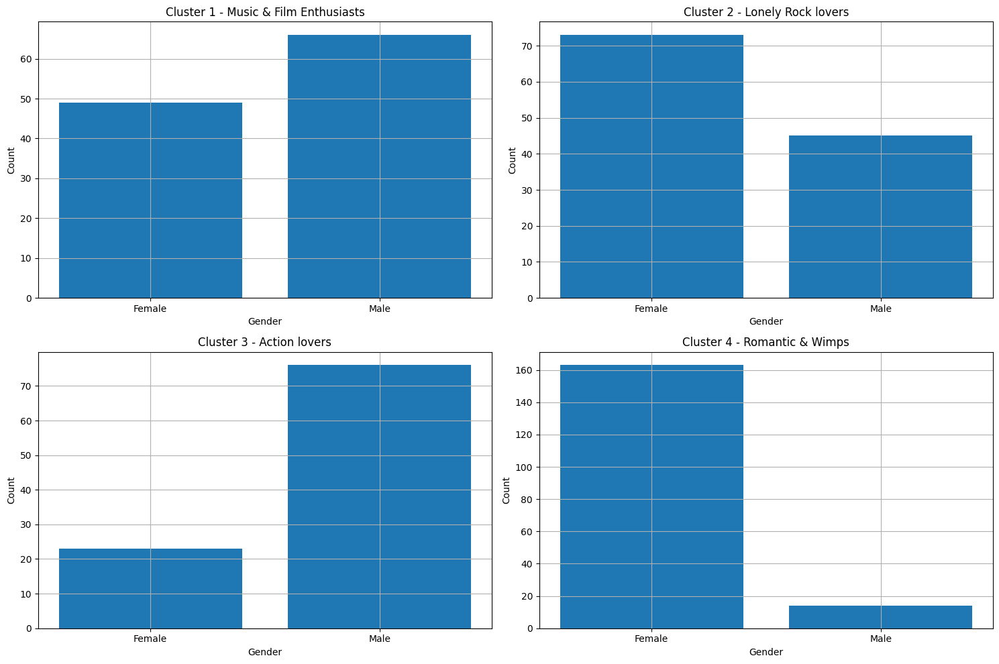

In [147]:
external_evaluation_label(y_pred_std_drop, encoded_df_combined.dropna(), Y_Xstd_df_drop_m, kmean_std_drop, cluster_std_drop_names, 'Gender')

###### Education

In [148]:
external_evaluation_metrics(y_pred_std_drop, encoded_df_combined.dropna(), 'Education')

Metrics
1. Adjusted Rand Index: 0.00469258812429795
2. Normalized Mutual Information: 0.020983530263927797
3. Homogeneity: 0.024061097906211054
4. Completeness: 0.018603964708438704
5. V-measure: 0.0209835302639278


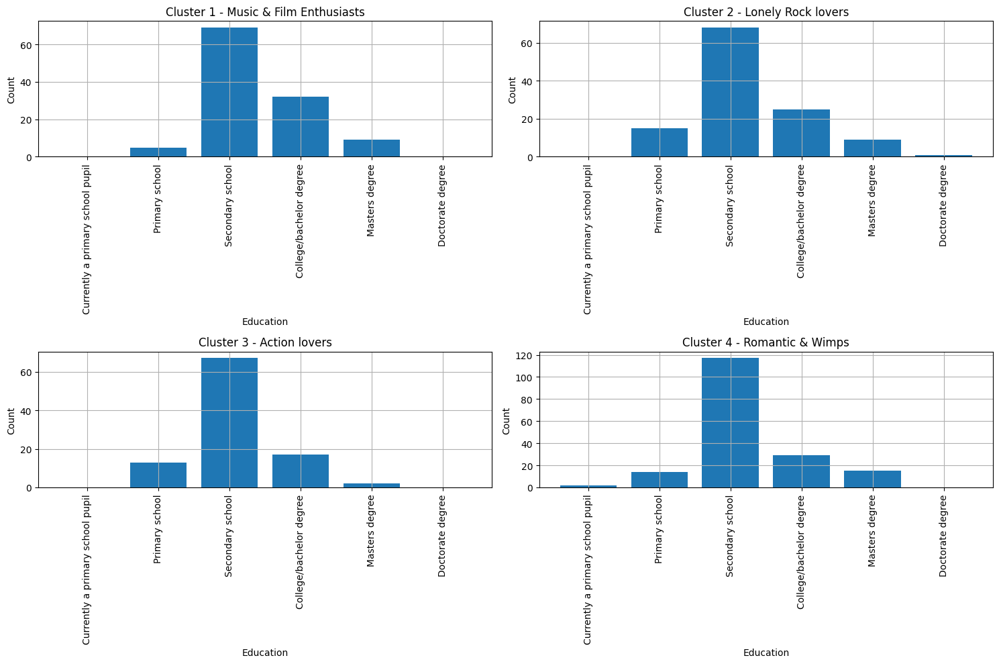

In [149]:
external_evaluation_label(y_pred_std_drop, encoded_df_combined.dropna(), Y_Xstd_df_drop_m, kmean_std_drop, cluster_std_drop_names, 'Education')

###### Age

In [150]:
external_evaluation_metrics(y_pred_std_drop, encoded_df_combined.dropna(), 'Age')

Metrics
1. Adjusted Rand Index: -0.0026342473040261763
2. Normalized Mutual Information: 0.028886841070208467
3. Homogeneity: 0.023009327824037477
4. Completeness: 0.038797220981133834
5. V-measure: 0.028886841070208467


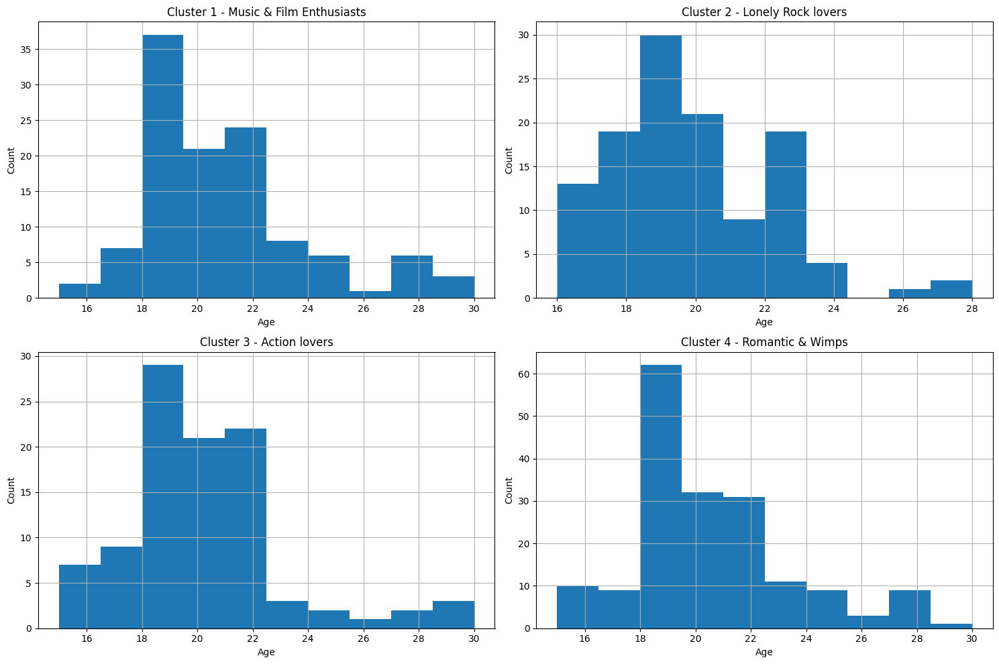

In [151]:
external_evaluation_label(y_pred_std_drop, encoded_df_combined.dropna(), Y_Xstd_df_drop_m, kmean_std_drop, cluster_std_drop_names, 'Age')

###### Observations:
For both 'Age' and 'Education' similar remarks can be done as the ones in Xstd_df.

##### 5.2.1.2) Internal evaluation

In [152]:
internal_eval(Y_Xstd_df_drop_m, kmean_std_drop, max_value_std_drop, cluster_std_drop_names)

,Silohuette Score
Music & Film Enthusiasts,0.174635
Lonely Rock lovers,0.164155
Action lovers,0.152625
Romantic & Wimps,0.207238
Global,0.179262


###### Observations:
Once again, the low silhouette scores suggest a poor clustering.

##### 5.2.2) Xmm_df_drop

###### 5.2.2.1) External evaluation

###### Gender

In [153]:
external_evaluation_metrics(y_pred_mm_drop, encoded_df_combined.dropna(), 'Gender')

Metrics
1. Adjusted Rand Index: 0.2333585582097583
2. Normalized Mutual Information: 0.2040773097416119
3. Homogeneity: 0.2662983139043177
4. Completeness: 0.16542541184513557
5. V-measure: 0.20407730974161192


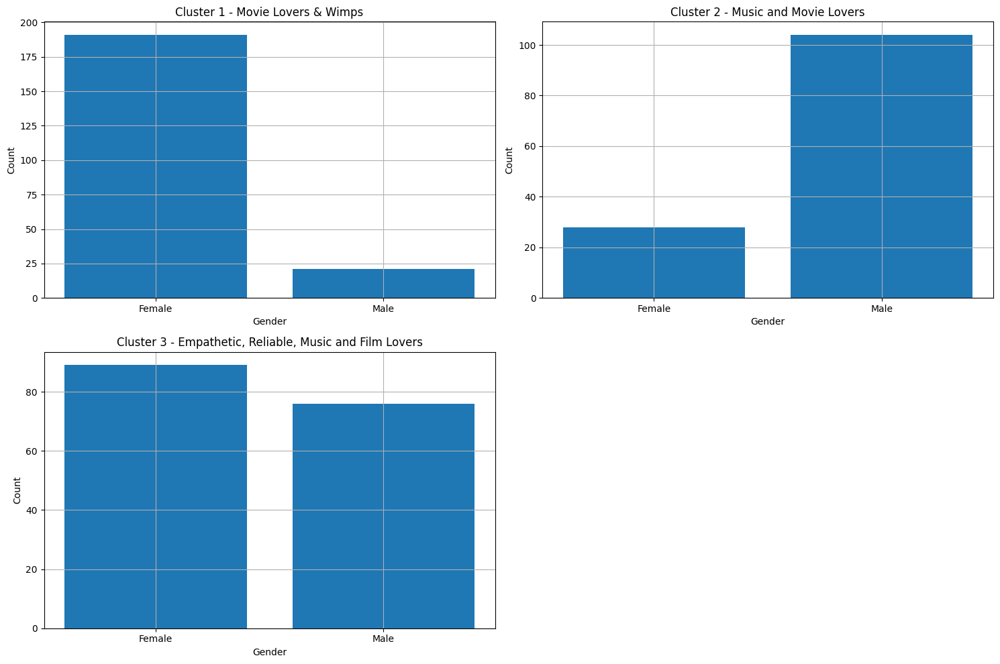

In [154]:
external_evaluation_label(y_pred_mm_drop, encoded_df_combined.dropna(), Y_Xmm_df_drop_m, kmean_mm_drop, cluster_mm_drop_names, 'Gender')

###### Education

In [155]:
external_evaluation_metrics(y_pred_mm_drop, encoded_df_combined.dropna(), 'Education')

Metrics
1. Adjusted Rand Index: 0.00018365467760817392
2. Normalized Mutual Information: 0.01851700692022421
3. Homogeneity: 0.018762210576327754
4. Completeness: 0.01827812972517752
5. V-measure: 0.01851700692022421


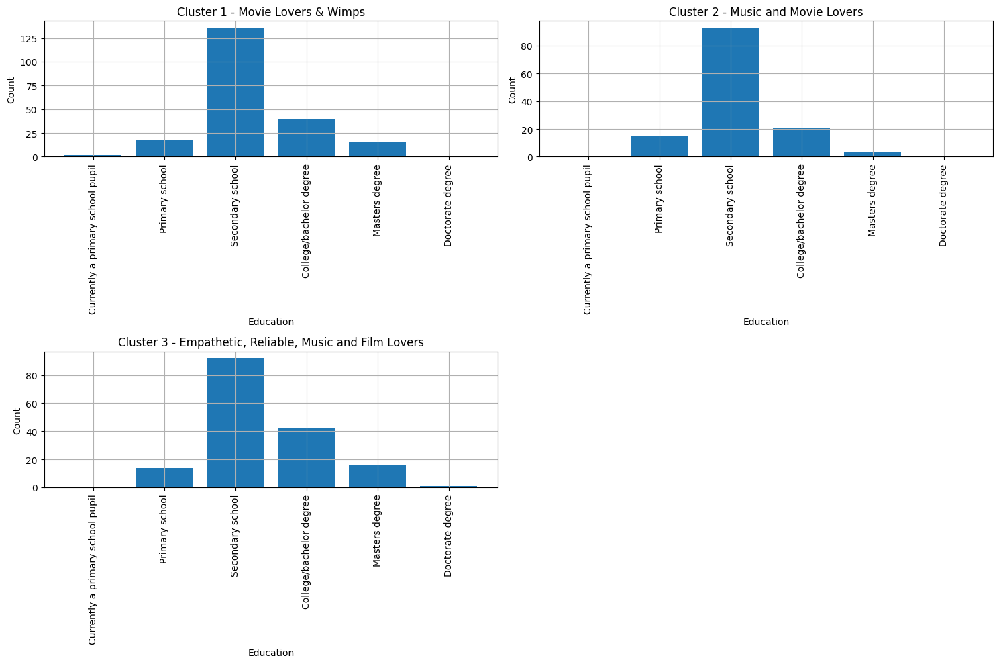

In [156]:
external_evaluation_label(y_pred_mm_drop, encoded_df_combined.dropna(), Y_Xmm_df_drop_m, kmean_mm_drop, cluster_mm_drop_names, 'Education')

###### Age

In [157]:
external_evaluation_metrics(y_pred_mm_drop, encoded_df_combined.dropna(), 'Age')

Metrics
1. Adjusted Rand Index: -0.0019553626887429793
2. Normalized Mutual Information: 0.018751226195991184
3. Homogeneity: 0.013788728737095331
4. Completeness: 0.029293994611614436
5. V-measure: 0.018751226195991184


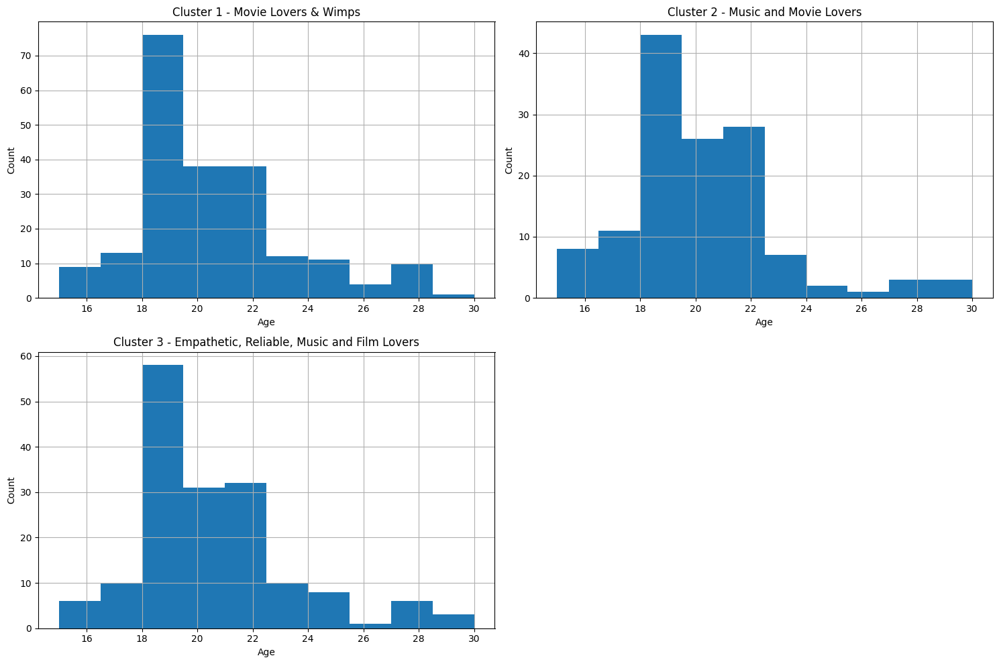

In [158]:
external_evaluation_label(y_pred_mm_drop, encoded_df_combined.dropna(), Y_Xmm_df_drop_m, kmean_mm_drop, cluster_mm_drop_names, 'Age')

###### 5.2.2.2) Internal evaluation

In [159]:
internal_eval(Y_Xmm_df_drop_m, kmean_mm_drop, max_value_mm_drop, cluster_mm_drop_names)

,Silohuette Score
Movie Lovers & Wimps,0.221230
Music and Movie Lovers,0.153861
"Empathetic, Reliable, Music and Film Lovers",0.156186
Global,0.182674


##### Observations:
The results are not so different from the ones we already obtained in the other cases.

## 6. Conclusions and final considerations

The analysis on this document was conducted on the Young-People-Survey (YPS) dataset containing answers by the friends of students the Faculty of Social and Economic Sciences of the University of Bratislava.
The whole dataset is composed of 1010 rows and 150 columns, but we were asked to select the two thirds. The dataset that we used has 673 rows and 92 columns, 10 of which are labels.

First, a whole preprocessing phase was done on the dataset, where we performed a customized label encoding for the columns where it was needed and then analyzed the missing values. Since the rows containing missing values were quite a lot, namely about 25% of the entire dataset, in addition to only trying the easier path by dropping them, we performed a variety of classification methods to replace the missing values, doing so after a learning phase with the grid-search method to find the best classifier, among those we have selected, for each category of features. 

We decided to keep both datasets in order to prove empirically which one performs better in terms of k-means clustering, by observing the silhouette-scores. In the PCA phase, we also definied the standardized and the min-max scaled dataframes for both the 'filled' and 'dropped' datasets, so from that moment on, every task was performed on four distinct dataframes.
We noticed that the first 5 principal components do not reach 30% of explained variance in any case. There are several reasons why the first principal components may not explain a significant fraction of the total variance in the data. Firstly, the high dimensionality of the dataset, combined with poor correlation between features, results in a distribution of variance in multiple directions in feature space. As a result, each principal component captures only a limited portion of the total variance, requiring a large number of components to represent a significant fraction of it. Secondly, the inherently complex nature of the data, reflecting personal tastes and subjective preferences, further contributes to this variance dispersion. Unlike phenomena that follow well-defined physical or biological laws, personal tastes are influenced by a multitude of individual and contextual factors that are often difficult to quantify and model. This inherent heterogeneity results in a complex variance structure that cannot be effectively captured by a few main components. Therefore, the low variance explained by the first components does not necessarily indicate a failure of the PCA analysis, but rather reflects the complexity and multidimensional nature of the analysed data.

Next, we applied the k-means algorithm to each of the four datasets. Through an exhaustive search of the hyperparameters using a parameter grid, we identified the configuration that maximised the silhouette score, thereby optimising internal cohesion and cluster separation. The subsequent analysis focused on the characterisation of the obtained clusters, examining the nature of the centroids. The objective was to assign a meaningful name to each cluster, based on the identification of the features and principal components that contributed most to it. 

The external and internal evaluation metrics did not give satisfactory results, which was what we could expect the projected data on 5 principal components with low explained variance.

In the final phase of the project, we conducted both an internal and external evaluation of the clusters obtained. The internal evaluation was based on silhouette score analysis for each cluster, providing a measure of their cohesion and separation. For the external evaluation, we compared the clusters with three external labels: age, gender and educational level. This comparison, supported by metrics such as the Adjusted Rand Index, Normalized Mutual Information, Homogeneity, Completeness and V-measure, aimed to understand the distribution of these labels within the clusters and to assess the correspondence between cluster structure and external information. Finally, the comparison of global silhouette scores between datasets with imputed (‘filled’) missing values and those with rows containing removed (‘dropped’) missing values showed no significant differences. This result suggests that the imputation of missing values by classification methods, although not showing high accuracy in the learning phase, did not have a negative impact on the clustering results, considering that the missing values for each row accounted for a maximum of 7.61% of the features.